<a href="https://colab.research.google.com/github/dolmani38/Summary2/blob/main/GAN_based_Korean_summarizer_using_semi_abstractive_method_v3.4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GAN based Korean summarizer using semi abstractive method


---
이훈석(1), 안순홍(2), 김승훈(교신)

---

# Abstract

 최근 NLP 분야는 encoder, decoder 및 attention을 거쳐 각종 transformer 모델이 나오면서 비약적인 발전을 이루고 있다. 문서 요약도 transformer에 의해 추상적인 요약이 가능해 졌다. 하지만 한국어의 경우, 양질의 대량 요약 학습셋이 갖추어져 있지 않아, 추상적인 요약 모델 개발 진행이 느리다. 비지도학습의 추출 요약을 사용할 수 있으나, 전반적 내용이 아닌 지협적 요약이 이루어진다는 단점이 있다. 이러한 단점을 극복하기 위해 본 연구에서는 요약 학습셋 없이 원문에서 요약에 필요한 어절을 추출하여 GAN 알고리즘에 의해 새로운 요약문을 생성하는 반추상적 방법 (Semi Abstractive Method, SAM) 을 제안한다. 
  실험에 의해 비지도학습으로 문서 전반적인 내용의 유사성과 문법의 정합성을 유지하며 요약이 되어짐을 확인하여 본 제안 방법의 우수성을 입증한다.  

Recently, the NLP field is making a leap forward with as various transformer models come out through encoder, decoder and attention. Document summarization is also possible for abstract summarization by transformer. However, in the case of Korean language, the development of abstract summary models is slow because there is no high-quality mass summary learning data set. An extractive summary method as a unsupervised learning can be used, but it has the disadvantage that an isthmus summary is made rather than the overall content. In order to overcome these obvious flaw, In this paper, we proposes a semi-abstractive method (SAM) that extracts words necessary for summary from the original text without a summary learning data set and generates a new summary by GAN algorithm. We show the distinction of this proposed method by demonstrating that it maintains the similarity of the overall contents of the document and the consistency of the grammar through experiments.


#1. Introduction

ref : https://www.machinelearningplus.com/nlp/text-summarization-approaches-nlp-example/

뉴스 사이트를 열 때 모든 뉴스 기사를 처음부터 끝까지 모두 읽지는 않습니다. 일반적으로 짧은 뉴스 요약을 살펴본 다음 관심이있는 경우 자세한 내용을 읽는다. 최근 잡지, 뉴스 애그리 게이터 앱, 조사 사이트 등과 같은 모든 곳에서 뉴스에 대한 짧고 유익한 요약이 제공된다.

중요한 정보를 잃지 않고 원본 거대한 텍스트에서 이러한 요약을 추출하는 방법을 텍스트 요약이라 한다. 요약은 문법적으로 읽기 편하며 중요한 것을 묘사하는 것이 필수적이다.

실제로 Google 뉴스, inshorts 앱 및 기타 다양한 뉴스 수집기 앱은 텍스트 요약 알고리즘을 활용하고 있다.

최근 요약 알고리즘의 트렌드에 대해 살펴본다.

When you open a news site, not all news articles are read from start to finish. In general, go through a short news summary and then read the details if you are interested. Short and informative summaries of news are available everywhere, such as in recent magazines, news aggregator apps, and research sites.

The method of extracting these summaries from the original large text without losing important information is called text summaries. The summary is grammatically easy to read and it is essential to describe what is important.

In fact, Google News, the inshorts app, and many other news aggregator apps utilize text summarization algorithms.

Let's look at the trend of the recent summary algorithm.

텍스트 요약 방법은 추출 방법과 추상 방법의 두 가지 주요 범주로 그룹화 할 수 있습니다.

> * 추출 텍스트 요약

> 먼저 개발 된 전통적인 방법으로서 주요 목표는 텍스트의 중요한 문장을 식별하고 요약에 추가하는 것이다. 얻은 요약에는 원본 텍스트의 정확한 문장이 포함되어 있다는 점에서 많이 활용되고 있다.

> * 추상적인 텍스트 요약

> 그것은 더 진보 된 방법이며, 최근 많은 연구가 진행되고 있다. 접근 방식은 중요한 섹션을 식별하고 컨텍스트를 해석하며 새로운 방식으로 재생산하는 것이다. 이렇게하면 핵심 정보가 가능한 가장 짧은 텍스트를 통해 전달된다. 여기서는 원본 텍스트에서 추출한 문장이 아니라 요약 된 새로운 문장이 생성된다.

본 논문에서는 추상적인 텍스트 요약 방법으로서 원문에서 문장이 아닌 어절 단위로 추출하여 적절한 문법적 흐름과 원문의 내용을 포함한 새로운 문장들을 생성하므로 원본 텍스트를 요약하고자 한다.


Text summary methods can be grouped into two main categories: extractive methods and abstractive methods.

> * Extractive text summary

> As a traditional method developed first, the main goal is to identify important sentences in the text and add them to the summary. The summary obtained is widely used in that it contains the exact sentence of the original text.

> * Abstractive text summary

> It is a more advanced method, and a lot of research is currently underway. The approach is to identify important sections, interpret context, and reproduce in new sentences. In this methods, key information is conveyed through the shortest possible text. In this approach, a new summary sentence is created, not the sentence extracted from the original text.

In this paper, as an abstractive text summary method, the original text is summarized by extracting the original text in terms of words, not sentences, and generating new sentences including the proper grammatical flow and contents of the original text.

#2. Related Work

먼저 추출 방법에 대한 기존 연구들을 살펴 보면 다음과 같다.

> Luhn [4]는 1960 년 Hans Peter Luhn에 의해 개발된 방법으로서 TF-IDF (Term Frequency-Inverse Document Frequency)를 기반으로 문장의 중요도를 채점하여 상위 점수의 문장을 추출하는 방식이다. 
> 이러한 개념을 발전시켜 2004년 Rada Mihalcea and Paul Tarau에 의해 TextRank[1] 방법과  G¨une¸s Erkan에 의해 LexRank [2] 추출 알고리즘이 개발되었다.
> 이후 2005년 Susan T. Dumais에의해 LSA [3] (잠재적 의미 분석) 라는 비지도 학습 알고리즘이 개발되었다. 이는 용어 문서 빈도 행렬에 SVD (Singular Value Decomposition)를 적용하여 의미 론적 의미 문장을 추출한다.
> KL-Sum [5] 은 Aria Haghighi에 의해 2009년 개발 되었다. 원문의 단어 분포와 문장별 단어 분포의 KL-divergence을 계산하여 문장을 선택한다. 

First, looking at the existing studies on the extraction method are as follows.

Luhn [4], a method developed by Hans Peter Luhn in 1960, is a method of extracting the highest scored sentences by scoring the importance of sentences based on TF-IDF (Term Frequency-Inverse Document Frequency). By developing this concept, the TextRank [1] method and the LexRank [2] extraction algorithm were developed by Rada Mihalcea and Paul Tarau in 2004 and by G¨une¼s Erkan. In 2005, Susan T. Dumais developed an unsupervised learning algorithm called LSA [3] (Potential Semantic Analysis). This extracts semantic semantic sentences by applying SVD (Singular Value Decomposition) to the term document frequency matrix. KL-Sum [5] was developed in 2009 by Aria Haghighi. A sentence is selected by calculating the KL-divergence of the word distribution in the original text and the word distribution by sentence.


하지만, 문서 일부 문장의 발췌만으로는 문서 전반적 내용을 포함하는 요약은 할 수는 없다. 
추상적인 요약은 전체 텍스트를 가장 잘 표현할 수있는 새로운 문장을 생성하는 새로운 최첨단 방법입니다. 
이것은 요약을 위해 원본 텍스트에서 문장을 선택하는 추출 방법보다 인간의 요약에 가까운 내용을 만들어 낸다.

> 추상적인 요약은 사실 원문의 문맥이 파악되어야 한다. NLP의 연구에서 문맥이 파악되는 중요한 단계는 바로 2014년에 발표됐던 sequence-to-sequence (Seq2seq)와 Attention 모델이다. (Sutskever et al., 2014, Cho et al., 2014). 이 모델을 기초하여 수많은 개념들이 연구되어 왔다. 이후,  Transformer 모델이 2017년 Google에 의해 소개되며 NLP 학계의 큰 주목을 받게된다. 이는 기존의 CNN 과 RNN 이 주를 이뤘던 연구들에서 벗어나 아예 새로운 모델을 제안하며 Seq2seq와 Attention, 이어 기계번역 성능을 한차원 높일 수 있었기 때문이다.
> 추상적인 요약은 긴 문장을 짧은 문장으로 바꾸는 일종의 기계 번역의 차원으로 다루고 있다. 따라서, 일반적으로 GPT-2, GPT-3, BERT, OpenAI, GPT, T5와 같은 각종 Transformer 모델에서 추상적인 요약 방법이 응용되고 있다.

Abstract summarization is a new state-of-the-art method of generating new sentences that best represent the entire text. This produces a content closer to human summary than the extraction method of selecting sentences from the original text for summary purposes.

> For abstract summaries, in fact, the context of the original text must be grasped. An important step in understanding the context in NLP's research is the sequence-to-sequence (Seq2seq) and Attention model, which was released in 2014. (Sutskever et al., 2014, Cho et al., 2014). Numerous concepts have been studied based on this model. After that, the Transformer model was introduced by Google in 2017 and received great attention from NLP academia. This is because we were able to improve machine translation performance to the next level, following Seq2seq and Attention, by proposing a new model, breaking away from the studies that were dominated by the existing CNN and RNN.

> Abstract summarization is treated as a kind of machine translation that turns long sentences into short sentences. Therefore, in general, abstract summary methods are applied in various Transformer models such as T5[6] (ref : Colin Raffel. (2020). Exploring the Limits of Transfer Learning with a Unified
Text-to-Text Transformer, https://arxiv.org/pdf/1910.10683.pdf), BART Transformer [7] (ref : Mike Lewis, (2019). BART: Denoising Sequence-to-Sequence Pre-training for Natural Language Generation, Translation, and Comprehension, https://arxiv.org/pdf/1910.13461.pdf), GPT-2 Transformers [8] (ref : Alec Radford, (2018). Language Models are Unsupervised Multitask Learners, https://d4mucfpksywv.cloudfront.net/better-language-models/language_models_are_unsupervised_multitask_learners.pdf), XLM Transformers [9] (ref : Guillaume Lample, (2019). Cross-lingual Language Model Pretraining, https://arxiv.org/pdf/1901.07291.pdf)

또한 원문을 '원본'으로 보고 요약을 원문에 대한 '모조'의 개념으로 보면, GAN 학습 알고리즘 또한 추상적인 요약의 주요 뼈대를 이루는 방법론이라 할 수 있다.

> 문장 생성기 출력을 사람이 읽을 수 있도록 만들기 위해 GAN 알고리즘을 적용하는 연구들이 있었다. GAN을 문장 생성에 적용하는 데있어 가장 큰 문제는 자연어의 이산 적 특성입니다. 단어 시퀀스를 생성하기 위해 생성기는 일반적으로 argmax 또는 matching과 같은 원래의 GAN 알고리즘에 대해 실패를 유발하는 기타 샘플 함수와 같은 비차 등 부분을 가지고 있다.
(Gulrajani et al., 2017)에서 저자는 개별 단어 시퀀스를 제공하는 대신 생성기 출력 레이어를 판별기에 직접 제공합니다. 이 방법은 이산 분포와 연속 분포 사이의 거리를 평가할 수있는 (Arjovsky et al., 2017)에서 제안한대로 GAN에서 Earth Mover (EM) distance를 사용하기 때문에 효과적입니다.
SeqGAN (Yu et al., 2017)은 강화 학습으로 시퀀스 생성 문제를 다룹니다. 여기서는이 접근 방식을 적대적 REINFORCE라고합니다. 그러나 판별 기는 전체 시퀀스의 품질 만 측정하므로 보상이 극히 드물고 모든 생성 단계에 할당 된 보상이 모두 동일합니다. MC search (Yu et al., 2017)는 각 시간 단계에서 대략적인 보상을 평가하기 위해 제안되었지만이 방법은 높은 시간 복잡성을 가지고 있습니다.
이 아이디어에 따라 (Li et al., 2017)는 각 시간 단계에서 예상되는 보상을 평가하기위한 부분 평가 접근법을 제안했었다.

 Looking at the original text as the 'original' and the summary as the concept of 'imitation' of the original text, the GAN learning algorithm can also be said to be a methodology that forms the main framework of the abstract summary.

> There have been studies of applying the GAN algorithm to make the output of the sentence generator human-readable. The biggest problem in applying GAN to sentence generation is the discrete nature of natural language. To generate a word sequence, the generator usually has parts such as non-differences, such as argmax or other sample functions that cause failures against the original GAN algorithm, such as matching.
In (Gulrajani et al., 2017), the author provides a generator output layer directly to the discriminator instead of providing individual word sequences. This method is effective because it uses the Earth Mover (EM) distance in GAN, as suggested by (Arjovsky et al., 2017), which allows you to evaluate the distance between the discrete and continuous distributions.
SeqGAN (Yu et al., 2017) deals with sequence generation problems with reinforcement learning. This approach is referred to here as hostile REINFORCE. However, since the discriminator only measures the quality of the entire sequence, the rewards are extremely rare and the rewards assigned to all stages of creation are all the same. MC search (Yu et al., 2017) was proposed to evaluate the approximate reward at each time step, but this method has a high time complexity.
Following this idea (Li et al., 2017) had proposed a partial assessment approach to assess the expected reward at each time step.

이상에서 설펴본 바와 같이, Transformer와 GAN 기법의 머지를 통해 비지도학습적 추상적인 요약을 실현 할 수 있을 것으로 착안하였다. 다음 섹션에서 Transformer를 사용하여 discriminator를 구현하고 GAN 기법에 의해 Generator를 학습하는 본 논문에서 제안하는 요약 방법을 설명한다.


As discussed above, it was conceived that unsupervised learning abstract summarization could be realized through merging of Transformer and GAN techniques. In the next section, we describe a summary method proposed in this paper that implements a discriminator using a transformer and learns a generator using a GAN technique.

#3. Proposed Method

본 논문에서 제안하는 방법은 Extractive 방식을 조합한 Semi Abstractive method라 할 수 있다. 원문을 어절별로 모두 나누고 이를 재조합하여 전체 내용을 요약한 몇개의 문장을 생성한다.

 이를 위해, Generator는 원문 어절의 개수 만큼의 noise를 input으로 받으며 
원문 어절의 개수 만큼의 output을 갖는다. 이때 output은 각 원문의 어절이 요약에 활용되는 확율값에 해당한다. 따라서, 특정 확율값 또는 주어진 어절의 개수에 해당하는 상위 순위의 확률값에 해당하는 어절을 선택하여 요약문을 생성한다. Similarity function에 의해서 원문으로부터 골자 어절들(frame terms)을 추출하고 이를 Generator에 bias로 입력한다. 이를 통해 Generator는 주요 어절들에 높은 확률값을 우선 할당하며, 이후 한국어 문법 discriminator에 의해 임의 생성된 문장이 문법적으로 사람이 읽을 수 있는 문장인지 구분한다. 또한 원문 유사성을 구분하는 유사도 discriminator에 의해 임의 생성된 문장이 원문 내용과 상이하지 않도록 조정한다.
전체 아키텍처는 아래 그림과 같다. 


The method proposed in this paper can be called a semi abstractive method that combines the extractive method. Divide the original text by word and reassemble it to create several sentences that summarize the entire contents.

For this purpose, the Generator receives noise as much as the number of original words as input and has output as much as the number of original words. And then, the output corresponds to the probability value used for summarizing the words of each original text. Therefore, a summary sentence is generated by selecting a word corresponding to a specific probability value or a probability value of the highest ranking corresponding to the number of given words. Frame words are extracted from the original text by similarity function and these are input as bias to the generator. Through this, the Generator first allocates a high probability values to the frame words, and then identifies whether the randomly generated sentences by the Korean grammar discriminator are grammatically human-readable sentences. Also, the similarity, which distinguishes the similarity of the original text, is adjusted so that the randomly generated sentences by the discriminator do not differ from the original text. The overall architecture is shown in the figure below.

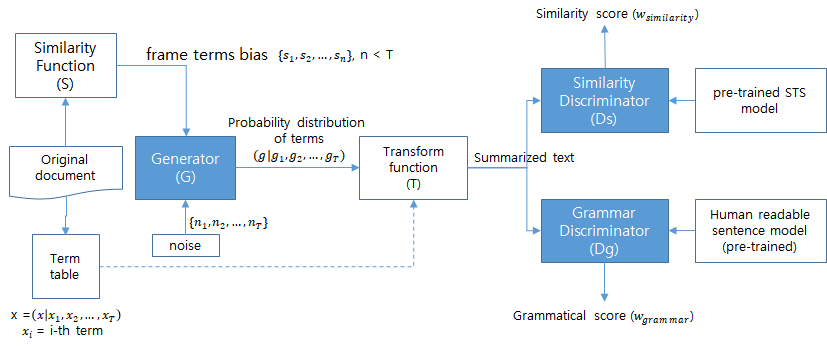

##3.1 Similarity function을 이용한 frame word의 추출

Document를 word 단위(여기서 말하는 word 단위는 띄어쓰기 단위를 의미)로 나눈다. 각각의 word을 xi 라고 할 때 Document는 다음과 같이 나타낼 수 있다.

Document

Split the document into word units (the word unit here means spaces). When each word is called xi, the document can be expressed as follows.

Document

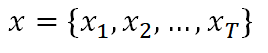


각 word에 대한 전체 document의 Similarity Probability Distribution (SPD)는 아래와 같이 나타낼 수 있다

The Similarity Probability Distribution (SPD) of the entire document for each word can be expressed as follows.


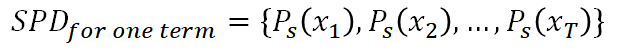


이를 연속적 Signal 이라 보고, Signal의 peak에 해당하는 word을 추출하여 이를 전체 document의 요약에 해당하는 frame words으로 구성하고자 한다.

그러나 document story상, 예를 들어 주인공을 지칭하는 word의 경우 전체 Similarity에 지배적 영향을 주게되고 signal의 peak는 해당 word들로만 구성 될 수가 있다. 결국, 원하는 frame을 얻지 못하게 된다. 이를 극복하기 위한 방법으로 복수의 words으로 구성된 story line의 SPD를 산출하여 사용한다. 만약 2개의 word인 경우 Similarity Probability는 다음과 같다.

This is regarded as a continuous signal, and a word corresponding to the peak of the signal is extracted, and it is composed of frame words corresponding to the summary of the entire document.

However, in the document story, for example, a word that refers to the protagonist has a dominant effect on the overall similarity, and the peak of the signal can consist only of the corresponding words. Eventually, the desired frame cannot be obtained. As a way to overcome this, the SPD of a story line composed of multiple words is calculated and used. If it is two words, the similarity probability is as follows.


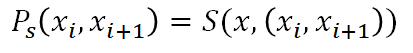


이때, 

At that moment,


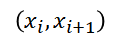

 의 구성은 일종의 Partial story 로서 filter의 역할을 하고, 전체 document를 convolution 한다.
만약 N개의 word을 filter로 사용한다면, 

The composition of this is a kind of Partial story that acts as a filter and convolutions the entire document.
If you use N words as a filter,

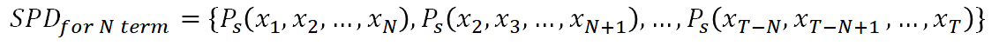


과 같이 된다. 

m개의 filter를 이용하여 frame words = s 를 아래와 같이 구성한다면

If frame words = s are composed as follows using m filters


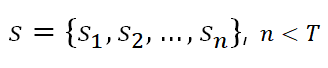



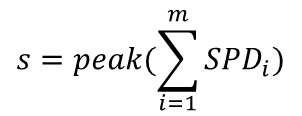


하지만 여기서 문제점은 SPD1~m 에서도 역시 주인공과 같은 지배적 word에 peak가 몰리고 story line에 해당하는 frame이 추출되지 못 할 수 있다는 것이다. 이를 극복하기 위해, peak를 추출하기 전에 SPD1의 값을 빼서 지배적 word의 peak를 회피하고 story line에 해당하는 frame을 추출 할 수 있도록 한다.


However, the problem here is that even in SPD1~m, the peak is concentrated in the dominant word like the main character, and the frame corresponding to the story line may not be extracted. To overcome this, before extracting the peak, the value of SPD1 is subtracted to avoid the peak of the dominant word, and the frame corresponding to the story line can be extracted.


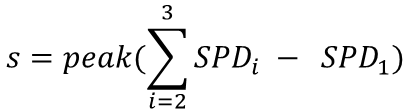

###3.1.1 Similarity function, S (Sentence-BERT)

(ref :Nils Reimers and Iryna Gurevych, (2019). Sentence-BERT: Sentence Embeddings using Siamese BERT-Networks ,https://arxiv.org/pdf/1908.10084.pdf)
를 기반으로 구현한다.

<font color='red'>BERT (Devlin et al., 2018) is a pre-trained transformer network (Vaswani et al., 2017), which set for various NLP tasks new state-of-the-art results, including question answering, sentence classification, and sentence-pair regression. The input for BERT for sentence-pair regression consists of the two sentences, separated by a special [SEP] token. Multi-head attention over 12 (base-model) or 24 layers (large-model) is applied and the output is passed to a simple regression function to derive the final label. Using this setup, BERT set a new state-of-the-art performance on the Semantic Textual Similarity (STS) benchmark (Cer et al.,2017). RoBERTa (Liu et al., 2019) showed, that the performance of BERT can further improved by small adaptations to the pre-training process. and the XLNet (Yang et al., 2019) is also widely used., but it led in general to worse results than BERT. </font>

Sentence-BERT(SBERT), a modification of the pretrained BERT network that use siamese and triplet network structures to derive semantically meaningful sentence embeddings that can be compared using cosine-similarity. <font color='red'>This reduces the effort for finding the most similar pair from 65 hours with BERT / RoBERTa to about 5 seconds with SBERT, while maintaining the accuracy from BERT. </font>

SBERT를 활용할 수 있는 pretrained model은 https://www.sbert.net/docs/pretrained_models.html 여기서 확인 할 수 있다.

본 논문에서는  한국어로 학습된 'xlm-r-large-en-ko-nli-ststb' 모델을 사용하였고, 이 모델의 STS Benchmark score는 84.05% 이다.

Pretrained models that can utilize SBERT can be found here: https://www.sbert.net/docs/pretrained_models.html.

In this paper, the'xlm-r-large-en-ko-nli-ststb' model learned in Korean was used, and the STS Benchmark score of this model was 84.05%.

SBERT를 구현한 python 라이브러리인 sentance-transformer package를 사용하여 Similarity function을 구현 하였다. 본 라이브러리는 BERT기반의 모델들과 유사하게 입력 limit가 있다. maximum 128 tokens을 입력할 수 있으며 1024 차원의 embedding된 vector를 반환한다. 즉, 전체 문서에 대해서 한번에 embedding할 수는 없으며, 이를 해결하기 위해 문서를 문장별로 나누어 N개의 문장에 대해 (N,1024)의 행렬로 embedding 하였다. similarity를 측정하기 위한 문장에 대해서도 (n,1024) 행렬화 하여 pair-wise하게 cosin distance를 계산한 (n,N) 행렬을 취득한 후 각 행별 최소값에 대한 평균값을 통해, 전체 문서에 대한 Similarity를 산출 하였다. 

Similarity function was implemented using sentance-transformer package, a python library implementing SBERT. Similar to BERT-based models, this library has an input limit. The input accepts a maximum of 128 tokens and returns a 1024-dimensional embedding vector. That is, it is not possible to embedding the entire document at once, and to solve this problem, the document is divided by sentence and embedding in a matrix of (N, 1024) for N sentences. After matrixing the sentences for measuring similarity (n,1024), the cosin distance is calculated pair-wisely to obtain the (n,N) matrix. After that, the average value of the minimum value for each row was taken, and the similarity for the entire document was calculated.

##3.2 keyBERT을 이용한 frame term의 추출

ref:Sharma, P., & Li, Y. (2019). Self-Supervised Contextual Keyword and Keyphrase Retrieval with Self-Labelling. https://www.preprints.org/manuscript/201908.0073/download/final_file

##3.3 한국어 문법 Discriminator, D

https://analyticsindiamag.com/how-to-use-bert-transformer-for-grammar-checking/

<font color='red'>
Jacob Devlin, (2019). BERT: Pre-training of Deep Bidirectional Transformers for Language Understanding
</font>

<font color='red'>* Impact of the BERT model<br>
BERT is a language representation model trained by huge data, huge models, and enormous computational overhead. It is optimal in 11 natural language processing tasks (state-of-the-art) , SOTA) results. It is estimated that many people will ridicule experiments of this scale, which are basically out of reach for general laboratories and researchers, but it does give us a lot of valuable experience. The reason for the high-performance of the BERT model is due to two points. In addition to the improvement of the model, it is more important to use a large data set (BooksCorpus 800M + English Wikipedia 2.5G words) and a large computing power. Pre-training on related tasks, achieving monotonous growth in performance on target tasks.

* Overview of Task<br>
Now the task which we are to do is to predict whether a sentence is grammatically correct or not. We choose a dataset in which we are given a piece of text and along with it a label .which is referred to as the “whether it is grammatically correct or not”.<br>
0 means grammatically incorrect and 1 means grammatically correct.<br>
So essentially this problem translates into a text classification problem where we classify whether a sentence is grammatically correct or not.
* Getting started with Modeling<br>
We’ll use [The Corpus of Linguistic Acceptability (CoLA)](https://nyu-mll.github.io/CoLA/) dataset for single sentence classification. It’s a set of sentences labelled as grammatically correct or incorrect. It was first published in May of 2018 and is one of the tests included in the “GLUE Benchmark” on which models like BERT are competing </font>


한국어 문법의 정합성을 구분하기 위해 BERT기반 문장 classification을 구성한다. 한국어 pre-trained model 'monologg/kobert' 을 기반으로 약 3만개의 한국어 단일 문장을 fine-tunning 하였다. 정상 문장의 경우 label = 1, 문법적으로 비정상 문장은 label = 0 으로 labeling하였으며, 비정상 문장은 단순하게 정상문장을 shuffling 해서 만들었다. epoch 4회, 3천개의 validation set으로 성능 측정결과 F1 score 0.99가 나왔다.

In order to classify the consistency of Korean grammar, we construct BERT-based sentence classification. About 30,000 Korean single sentences were fine-tuned based on the Korean pre-trained model'monologg/kobert'. For normal sentences, label = 1, grammatically abnormal sentences were labeled as label = 0, and abnormal sentences were made by simply shuffling the normal sentences. As a result of measuring the performance with epoch 4 times and 3,000 validation sets, an F1 score of 0.99 was obtained.

## 3.4 한국어 Text Generator, G

Text Generator는 단순화 하기 위해 일반 DNN을 사용하였다. 원문의 전체 words의 개수에 해당하는 random noise와 Frame words를 bias로 입력받는다. 즉, 입력항이 2개이며 Output은 어떤 word가 요약에 사용될지 모르기 때문에 입력과 동일하게 원문 전체 word의 개수와 같다.

Text Generator used general DNN for simplification. Random noise and frame words corresponding to the total number of words in the original text are input as a bias. That is, there are two input terms and the output is equal to the number of words in the original text as it is the same as the input because we do not know which word will be used for the summary.


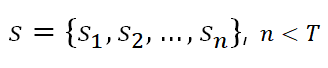

random noise 는 dense layer 몇 개를 거치지만 Frame words bias는 동일 차원의 output 바로 직전에 deep network의 output tensor에 add 된다. 이로서 전체 output은 frame words에 bias 되어 원문이 요약된 문장이 생성된다. 또한 random noise에 의해 frame words 각각의 사이에 적절한 word가 원문에서 추출 되는 것이다. 이후, 생성된 probability distribution (Output)에서 요약에 사용되는 word는 아래의 조건에 의해서 선택된다.

Random noise goes through several dense layers, but frame words bias is added to the output tensor of the deep network just before the output of the same dimension. As a result, the entire output is biased to the frame words, and a sentence summarizing the original text is generated. Also, appropriate words between each frame words are extracted from the original text by random noise. Then, in the generated probability distribution (Output), the word used in the summary is selected according to the following conditions.


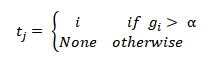

여기서 α 값을 조절 하므로 생성되는 text의 길이를 조절 할 수 있다. 적절한 α값을 통해 문법적으로 읽을 수 있는 글이 생성된다. 
마지막으로 선택된 t vector는 x에서 선택된 order에 해당되며 x[t] 연산에 의해서 text가 생성된다.


전체적인 구성은 아래와 같다. 

Here, you can adjust the length of the generated text by adjusting the α value. A text that can be read grammatically is generated through an appropriate α value.
Finally, the selected t vector corresponds to the order selected from x, and text is created by the x[t] operation.


The overall composition is as follows.

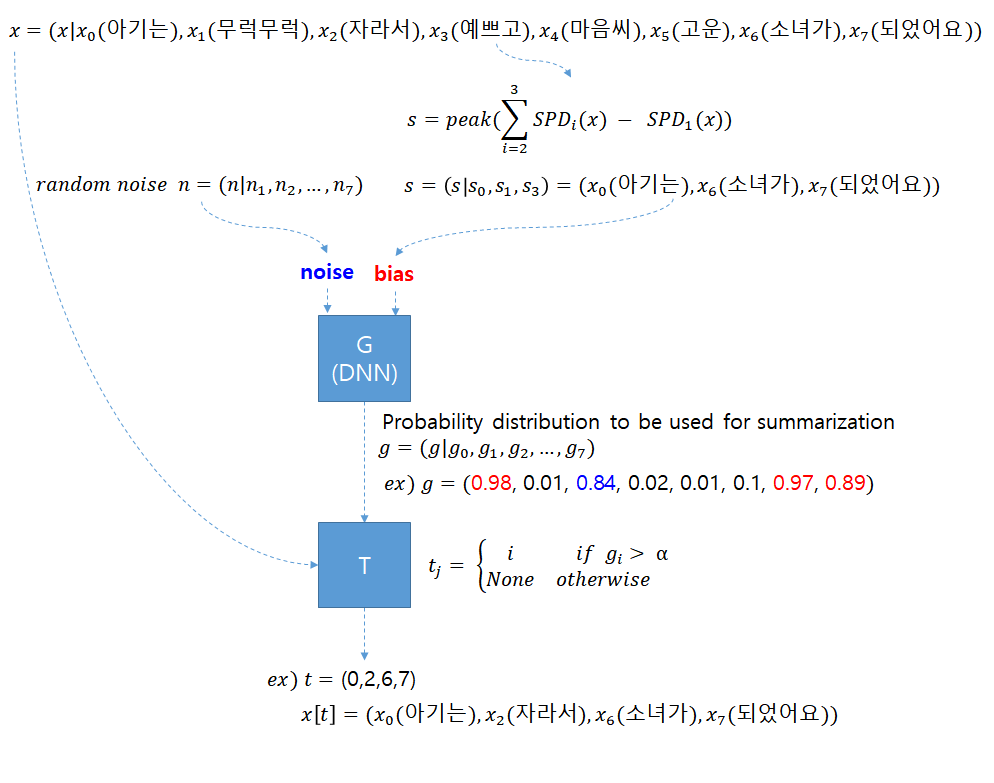

##3.5 GAN Training

GAN의 논문 (ref:Ian J. Goodfellow, (2014). Generative Adversarial Nets, https://arxiv.org/pdf/1406.2661.pdf) 에서 보면 value function V(G,D)에 대하여 다음을 만족시키는 과정에 의하여 학습이 이루어 진다.

In GAN's paper (ref:Ian J. Goodfellow, (2014). Generative Adversarial Nets, https://arxiv.org/pdf/1406.2661.pdf), the process that satisfies the following for value function V(G,D) Learning is achieved by

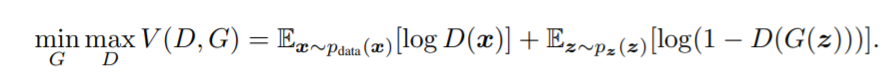

즉, D에 대한 cross-entory 

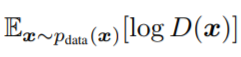

와 G에 대한 cross-entropy 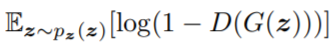

에 대한 최적화의 과정임을 알 수 있다.

본 논문에서 다루는 전체 목적함수는 아래와 같이 나타낼수 있다.


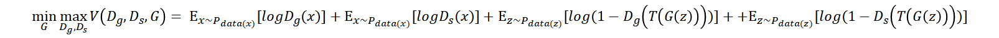

문제는 Discriminator 전에 Transform function T에 의해 G에서 생성한 probability distribution을 readable text 로 변환 하는 과정이 있는 것이다. 즉, T는 미분 불가능한 절차적 함수로서 D(T(G(z)))는 학습에 필요한 backward를 할 수 없다. 

이러한 문제는 GAN을 통한 Text 생성 알고리즘에서 빈번히 봉착하는 문제이며 논문 
(ref : Yau-ShianWang, (2018). Learning to Encode Text as Human-Readable Summaries using Generative Adversarial Networks) 에서는 'Self-Critic Adversarial REINFORCE'을 제안하였다. 해당 기법에서는 이산 시퀀스 ys를 판별기에 공급하기 때문에 판별 기의 기울기가 생성기로 직접 역 전파 할 수 없습니다. 여기에서는 정책 그라데이션 방법을 사용합니다. 타임 스텝 i에서, 우리는 식별기의 i ㆍ 1 타임 스텝 점수 si ㆍ 1를 자기 임계 기준선으로 사용합니다. 보상 rD i는 시간 단계 i의 시퀀스 품질이 시간 단계 i의 시퀀스 품질보다 더 좋은지 또는 더 나쁜지를 평가합니다. 1. D2의 생성자 보상 rD i는 다음과 같습니다.

The problem is that there is a process of converting the probability distribution generated in G into readable text by the transform function T before the discriminator. That is, T is a procedural function that cannot be differentiated, and D(T(G(z))) cannot perform backward required for learning.

These problems are frequently encountered in the text generation algorithm through GAN, and the paper (ref: Yau-ShianWang, (2018).Learning to Encode Text as Human-Readable Summaries using Generative Adversarial Networks) Suggested 'Self-Critic Adversarial REINFORCE'. In that technique generator feed a discrete sequence ys to the discriminator, the gradient from the discriminator cannot directly back-propagate to the generator. Here, we use the policy gradient method. At timestep i, we use the i 􀀀 1 timestep score si􀀀1 from the discriminator as its self-critical baseline. The reward rD i evaluates whether the quality of sequence in timestep i is better or worse than that in timestep i 􀀀 1. The generator reward rD i from D2 is

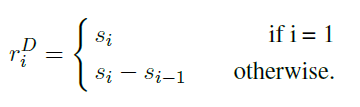

However, some sentences may be judged as bad sentences at the previous timestep, but at later timesteps judged as good sentences, and vice-versa. Hence we use the discounted expected reward d with discount factor to calculate the discounted reward di at time step i as


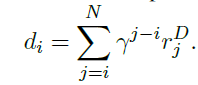

To maximize the expected discounted reward di, the loss of generator is:


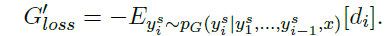


We use the likelihood ratio trick to approximate the gradient to minimize 

하지만 이러한 방식은 RNN에 의한 timeseries로 접근 할 때 가능하며, discounted reward d의 적용은 loss의 미분 폭이 매우 좁아서, 상당히 많은 시행 (epoch)과정이 필요하다.

따라서 본 논문에서는 cross-entropy를 loss로 사용하지 않고 변형된  wasserstein distance (Martin Arjovsky, (2017). Wasserstein GAN, https://arxiv.org/pdf/1701.07875.pdf)를 사용고자 한다. 

G(z)의 output (g|g1,g2,...gT)에 대하여 T 함수는 내부에 다음의 과정이 있다. 



We use the likelihood ratio trick to approximate the gradient to minimize

However, this method is possible when approaching the timeseries by RNN, and the application of discounted reward d has a very narrow differential width of the loss, requiring a considerable amount of epoch.

Therefore, in this paper, we intend to use the modified wasserstein distance (Martin Arjovsky, (2017). Wasserstein GAN, https://arxiv.org/pdf/1701.07875.pdf) without using cross-entropy as a loss.

For the output of G(z) (g|g1,g2,...gT), the T function has the following process inside.

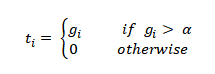

위에서 [알파]의 값은 요약 결과고 얻고자 하는 어절의 개수에 따라 결정된다. [알파]값이 크면 요약 결과 어절의 수가 작아지고 알파값이 작을 수로 요약 어절의 수가 많아 진다.

T(G(z))의 output의 예를 들면 다음과 같다.
(t|t1,t2,...tT) ~ (t|g1,0,0,g4,0,g6,...,0,gT)

이때
D(T(G(z))) = w

우리는 wasserstein distance을 loss로 사용하기 위해 

The value of [alpha] above is a summary result and is determined by the number of words to be obtained. The larger the [alpha] value, the smaller the number of words in the summary result, and the smaller the alpha value, the larger the number of summary words.

An example of the output of T(G(z)) is as follows. (t|t1,t2,...tT) ~ (t|g1,0,0,g4,0,g6,...,0,gT)

At this time, D(T(G(z))) = w

We use the wasserstein distance as the loss

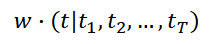

을 output으로 설정한다.

결과적으로 Generator의 loss는

Set to output.

As a result, the generator's loss is

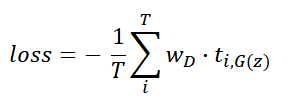

이렇게 함으로서 ti는 G의 output (g|g1...gT)의 일부로서, 미분가능 하고 backward를 통해 학습이 이루어 질 수 있다.

전체 목적 함수는 아래와 같다.

By doing this, ti is a part of G's output (g|g1...gT), which can be differentiated, and learning can be achieved through backward.

The overall objective function is as follows.

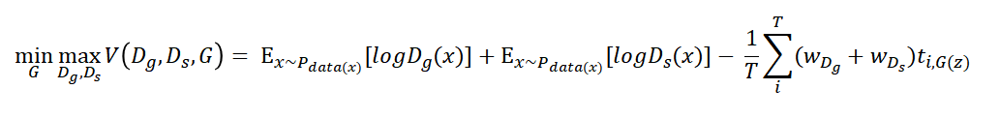

문법, 유사도 측정을 위한 각 Discriminator는 pre-trained model을 이용하여 일반화된 구분자로서 적용하였다.
그러나, 학습의 과정에서 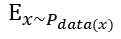

를 정의 할 수 없다. 이미, 요약된 실데이터를 만들수 없기 때문이다. 
그래서, 원문의 일부 문장을 대입하였더니, 학습이 진행되면서 원문의 일부로 overfitting 되는 경향이 나타났다. 즉, Extractive 방법의 결과로 수렴되는 것이다.
그래서, 본 논문에서는 Discriminator가 이미 pre-trained model에 의해 학습되어 있으므로 Discriminator를 학습에 참여 시키지 않았다. 따라서 최종 목적함수는 아래와 같이 단순화 하였다.

Each discriminator for measuring grammar and similarity was applied as a generalized delimiter using a pre-trained model. However, in the process of learning

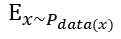


Cannot be defined. This is because it is not possible to create summarized real data already. So, after substituting some sentences from the original text, there was a tendency to overfitting as part of the original text as learning progressed. In other words, it converges as a result of the extractive method. So, in this paper, Discriminator was not involved in learning because the Discriminator has already been learned by the pre-trained model. Therefore, the final objective function is simplified as follows.

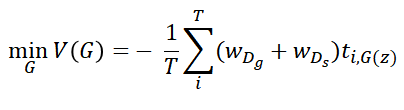

#4. Implementation


## 4.1 기본 설정...

In [1]:
if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install keybert
!pip install sentence-transformers==0.3.0
!pip install transformers==3.0.2

     |████████████████████████████████| 71kB 6.6MB/s 
     |████████████████████████████████| 1.8MB 17.3MB/s 
     |████████████████████████████████| 1.2MB 50.0MB/s 
     |████████████████████████████████| 890kB 53.8MB/s 
     |████████████████████████████████| 3.2MB 51.7MB/s 
  Created wheel for keybert: filename=keybert-0.2.0-cp36-none-any.whl size=10598 sha256=4fb4d4ab81724b62e2eea01d6b49c5ac9247d4afb7840540daecdedcde7df1b7
  Stored in directory: /root/.cache/pip/wheels/59/d7/16/04bab6677a4dfa9fd8ab2b350bac915d60f5378b83d6f5a372
  Created wheel for sentence-transformers: filename=sentence_transformers-0.4.1.2-cp36-none-any.whl size=103068 sha256=d289aaaf228abe73a0b5749c77b77252f6a0005bb5eb3343b9f63b8eb87a7200
  Stored in directory: /root/.cache/pip/wheels/3d/33/d1/5703dd56199c09d4a1b41e0c07fb4e7765a84d787cbdc48ac3
  Created wheel for sacremoses: filename=sacremoses-0.0.43-cp36-none-any.whl size=893261 sha256=cfaa1671763b10dd29f37f9f68eae13fa4265b6b68c7b93810856e88db49e7f4
  Stored i

In [3]:
import matplotlib.pyplot as plt
# set seeds for reproducability
from numpy.random import seed
seed(1)

import pandas as pd
import numpy as np
import string, os 

import urllib.request
import nltk
nltk.download('punkt')

import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [4]:
import tensorflow as tf
# Get the GPU device name.
device_name = tf.test.gpu_device_name()

# The device name should look like the following:
if device_name == '/device:GPU:0':
    print('Found GPU at: {}'.format(device_name))
else:
    print('GPU device not found')

Found GPU at: /device:GPU:0


In [5]:
import torch

# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
We will use the GPU: Tesla T4


In [6]:
# Print iterations progress
class ProgressBar:

    def __init__(self,total=20, prefix = '', suffix = '', decimals = 1, length = 20, fill = '|', printEnd = "\r"):
        self.total = total
        self.prefix = prefix
        self.suffix = suffix
        self.decimals = decimals
        self.length = length
        self.fill = fill
        self.printEnd = printEnd
        self.ite = 0

    def printProgress(self,iteration, text):
        self.ite += iteration
        percent = ("{0:." + str(self.decimals) + "f}").format(100 * (self.ite / float(self.total)))

        filledLength = int(self.length * self.ite // self.total)
        bar = self.fill * filledLength + '.' * (self.length - filledLength)
        print(f'\r{self.prefix} |{bar}| {percent}% {self.suffix}  {text}', end="", flush=True)
        # Print New Line on Complete
        if self.ite == self.total: 
            print()

In [7]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms

##4.2 Grammar Discriminator Class

In [8]:
# coding=utf-8
# Copyright 2018 Google AI, Google Brain and Carnegie Mellon University Authors and the HuggingFace Inc. team and Jangwon Park
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
""" Tokenization classes for KoBert model."""


import logging
import os
import unicodedata
from shutil import copyfile

from transformers import PreTrainedTokenizer


logger = logging.getLogger(__name__)

VOCAB_FILES_NAMES = {"vocab_file": "tokenizer_78b3253a26.model",
                     "vocab_txt": "vocab.txt"}

PRETRAINED_VOCAB_FILES_MAP = {
    "vocab_file": {
        "monologg/kobert": "https://s3.amazonaws.com/models.huggingface.co/bert/monologg/kobert/tokenizer_78b3253a26.model",
        "monologg/kobert-lm": "https://s3.amazonaws.com/models.huggingface.co/bert/monologg/kobert-lm/tokenizer_78b3253a26.model",
        "monologg/distilkobert": "https://s3.amazonaws.com/models.huggingface.co/bert/monologg/distilkobert/tokenizer_78b3253a26.model"
    },
    "vocab_txt": {
        "monologg/kobert": "https://s3.amazonaws.com/models.huggingface.co/bert/monologg/kobert/vocab.txt",
        "monologg/kobert-lm": "https://s3.amazonaws.com/models.huggingface.co/bert/monologg/kobert-lm/vocab.txt",
        "monologg/distilkobert": "https://s3.amazonaws.com/models.huggingface.co/bert/monologg/distilkobert/vocab.txt"
    }
}

PRETRAINED_POSITIONAL_EMBEDDINGS_SIZES = {
    "monologg/kobert": 512,
    "monologg/kobert-lm": 512,
    "monologg/distilkobert": 512
}

PRETRAINED_INIT_CONFIGURATION = {
    "monologg/kobert": {"do_lower_case": False},
    "monologg/kobert-lm": {"do_lower_case": False},
    "monologg/distilkobert": {"do_lower_case": False}
}

SPIECE_UNDERLINE = u'▁'


class KoBertTokenizer(PreTrainedTokenizer):
    """
        SentencePiece based tokenizer. Peculiarities:
            - requires `SentencePiece <https://github.com/google/sentencepiece>`_
    """
    vocab_files_names = VOCAB_FILES_NAMES
    pretrained_vocab_files_map = PRETRAINED_VOCAB_FILES_MAP
    pretrained_init_configuration = PRETRAINED_INIT_CONFIGURATION
    max_model_input_sizes = PRETRAINED_POSITIONAL_EMBEDDINGS_SIZES

    def __init__(
            self,
            vocab_file,
            vocab_txt,
            do_lower_case=False,
            remove_space=True,
            keep_accents=False,
            unk_token="[UNK]",
            sep_token="[SEP]",
            pad_token="[PAD]",
            cls_token="[CLS]",
            mask_token="[MASK]",
            **kwargs):
        super().__init__(
            unk_token=unk_token,
            sep_token=sep_token,
            pad_token=pad_token,
            cls_token=cls_token,
            mask_token=mask_token,
            **kwargs
        )

        # Build vocab
        self.token2idx = dict()
        self.idx2token = []
        with open(vocab_txt, 'r', encoding='utf-8') as f:
            for idx, token in enumerate(f):
                token = token.strip()
                self.token2idx[token] = idx
                self.idx2token.append(token)

        try:
            import sentencepiece as spm
        except ImportError:
            logger.warning("You need to install SentencePiece to use KoBertTokenizer: https://github.com/google/sentencepiece"
                           "pip install sentencepiece")

        self.do_lower_case = do_lower_case
        self.remove_space = remove_space
        self.keep_accents = keep_accents
        self.vocab_file = vocab_file
        self.vocab_txt = vocab_txt

        self.sp_model = spm.SentencePieceProcessor()
        self.sp_model.Load(vocab_file)

    @property
    def vocab_size(self):
        return len(self.idx2token)

    def get_vocab(self):
        return dict(self.token2idx, **self.added_tokens_encoder)

    def __getstate__(self):
        state = self.__dict__.copy()
        state["sp_model"] = None
        return state

    def __setstate__(self, d):
        self.__dict__ = d
        try:
            import sentencepiece as spm
        except ImportError:
            logger.warning("You need to install SentencePiece to use KoBertTokenizer: https://github.com/google/sentencepiece"
                           "pip install sentencepiece")
        self.sp_model = spm.SentencePieceProcessor()
        self.sp_model.Load(self.vocab_file)

    def preprocess_text(self, inputs):
        if self.remove_space:
            outputs = " ".join(inputs.strip().split())
        else:
            outputs = inputs
        outputs = outputs.replace("``", '"').replace("''", '"')

        if not self.keep_accents:
            outputs = unicodedata.normalize('NFKD', outputs)
            outputs = "".join([c for c in outputs if not unicodedata.combining(c)])
        if self.do_lower_case:
            outputs = outputs.lower()

        return outputs

    def _tokenize(self, text, return_unicode=True, sample=False):
        """ Tokenize a string. """
        text = self.preprocess_text(text)

        if not sample:
            pieces = self.sp_model.EncodeAsPieces(text)
        else:
            pieces = self.sp_model.SampleEncodeAsPieces(text, 64, 0.1)
        new_pieces = []
        for piece in pieces:
            if len(piece) > 1 and piece[-1] == str(",") and piece[-2].isdigit():
                cur_pieces = self.sp_model.EncodeAsPieces(piece[:-1].replace(SPIECE_UNDERLINE, ""))
                if piece[0] != SPIECE_UNDERLINE and cur_pieces[0][0] == SPIECE_UNDERLINE:
                    if len(cur_pieces[0]) == 1:
                        cur_pieces = cur_pieces[1:]
                    else:
                        cur_pieces[0] = cur_pieces[0][1:]
                cur_pieces.append(piece[-1])
                new_pieces.extend(cur_pieces)
            else:
                new_pieces.append(piece)

        return new_pieces

    def _convert_token_to_id(self, token):
        """ Converts a token (str/unicode) in an id using the vocab. """
        return self.token2idx.get(token, self.token2idx[self.unk_token])

    def _convert_id_to_token(self, index, return_unicode=True):
        """Converts an index (integer) in a token (string/unicode) using the vocab."""
        return self.idx2token[index]

    def convert_tokens_to_string(self, tokens):
        """Converts a sequence of tokens (strings for sub-words) in a single string."""
        out_string = "".join(tokens).replace(SPIECE_UNDERLINE, " ").strip()
        return out_string

    def build_inputs_with_special_tokens(self, token_ids_0, token_ids_1=None):
        """
        Build model inputs from a sequence or a pair of sequence for sequence classification tasks
        by concatenating and adding special tokens.
        A KoBERT sequence has the following format:
            single sequence: [CLS] X [SEP]
            pair of sequences: [CLS] A [SEP] B [SEP]
        """
        if token_ids_1 is None:
            return [self.cls_token_id] + token_ids_0 + [self.sep_token_id]
        cls = [self.cls_token_id]
        sep = [self.sep_token_id]
        return cls + token_ids_0 + sep + token_ids_1 + sep

    def get_special_tokens_mask(self, token_ids_0, token_ids_1=None, already_has_special_tokens=False):
        """
        Retrieves sequence ids from a token list that has no special tokens added. This method is called when adding
        special tokens using the tokenizer ``prepare_for_model`` or ``encode_plus`` methods.
        Args:
            token_ids_0: list of ids (must not contain special tokens)
            token_ids_1: Optional list of ids (must not contain special tokens), necessary when fetching sequence ids
                for sequence pairs
            already_has_special_tokens: (default False) Set to True if the token list is already formated with
                special tokens for the model
        Returns:
            A list of integers in the range [0, 1]: 0 for a special token, 1 for a sequence token.
        """

        if already_has_special_tokens:
            if token_ids_1 is not None:
                raise ValueError(
                    "You should not supply a second sequence if the provided sequence of "
                    "ids is already formated with special tokens for the model."
                )
            return list(map(lambda x: 1 if x in [self.sep_token_id, self.cls_token_id] else 0, token_ids_0))

        if token_ids_1 is not None:
            return [1] + ([0] * len(token_ids_0)) + [1] + ([0] * len(token_ids_1)) + [1]
        return [1] + ([0] * len(token_ids_0)) + [1]

    def create_token_type_ids_from_sequences(self, token_ids_0, token_ids_1=None):
        """
        Creates a mask from the two sequences passed to be used in a sequence-pair classification task.
        A KoBERT sequence pair mask has the following format:
        0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1
        | first sequence    | second sequence
        if token_ids_1 is None, only returns the first portion of the mask (0's).
        """
        sep = [self.sep_token_id]
        cls = [self.cls_token_id]
        if token_ids_1 is None:
            return len(cls + token_ids_0 + sep) * [0]
        return len(cls + token_ids_0 + sep) * [0] + len(token_ids_1 + sep) * [1]

    def save_vocabulary(self, save_directory):
        """ Save the sentencepiece vocabulary (copy original file) and special tokens file
            to a directory.
        """
        if not os.path.isdir(save_directory):
            logger.error("Vocabulary path ({}) should be a directory".format(save_directory))
            return

        # 1. Save sentencepiece model
        out_vocab_model = os.path.join(save_directory, VOCAB_FILES_NAMES["vocab_file"])

        if os.path.abspath(self.vocab_file) != os.path.abspath(out_vocab_model):
            copyfile(self.vocab_file, out_vocab_model)

        # 2. Save vocab.txt
        index = 0
        out_vocab_txt = os.path.join(save_directory, VOCAB_FILES_NAMES["vocab_txt"])
        with open(out_vocab_txt, "w", encoding="utf-8") as writer:
            for token, token_index in sorted(self.token2idx.items(), key=lambda kv: kv[1]):
                if index != token_index:
                    logger.warning(
                        "Saving vocabulary to {}: vocabulary indices are not consecutive."
                        " Please check that the vocabulary is not corrupted!".format(out_vocab_txt)
                    )
                    index = token_index
                writer.write(token + "\n")
                index += 1

        return out_vocab_model, out_vocab_txt

In [9]:
from transformers import BertTokenizer, AutoTokenizer, BertForSequenceClassification, AdamW, BertConfig, get_linear_schedule_with_warmup
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler, TensorDataset, random_split

import time
import random
import datetime

# 간단한 전처리
def clean_text(txt):
    txt = txt.replace('\n',' ')
    txt = txt.replace('\r',' ')    
    txt = txt.replace('=','')
    txt = txt.replace('\"','')   
    txt = txt.replace('\'','')
    #txt = txt.replace(',','')
    txt = txt.replace('..','')
    txt = txt.replace('...','')
    #txt = txt.replace('.','. ')
    txt = txt.replace('.','. ')
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')           
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')             
    return txt.strip()

def shuffling(txt):
    txt_list = txt.split(' ')
    random.shuffle(txt_list)
    return ' '.join(txt_list)

def collect_training_dataset_for_grammar_discriminator(source_urls=[]):
    ko_sentences_dataset = []
    for url in source_urls:
        raw_text = urllib.request.urlopen(url).read().decode('utf-8')
        ko_sentences_dataset += nltk.sent_tokenize(clean_text(raw_text))

    sentences = []
    labels = []

    for txt in ko_sentences_dataset:
        txt = txt.strip()
        if len(txt) > 40:
            #ko_grammar_dataset.append([txt,1])
            txt = txt.replace('.','')
            tf = random.choice([True,False])
            # 정상 또는 비정상 둘중에 하나만 데이터셋에 추가
            if (tf):
                sentences.append(txt) # '.'의 위치를 보고 True, False를 판단 하기 땜에...
                labels.append(1)
            else:
                sentences.append(shuffling(txt))
                labels.append(0)

    return sentences,labels

# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    # Round to the nearest second.
    elapsed_rounded = int(round((elapsed)))
    
    # Format as hh:mm:ss
    return str(datetime.timedelta(seconds=elapsed_rounded))

class Grammar_Discriminator:
    """
    # dataset 주입하고 train해서 사용하는 경우, 
    gd = Grammar_Discriminator(pretraoned_kobert_model_name='monologg/kobert')
    gd.set_dataset(dataset = (sentences,labels))
    gd.train(epochs = 4)


    # 기존에 학습한 모델을 load 할 경우
    gd = Grammar_Discriminator(input_dir = './drive/MyDrive/Colab Notebooks/summary/grammar_check_model')
    
    """

    def __init__(self, pretraoned_kobert_model_name='monologg/kobert', input_dir=None):

        if input_dir is None:
            self.tokenizer = KoBertTokenizer.from_pretrained(pretraoned_kobert_model_name)
            self.discriminator = BertForSequenceClassification.from_pretrained(
                                    pretraoned_kobert_model_name, # Use the 12-layer BERT model, with an uncased vocab.
                                    num_labels = 2, # The number of output labels--2 for binary classification.
                                                    # You can increase this for multi-class tasks.   
                                    output_attentions = False, # Whether the model returns attentions weights.
                                    output_hidden_states = False, # Whether the model returns all hidden-states.
                                )            
        else:
            self.__load_model(input_dir)



    def set_dataset(self, sentences,labels):
        # Print the original sentence.
        print(' Original: ', sentences[0])

        # Print the sentence split into tokens.
        print('Tokenized: ', self.tokenizer.tokenize(sentences[0]))

        # Print the sentence mapped to token ids.
        print('Token IDs: ', self.tokenizer.convert_tokens_to_ids(self.tokenizer.tokenize(sentences[0])))   

        # Tokenize all of the sentences and map the tokens to thier word IDs.
        input_ids = []
        attention_masks = []

        # For every sentence...
        for sent in sentences:
            # `encode_plus` will:
            #   (1) Tokenize the sentence.
            #   (2) Prepend the `[CLS]` token to the start.
            #   (3) Append the `[SEP]` token to the end.
            #   (4) Map tokens to their IDs.
            #   (5) Pad or truncate the sentence to `max_length`
            #   (6) Create attention masks for [PAD] tokens.
            encoded_dict = self.tokenizer.encode_plus(
                                sent,                      # Sentence to encode.
                                add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                                max_length = 64,           # Pad & truncate all sentences.
                                pad_to_max_length = True,
                                return_attention_mask = True,   # Construct attn. masks.
                                return_tensors = 'pt',     # Return pytorch tensors.
                                truncation = True,
                        )
            
            # Add the encoded sentence to the list.    
            input_ids.append(encoded_dict['input_ids'])
            
            # And its attention mask (simply differentiates padding from non-padding).
            attention_masks.append(encoded_dict['attention_mask'])

        # Convert the lists into tensors.
        input_ids = torch.cat(input_ids, dim=0)
        attention_masks = torch.cat(attention_masks, dim=0)
        labels = torch.tensor(labels)

        # Print sentence 0, now as a list of IDs.
        print('Original: ', sentences[0])
        print('Token IDs:', input_ids[0])

        # Training & Validation Split
        # Divide up our training set to use 90% for training and 10% for validation.

        # Combine the training inputs into a TensorDataset.
        dataset = TensorDataset(input_ids, attention_masks, labels)

        # Create a 90-10 train-validation split.

        # Calculate the number of samples to include in each set.
        train_size = int(0.9 * len(dataset))
        val_size = len(dataset) - train_size

        # Divide the dataset by randomly selecting samples.
        train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

        print('{:>5,} training samples'.format(train_size))
        print('{:>5,} validation samples'.format(val_size))

        # The DataLoader needs to know our batch size for training, so we specify it 
        # here. For fine-tuning BERT on a specific task, the authors recommend a batch 
        # size of 16 or 32.
        self.batch_size = 32

        # Create the DataLoaders for our training and validation sets.
        # We'll take training samples in random order. 
        self.train_dataloader = DataLoader(
                    train_dataset,  # The training samples.
                    sampler = RandomSampler(train_dataset), # Select batches randomly
                    batch_size = self.batch_size # Trains with this batch size.
                )

        # For validation the order doesn't matter, so we'll just read them sequentially.
        self.validation_dataloader = DataLoader(
                    val_dataset, # The validation samples.
                    sampler = SequentialSampler(val_dataset), # Pull out batches sequentially.
                    batch_size = self.batch_size # Evaluate with this batch size.
                )        



    def train(self,epochs=4):
        # Tell pytorch to run this model on the GPU.
        self.discriminator.cuda()

        # Get all of the model's parameters as a list of tuples.
        params = list(self.discriminator.named_parameters())

        print('The BERT model has {:} different named parameters.\n'.format(len(params)))

        print('==== Embedding Layer ====\n')

        for p in params[0:5]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

        print('\n==== First Transformer ====\n')

        for p in params[5:21]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

        print('\n==== Output Layer ====\n')

        for p in params[-4:]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))  

        # Note: AdamW is a class from the huggingface library (as opposed to pytorch) 
        # I believe the 'W' stands for 'Weight Decay fix"
        self.optimizer = AdamW(self.discriminator.parameters(),
                        lr = 2e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                        eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                        )

        # Number of training epochs. The BERT authors recommend between 2 and 4. 
        # We chose to run for 4, but we'll see later that this may be over-fitting the
        # training data.
        #epochs = 2

        # Total number of training steps is [number of batches] x [number of epochs]. 
        # (Note that this is not the same as the number of training samples).
        total_steps = len(self.train_dataloader) * epochs

        # Create the learning rate scheduler.
        scheduler = get_linear_schedule_with_warmup(self.optimizer, 
                                                    num_warmup_steps = 0, # Default value in run_glue.py
                                                    num_training_steps = total_steps)
            
        # This training code is based on the `run_glue.py` script here:
        # https://github.com/huggingface/transformers/blob/5bfcd0485ece086ebcbed2d008813037968a9e58/examples/run_glue.py#L128

        # Set the seed value all over the place to make this reproducible.
        seed_val = 42

        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)

        # We'll store a number of quantities such as training and validation loss, 
        # validation accuracy, and timings.
        training_stats = []

        # Measure the total training time for the whole run.
        total_t0 = time.time()

        # For each epoch...
        for epoch_i in range(0, epochs):
            
            # ========================================
            #               Training
            # ========================================
            
            # Perform one full pass over the training set.

            print("")
            print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
            print('Training...')

            # Measure how long the training epoch takes.
            t0 = time.time()

            # Reset the total loss for this epoch.
            total_train_loss = 0

            # Put the model into training mode. Don't be mislead--the call to 
            # `train` just changes the *mode*, it doesn't *perform* the training.
            # `dropout` and `batchnorm` layers behave differently during training
            # vs. test (source: https://stackoverflow.com/questions/51433378/what-does-model-train-do-in-pytorch)
            self.discriminator.train()

            # For each batch of training data...
            for step, batch in enumerate(self.train_dataloader):

                # Progress update every 40 batches.
                if step % 40 == 0 and not step == 0:
                    # Calculate elapsed time in minutes.
                    elapsed = format_time(time.time() - t0)
                    
                    # Report progress.
                    print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(self.train_dataloader), elapsed))

                # Unpack this training batch from our dataloader. 
                #
                # As we unpack the batch, we'll also copy each tensor to the GPU using the 
                # `to` method.
                #
                # `batch` contains three pytorch tensors:
                #   [0]: input ids 
                #   [1]: attention masks
                #   [2]: labels 
                b_input_ids = batch[0].to(device)
                b_input_mask = batch[1].to(device)
                b_labels = batch[2].to(device)

                # Always clear any previously calculated gradients before performing a
                # backward pass. PyTorch doesn't do this automatically because 
                # accumulating the gradients is "convenient while training RNNs". 
                # (source: https://stackoverflow.com/questions/48001598/why-do-we-need-to-call-zero-grad-in-pytorch)
                self.discriminator.zero_grad()        

                # Perform a forward pass (evaluate the model on this training batch).
                # The documentation for this `model` function is here: 
                # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
                # It returns different numbers of parameters depending on what arguments
                # arge given and what flags are set. For our useage here, it returns
                # the loss (because we provided labels) and the "logits"--the model
                # outputs prior to activation.
                loss, logits = self.discriminator(b_input_ids, 
                                    token_type_ids=None, 
                                    attention_mask=b_input_mask, 
                                    labels=b_labels)

                # Accumulate the training loss over all of the batches so that we can
                # calculate the average loss at the end. `loss` is a Tensor containing a
                # single value; the `.item()` function just returns the Python value 
                # from the tensor.
                total_train_loss += loss.item()

                # Perform a backward pass to calculate the gradients.
                loss.backward()

                # Clip the norm of the gradients to 1.0.
                # This is to help prevent the "exploding gradients" problem.
                torch.nn.utils.clip_grad_norm_(self.discriminator.parameters(), 1.0)

                # Update parameters and take a step using the computed gradient.
                # The optimizer dictates the "update rule"--how the parameters are
                # modified based on their gradients, the learning rate, etc.
                self.optimizer.step()

                # Update the learning rate.
                scheduler.step()

            # Calculate the average loss over all of the batches.
            avg_train_loss = total_train_loss / len(self.train_dataloader)            
            
            # Measure how long this epoch took.
            training_time = format_time(time.time() - t0)

            print("")
            print("  Average training loss: {0:.2f}".format(avg_train_loss))
            print("  Training epcoh took: {:}".format(training_time))
                
            # ========================================
            #               Validation
            # ========================================
            # After the completion of each training epoch, measure our performance on
            # our validation set.

            print("")
            print("Running Validation...")

            t0 = time.time()

            # Put the model in evaluation mode--the dropout layers behave differently
            # during evaluation.
            self.discriminator.eval()

            # Tracking variables 
            total_eval_accuracy = 0
            total_eval_loss = 0
            nb_eval_steps = 0

            # Evaluate data for one epoch
            for batch in self.validation_dataloader:
                
                # Unpack this training batch from our dataloader. 
                #
                # As we unpack the batch, we'll also copy each tensor to the GPU using 
                # the `to` method.
                #
                # `batch` contains three pytorch tensors:
                #   [0]: input ids 
                #   [1]: attention masks
                #   [2]: labels 
                b_input_ids = batch[0].to(device)
                b_input_mask = batch[1].to(device)
                b_labels = batch[2].to(device)
                
                # Tell pytorch not to bother with constructing the compute graph during
                # the forward pass, since this is only needed for backprop (training).
                with torch.no_grad():        

                    # Forward pass, calculate logit predictions.
                    # token_type_ids is the same as the "segment ids", which 
                    # differentiates sentence 1 and 2 in 2-sentence tasks.
                    # The documentation for this `model` function is here: 
                    # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
                    # Get the "logits" output by the model. The "logits" are the output
                    # values prior to applying an activation function like the softmax.
                    (loss, logits) = self.discriminator(b_input_ids, 
                                        token_type_ids=None, 
                                        attention_mask=b_input_mask,
                                        labels=b_labels)
                    
                # Accumulate the validation loss.
                total_eval_loss += loss.item()

                # Move logits and labels to CPU
                logits = logits.detach().cpu().numpy()
                label_ids = b_labels.to('cpu').numpy()

                # Calculate the accuracy for this batch of test sentences, and
                # accumulate it over all batches.
                total_eval_accuracy += flat_accuracy(logits, label_ids)
                

            # Report the final accuracy for this validation run.
            avg_val_accuracy = total_eval_accuracy / len(self.validation_dataloader)
            print("  Accuracy: {0:.2f}".format(avg_val_accuracy))

            # Calculate the average loss over all of the batches.
            avg_val_loss = total_eval_loss / len(self.validation_dataloader)
            
            # Measure how long the validation run took.
            validation_time = format_time(time.time() - t0)
            
            print("  Validation Loss: {0:.2f}".format(avg_val_loss))
            print("  Validation took: {:}".format(validation_time))

            # Record all statistics from this epoch.
            training_stats.append(
                {
                    'epoch': epoch_i + 1,
                    'Training Loss': avg_train_loss,
                    'Valid. Loss': avg_val_loss,
                    'Valid. Accur.': avg_val_accuracy,
                    'Training Time': training_time,
                    'Validation Time': validation_time
                }
            )

        print("")
        print("Training complete!")

        print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))
            

        return training_stats

    def save_model(self, output_dir = './model_save/'):
        # Create output directory if needed
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)

        print("Saving model to %s" % output_dir)

        # Save a trained model, configuration and tokenizer using `save_pretrained()`.
        # They can then be reloaded using `from_pretrained()`
        model_to_save = self.discriminator.module if hasattr(self.discriminator, 'module') else self.discriminator  # Take care of distributed/parallel training
        model_to_save.save_pretrained(output_dir)
        self.tokenizer.save_pretrained(output_dir)

        # Good practice: save your training arguments together with the trained model
        # torch.save(args, os.path.join(output_dir, 'training_args.bin'))

    def __load_model(self, input_dir = './drive/MyDrive/Colab Notebooks/summary/grammar_check_model'):
        print('Loading BERT tokenizer...')
        self.tokenizer = KoBertTokenizer.from_pretrained(input_dir)
        self.discriminator = BertForSequenceClassification.from_pretrained(input_dir)

    def transfer_learning(self, sentences, train_for = True):
        
        input_ids = []
        attention_masks = []

        # For every sentence...
        for sent in sentences:
            # `encode_plus` will:
            #   (1) Tokenize the sentence.
            #   (2) Prepend the `[CLS]` token to the start.
            #   (3) Append the `[SEP]` token to the end.
            #   (4) Map tokens to their IDs.
            #   (5) Pad or truncate the sentence to `max_length`
            #   (6) Create attention masks for [PAD] tokens.
            encoded_dict = self.tokenizer.encode_plus(
                                sent,                      # Sentence to encode.
                                add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                                max_length = 64,           # Pad & truncate all sentences.
                                pad_to_max_length = True,
                                return_attention_mask = True,   # Construct attn. masks.
                                return_tensors = 'pt',     # Return pytorch tensors.
                                truncation = True,
                        )
            # Add the encoded sentence to the list.    
            input_ids.append(encoded_dict['input_ids'])

            # And its attention mask (simply differentiates padding from non-padding).
            attention_masks.append(encoded_dict['attention_mask'])
        
        if train_for:
            b_labels = torch.ones(len(sentences),dtype=torch.long).to(device)
        else:
            b_labels = torch.zeros(len(sentences),dtype=torch.long).to(device)
        #print(b_labels)
        # Convert the lists into tensors.
        input_ids = torch.cat(input_ids, dim=0).to(device)
        attention_masks = torch.cat(attention_masks, dim=0).to(device)    
        #if str(discriminator1.device) == 'cpu':
        #    pass
        #else:
        #    input_ids = input_ids.to(device)
        #    attention_masks = attention_masks.to(device)        

        loss, logits = self.discriminator(input_ids, 
                            token_type_ids=None, 
                            attention_mask=attention_masks, 
                                labels=b_labels)
        #return torch.sigmoid(outputs[0][:,1])
        #return outputs[0][:,1]
        return loss, logits


###4.2.1 한국어 문장 Dataset

In [13]:
use_pretrained_model = True

if use_pretrained_model:
    g_discriminator = Grammar_Discriminator(input_dir = './drive/MyDrive/Colab Notebooks/summary/grammar_check_model')
else:
    urls = ['https://raw.githubusercontent.com/dolmani38/Summary/master/data/korean_sample.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-ABC%20%EC%82%B4%EC%9D%B8%EC%82%AC%EA%B1%B4.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EA%B7%B8%EB%A6%AC%EA%B3%A0%20%EC%95%84%EB%AC%B4%EB%8F%84%20%EC%97%86%EC%97%88%EB%8B%A4.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%82%98%EC%9D%BC%EA%B0%95%EC%9D%98%20%EC%A3%BD%EC%9D%8C.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%A7%8C%EC%B0%AC%ED%9A%8C%EC%9D%98%2013%EC%9D%B8.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%A9%94%EC%86%8C%ED%8F%AC%ED%83%80%EB%AF%B8%EC%95%84%EC%9D%98%20%EC%A3%BD%EC%9D%8C.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%AA%A9%EC%82%AC%EA%B4%80%EC%82%B4%EC%9D%B8.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%B2%99%EC%96%B4%EB%A6%AC%20%EB%AA%A9%EA%B2%A9%EC%9E%90.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%B9%84%EB%B0%80%20%EC%84%9C%EB%A5%98%EB%A5%BC%20%EB%85%B8%EB%A0%A4%EB%9D%BC.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%8A%A4%ED%8E%98%EC%9D%B8%EA%B6%A4%EC%A7%9D%EC%9D%98%20%EB%B9%84%EB%B0%80.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%95%84%ED%8C%8C%ED%8A%B8%EC%97%90%20%EB%82%98%ED%83%80%EB%82%9C%20%EC%9A%94%EC%A0%95.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%95%A0%ED%81%AC%EB%A1%9C%EC%9D%B4%EB%93%9C%20%EC%82%B4%EC%9D%B8%20%EC%82%AC%EA%B1%B4.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%98%88%EA%B3%A0%20%EC%82%B4%EC%9D%B8.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%A5%90%EB%8D%AB.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%BB%A4%ED%8A%BC.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%ED%81%AC%EB%A6%AC%EC%8A%A4%EB%A7%88%EC%8A%A4%20%ED%91%B8%EB%94%A9%EC%9D%98%20%EB%AA%A8%ED%97%98.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%ED%91%B8%EB%A5%B8%EC%97%B4%EC%B0%A8%EC%9D%98%EC%A3%BD%EC%9D%8C.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%ED%99%94%EC%9A%94%EC%9D%BC%20%ED%81%B4%EB%9F%BD%EC%9D%98%20%EC%82%B4%EC%9D%B8.txt']
    sentences,labels = collect_training_dataset_for_grammar_discriminator(source_urls=urls)
    g_discriminator = Grammar_Discriminator()
    g_discriminator.set_dataset(sentences,labels)
    g_discriminator.train(epochs=2)
    g_discriminator.save_model()

Loading BERT tokenizer...


##4.3 Static similarity discriminator class

In [14]:
from sentence_transformers import SentenceTransformer
from transformers import BertTokenizer
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
from scipy.misc import electrocardiogram
import scipy


class Similarity_Discriminator:

    _instance = None
    _embedder = None
    def __new__(cls,pre_trained_model_name='xlm-r-large-en-ko-nli-ststb'):
        if cls._instance is None:
            print('Creating Similarity_Discriminator object')
            cls._instance = super(Similarity_Discriminator, cls).__new__(cls)
            # Put any initialization here.
            cls._embedder = SentenceTransformer(pre_trained_model_name)
        return cls._instance

    def encode(self,texts):
        return self._embedder.encode(texts,show_progress_bar=False)

    def similarity(self, query_text, org_text_emb):
        queries = nltk.sent_tokenize(query_text)
        query_embeddings = self._embedder.encode(queries,show_progress_bar=False)
        #query_embeddings = self._embedder.encode(queries,show_progress_bar=False)
        #print(queries)
        #print(org_text_emb)
        
        if len(query_embeddings) == 0:
            return 0.0

        cos_scores = scipy.spatial.distance.cdist(query_embeddings, org_text_emb, "cosine")
        similarity_score = 1.0 - np.mean(np.min(cos_scores,axis=0))
        '''
        for query, query_embedding in zip(queries, query_embeddings):
            distances = scipy.spatial.distance.cdist([query_embedding], [org_text_emb], "cosine")[0]
            results = zip(range(len(distances)), distances)
            for idx, distance in results:
                scores.append(1-distance)
        '''
        return similarity_score  

###4.3.1 한국어 문장 유사도 pre-trained model 적용

In [15]:
s_discriminator = Similarity_Discriminator()

Creating Similarity_Discriminator object


100%|██████████| 1.80G/1.80G [00:57<00:00, 31.3MB/s]


##4.4 Document source class

###4.4.1 keyBERT를 위한 pre-trained model의 적재

In [16]:
from keybert import KeyBERT
key_model = KeyBERT('distilbert-base-nli-mean-tokens')

100%|██████████| 245M/245M [00:09<00:00, 24.5MB/s]


###4.4.2 frame term 추출을 위한 source class 구현

In [17]:


class Source:

    def __init__(self,org_text):
        self.org_text = org_text

    def __crean_text(self, txt):
        txt = txt.replace('\n',' ')
        txt = txt.replace('\r',' ')    
        txt = txt.replace('=','')
        txt = txt.replace('\"','')   
        txt = txt.replace('\'','')
        #txt = txt.replace(',','')
        txt = txt.replace('..','')
        txt = txt.replace('...','')
        #txt = txt.replace('.','. ')
        txt = txt.replace('.','. ')
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        return txt.strip()


    def extract_keywords(self,s_discriminator,key_model,story_filters=np.array([[0,1],[0,1,2],[0,1,2,3]]),peak_base_line = 0.0,comp_rate=0.2):
        self.org_text = self.__crean_text(self.org_text.strip())
        print('------------------------------------------------------------------')
        print(self.org_text)
        print('------------------------------------------------------------------')
        self.org_sentences = np.array(nltk.sent_tokenize(self.org_text))
        self.org_term_set = (' ' + self.org_text + ' ').split(' ')
        self.org_source_length = len(self.org_term_set)
        self.term_table = {}
        #morp_table = {}
        index_table = {}
        for index, word in zip(range(len(self.org_term_set)),self.org_term_set):
            self.term_table[index] = word

        print('Token table of origin text')
        print('---------------------------------------------')
        print(' Code     Token     ')
        for k in self.term_table.keys():
            print( f'  {str(k).ljust(5)}     {self.term_table[k]}')
        print('---------------------------------------------')

        self.s_discriminator = s_discriminator
        # 원문의 embedding...
        self.org_text_emb = self.s_discriminator.encode(self.org_sentences)




        # weight 들의 초기화
        terms = np.array(list(self.term_table.values()))

        word_filters=np.array([[0]])

        story_weights = np.zeros(self.org_source_length,)
        word_weights = np.zeros(self.org_source_length,)

        #terms = np.array(list(self.term_table.values()))

        # story에 지배적인 word를 찾는다.
        # 먼저 word의 강세 분석
        for filter in word_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='word density scan :')
            for conv in range(last_idx,0,-1):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                #print('\n part_sen:',part_sen)
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                word_weights[t] += score 

        # story의 강세 분석
        for filter in story_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='story density scan:')
            for conv in range(last_idx,0,-1):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                story_weights[t] += score

        #각각의 peak를 산출
        word_peaks, _ = find_peaks(word_weights, height=0)
        story_peaks, _ = find_peaks(story_weights, height=0)

        #두개의 peak가 겹치는 word에 대해 한개 word가 유사도에 미치는 영향이 큰것으로 간주
        #해당 word를 유사도 판단 필터에서 제외하고 다시 필터링...
        #이를 통해 story에 대한 word를 최대한 추출 한다.

        dup_order = []
        for i in range(self.org_source_length):
            #lst = ""
            if (i in word_peaks) and (i in story_peaks):
                if terms[i].endswith('.'):
                    pass
                else:
                    dup_order.append(i)
                    
        # Story에 대한 weight을 추출하기 위해, word에 유독 강세가 있는 term을 제외 시킨다.
        print('Negative words:',terms[dup_order])


        top_n = int(len(self.term_table) * comp_rate)

        self.story_peaks = []
        keywords = key_model.extract_keywords(org_text,top_n=top_n)
        print('keywords len',len(keywords))
        print('keywords',keywords)
        for keyword,p in keywords:
            for k in self.term_table.keys():
                if self.term_table[k] == keyword and k not in dup_order:
                    self.story_peaks.append(k)

        self.story_peaks.append(len(self.term_table)-2)
        self.story_peaks = np.sort(np.asarray(self.story_peaks))
        print('story_peaks:',self.story_peaks)
        print('Peak count:',len(self.story_peaks))          


        # story skeleton 추출
        self.frame_text = ""
        for k in self.story_peaks:
            #print(k,term_weight[k],word_table[k])
            self.frame_text += self.term_table[k]+' '  

        print('Frame text:',self.frame_text)


    def analysis_frame_terms(self,s_discriminator,story_filters=np.array([[0,1],[0,1,2],[0,1,2,3]]),peak_base_line = 0.0,comp_rate=0.2,except_key=True):

        self.org_text = self.__crean_text(self.org_text.strip())
        print('------------------------------------------------------------------')
        print(self.org_text)
        print('------------------------------------------------------------------')
        self.org_sentences = np.array(nltk.sent_tokenize(self.org_text))
        self.org_term_set = (' ' + self.org_text + ' ').split(' ')
        self.org_source_length = len(self.org_term_set)
        self.term_table = {}
        #morp_table = {}

        for index, word in zip(range(len(self.org_term_set)),self.org_term_set):
            self.term_table[index] = word

        print('Token table of origin text')
        print('---------------------------------------------')
        print(' Code     Token     ')
        for k in self.term_table.keys():
            print( f'  {str(k).ljust(5)}     {self.term_table[k]}')
        print('---------------------------------------------')


        self.s_discriminator = s_discriminator
        # 원문의 embedding...
        self.org_text_emb = self.s_discriminator.encode(self.org_sentences)

        # weight 들의 초기화
        terms = np.array(list(self.term_table.values()))

        word_filters=np.array([[0]])

        story_weights = np.zeros(self.org_source_length,)
        word_weights = np.zeros(self.org_source_length,)

        #terms = np.array(list(self.term_table.values()))

        # story에 지배적인 word를 찾는다.
        # 먼저 word의 강세 분석
        for filter in word_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='word density scan :')
            for conv in range(last_idx,0,-1):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                word_weights[t] += score 

        # story의 강세 분석
        for filter in story_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='story density scan:')
            for conv in range(last_idx,0,-1):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                story_weights[t] += score

        #각각의 peak를 산출
        word_peaks, _ = find_peaks(word_weights, height=0)
        story_peaks, _ = find_peaks(story_weights, height=0)

        #두개의 peak가 겹치는 word에 대해 한개 word가 유사도에 미치는 영향이 큰것으로 간주
        #해당 word를 유사도 판단 필터에서 제외하고 다시 필터링...
        #이를 통해 story에 대한 word를 최대한 추출 한다.

        dup_order = []
        for i in range(self.org_source_length):
            #lst = ""
            if (i in word_peaks) and (i in story_peaks):
                if terms[i].endswith('.'):
                    pass
                else:
                    dup_order.append(i)
                    
        # Story에 대한 weight을 추출하기 위해, word에 유독 강세가 있는 term을 제외 시킨다.
        print('Negative words:',terms[dup_order])
        if except_key:
            terms[dup_order] = '---'
        '''
        print('Token table of origin text')
        print('---------------------------------------------')
        print(' Code         Token      ')
        print('')
        for index, word in zip(range(len(terms)),terms):
            print( f'  {str(index).ljust(8)}    {word}')
        print('---------------------------------------------')
        '''
        self.story_weights = np.zeros(self.org_source_length,)
        # 그리고 다시 story 분석 스캔
        for filter in story_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='story density scan:')
            for conv in range(last_idx):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                #part_sen = part_sen.replace('소녀','---')
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                self.story_weights[t] += score        


        # base line
        base_line = peak_base_line
        # 다시 peak 추출
        story_peaks, _ = find_peaks(self.story_weights, height=base_line)

        top_n = int(len(self.term_table) * comp_rate)

        if len(story_peaks) > top_n:
            peak_dict = {}
            for i,peak in zip(range(len(story_peaks)),story_peaks):
                peak_dict[peak] = self.story_weights[i]
            print(peak_dict)
            peaks = sorted(peak_dict, key=peak_dict.get, reverse=True)
            print(peaks)
            peaks = peaks[:top_n]
            print(peaks)
            peaks.sort()
            story_peaks = peaks
            print(story_peaks)

        print('top_n:',top_n,'story_peaks:',len(story_peaks))
        #print(story_peaks)
        
        self.story_peaks = np.append(story_peaks,len(story_weights)-2)
        print(self.story_peaks)
        # story density 표출
        plt.figure(figsize=(12, 6))
        plt.plot(self.story_weights)
        plt.plot(self.story_peaks, self.story_weights[self.story_peaks], "x")
        plt.plot(np.zeros_like(self.story_weights)+base_line, "--", color="gray")
        plt.show() 
        print('Peak count:',len(self.story_peaks))          


        # story skeleton 추출
        self.frame_text = ""
        for k in self.story_peaks:
            #print(k,term_weight[k],word_table[k])
            self.frame_text += self.term_table[k]+' '  

        print('Frame text:',self.frame_text)
        print('')
        print(f'Similarity : {self.s_discriminator.similarity(self.frame_text.strip(),self.org_text_emb)}')      
        ''' 
        for index, word in zip(range(len(self.org_term_set)),self.org_term_set):
            self.term_table[index] = word
   
        print('Token table of origin text')
        print('---------------------------------------------')
        print(' Code     Score        Token              ')
        print('')
        for k in self.term_table.keys(): 
            print( f'  {str(k).ljust(5)}   {str(round(self.story_weights[k],4)).ljust(8)}  {self.term_table[k]}')

        print('---------------------------------------------') 
        '''
    def get_org_sample(self, num):
        return self.org_sentences[np.random.choice(len(self.org_sentences), num)]

    def get_source_embedded_code(self):
        return self.org_text_emb

##4.5 Generator class

In [18]:
from functools import reduce

class Generator(nn.Module):
    """
        Simple Generator w/ MLP
    """
    def __init__(self, input_size=1024):
        super(Generator, self).__init__()
        self.layer = nn.Sequential(
            nn.Linear(input_size, input_size*2),
            nn.LeakyReLU(0.2),
            
            nn.Linear(input_size*2, input_size*3),
            nn.LeakyReLU(0.2),
            nn.Linear(input_size*3, input_size*2),
            nn.LeakyReLU(0.2),

            nn.Linear(input_size*2, input_size),
            #nn.BatchNorm1d(term_length*4),
            nn.Tanh() # -1 ~ 1
        )
    '''
    def forward(self, x, story_peaks, bias):
        #biased_noise = torch.randn(N,_NOISE_DIM)
        # stroy peak에 해당하는 term에게 평균값에 해당하는 bias를 추가 한다.
                 
        y_ = self.layer(x)
        y_[:,story_peaks] += bias
        y_ = nn.Sigmoid()(y_)
        #reduce(torch.add, [y_,bias]) / 2
        return y_
    '''

    
    def forward(self, x, bias):
        #biased_noise = torch.randn(N,_NOISE_DIM)
        # stroy peak에 해당하는 term에게 평균값에 해당하는 bias를 추가 한다.
                 
        y_ = self.layer(x)
        y = torch.add(y_,bias)
        #y = nn.Sigmoid()(y)

        return y, y_

    '''    
    def forward(self, x):
        #biased_noise = torch.randn(N,_NOISE_DIM)
        # stroy peak에 해당하는 term에게 평균값에 해당하는 bias를 추가 한다.
                 
        y_ = self.layer(x)
        #y = torch.add(y_,bias)
        y = nn.Sigmoid()(y_)

        return y, y_    
    '''    

##4.6 Summarizer class (GAN training)

In [19]:
import random
import numpy as np


class SAM_Summarizer:

    def __init__(self,g_discriminator,s_discriminator):
        self.g_discriminator = g_discriminator
        self.s_discriminator = s_discriminator

    def ready(self,source):
        self.source = source  
        #self.source.analysis_frame_terms(self.s_discriminator)
        self.generator = Generator(input_size=self.source.org_source_length)

        return self

    def summarize(self,epochs=10,batch_size=2,frame_expansion_ratio = 0.8,init_bias = 1.0,learning_rate=2e-4):
        self.frame_expansion_ratio = frame_expansion_ratio
        history = self.__train(epochs,batch_size,init_bias,learning_rate)

        plt.figure(figsize=(12, 6))
        plt.plot(history['gen_g_loss'],label='generator grammar loss')
        plt.plot(history['gen_s_loss'],label='generator similarity loss')
        #if 'dis_loss' in history:
        #    plt.plot(history['dis_loss'],label='discriminator grammar loss')
        plt.legend()
        plt.show()

        return self

    # text의 생성 for torch
    def __text_gen2(self, noise, gen_length):
        gtext = []
        sorted_noise, i = torch.sort(noise, descending=True)
        order, i = torch.sort(i[:gen_length], descending=False)
        #print(len(order))
        assert len(order) == gen_length
        order = order.cpu().detach().numpy()
        for k in order:
            gtext.append((self.source.term_table[k],k))
        return gtext

    def __discrete_gradient(self,weights,gen_length,use_gpu=False, verbose=0):
        fake_gen_out = torch.zeros(weights.shape).to(device)
        fake_sim_out = torch.zeros(weights.shape).to(device)

        real_text = self.source.get_org_sample(weights.shape[0])
        fake_outs = []
        real_outs = []
        apply_order = []
        for i, noise in enumerate(weights):
            gtext = self.__text_gen2(noise,gen_length)
            tw = ""
            tk = []
            fake_scores = []
            for (w,k) in gtext:
                tw += w + ' '
                tk.append(k)
                if w.endswith('.'):
                    fake_outs.append(tw.strip())
                    real_outs.append(real_text[i])
                    apply_order.append((i,tk))
                    tw = ""
                    tk = []
                    
            if len(tk) > 0:
                fake_outs.append(tw.strip())
                real_outs.append(real_text[i])
                apply_order.append((i,tk))

        D_z_loss, fake_gmr_out=self.g_discriminator.transfer_learning(fake_outs,train_for = False)
        D_x_loss, real_gmr_out=self.g_discriminator.transfer_learning(real_outs,train_for = True)   # not use of 'real_gmr_out'

        f_sim_out = []
        for fake_text in fake_outs:
            f_sim_out.append(self.s_discriminator.similarity(fake_text,self.source.org_text_emb))

        #if use_gpu:
        #    apply_order = torch.FloatTensor(apply_order).to(device)  
        
        #print(fake_dis_out)
        
        for j, (i,tk) in enumerate(apply_order):
            #fake_gen_out[i,tk] += fake_dis_out[j].numpy() --> 이거는 tf 용...
            #fake_gen_out[i,tk] += fake_dis_out[j] #.cpu().detach().numpy()
            # 
            try:
                #print('fake_gmr_out:',fake_gmr_out[j,1])
                #print('real_gmr_out:',real_gmr_out[j,1])
                #fake_gen_out[i,tk] += torch.sigmoid(fake_gmr_out[j,1])
                fake_gen_out[i,tk] += torch.tanh( fake_gmr_out[j,1])
                fake_sim_out[i,tk] += f_sim_out[j]
            except Exception as ex:
                print(j,i,tk)
                print(fake_gmr_out)
                raise ex

        return fake_gen_out, fake_sim_out, D_z_loss, D_x_loss


    def __train(self, epochs=10,batch_size=10,init_bias = 1.0,learning_rate=2e-4):
        # In the Deepmind paper they use RMSProp however then Adam optimizer
        # improves training time
        #generator_optimizer = tf.keras.optimizers.Adam(1e-4)
        # This method returns a helper function to compute cross entropy loss
        #cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

        # Set the seed value all over the place to make this reproducible.
        seed_val = 10

        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)
        
        criterion = nn.BCELoss()
        #D_opt = torch.optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
        G_opt = torch.optim.Adam(self.generator.parameters(), lr=learning_rate)
        D1_opt = AdamW(self.g_discriminator.discriminator.parameters(),
                        lr = 2e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                        eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                        )

        
        gen_length = len(self.source.story_peaks) + int(len(self.source.story_peaks)*self.frame_expansion_ratio)
        pb = ProgressBar(epochs,prefix='Train...')
        gen_gmr_loss_history = []
        gen_sim_loss_history = []
        dis_loss_history = []    

        #model 들은 cuda로 보낸다.
        self.g_discriminator.discriminator.to(device)
        self.g_discriminator.discriminator.eval() # 학습하지 않는다...

        self.generator.to(device)       
        self.generator.train()

        self.bias_w = init_bias
        initial_bias = 0
        G_s_loss = torch.tensor(0)
        G_g_loss = torch.tensor(0)

        for i in range(epochs):
            '''
            noise = torch.randn(batch_size,self.source.org_source_length).to(device)
            bias = torch.zeros_like(noise).to(device)
            bias[:,self.source.story_peaks] += self.bias_w 
            with torch.no_grad():        
                sw, sw0 = self.generator(noise,bias)

            self.g_discriminator.discriminator.train()          #discriminator는 evaluation 모드로 전환
            fake_gmr_out, fake_sim_out, D_z_loss, D_x_loss = self.__discrete_gradient(sw,gen_length)
            
            D_loss = D_x_loss + D_z_loss      

            self.g_discriminator.discriminator.zero_grad()
            D_loss.backward()
            D1_opt.step()
            self.g_discriminator.discriminator.eval()
            '''
            if True:
                noise = torch.randn(batch_size,self.source.org_source_length).to(device)
                bias = torch.zeros_like(noise).to(device)
                bias[:,self.source.story_peaks] += self.bias_w

                sw, sw0 = self.generator(noise,bias)

                with torch.no_grad():                
                    fake_gmr_out, fake_sim_out, D_z_loss, D_x_loss = self.__discrete_gradient(sw,gen_length)
                
                if i%2 == 0:  # grammar와 similarity를 각각 한번씩 교대로 학습한다?
                    # grammar loss function...
                    #G_g_loss = criterion(sw,fake_gmr_out)
                    # similarity loss function...
                    #label_sim = torch.ones_like(fake_sim_out)
                    sw1 = sw * fake_sim_out
                    G_s_loss = -torch.mean(sw1)
                    G_loss = G_s_loss    
                else: #if i%2 == 1:
                    #label_gmr = torch.ones_like(fake_gmr_out)
                    #sw1 = sw * (label_gmr/sw - fake_gmr_out)
                    sw1 = sw * fake_gmr_out
                    G_g_loss = -torch.mean(sw1)
                    #print(G_loss)
                    #label_gmr = torch.ones_like(fake_gmr_out) # * (gen_length/self.source.org_source_length)
                    #ins2 = torch.mean(label_gmr)
                    #print(ins2)
                    #G_g_loss = criterion(sw1,label_gmr)
                    G_loss = G_g_loss

                self.generator.zero_grad()
                G_loss.backward()
                #print('backward:')
                G_opt.step()
                #self.generator.eval()
            #print('step:')
            gen_gmr_loss_history.append(G_g_loss.cpu().detach().numpy())
            gen_sim_loss_history.append(G_s_loss.cpu().detach().numpy())
            #dis_loss_history.append(D_loss.cpu().detach().numpy())

            pb.printProgress(+1,f'{i+1}/{epochs} epochs, Generator / grammar loss:{G_g_loss}   similarity loss:{G_s_loss}') #,   Discriminator grammar_loss:{D_loss}        ')
            
            
        self.generator.eval()
        self.g_discriminator.discriminator.eval()
        
        plt.figure(figsize=(12, 6))
        plt.plot(sw0[0].cpu().detach().numpy(),label='before activation weights')
        plt.plot(sw[0].cpu().detach().numpy(),label='after activation weights')
        plt.plot(bias[0].cpu().detach().numpy(),label='bias weights')
        plt.legend()        
        plt.show()

        return  {'gen_g_loss':gen_gmr_loss_history,'gen_s_loss':gen_sim_loss_history} #,'dis_loss':dis_loss_history }

    def get_summary(self, count):
        texts = []
        self.generator.cpu()
        self.generator.eval()
        gen_length = len(self.source.story_peaks) + int(len(self.source.story_peaks)*self.frame_expansion_ratio)
        noise = torch.randn(count,self.source.org_source_length)
        bias = torch.zeros_like(noise)
        #bias = torch.randn(1,self.source.org_source_length)
        bias[:,self.source.story_peaks] += self.bias_w #self.last_bias_max.cpu().detach().numpy()
        #bias = 0
        with torch.no_grad():
            sw,sw0 = self.generator(noise,bias)
            #sw,sw0 = self.generator(noise)

        for noise in sw:
            gtext = self.__text_gen2(noise,gen_length)
            text = ' '.join([w for (w,k) in gtext])
            #print(text)
            texts.append(text)
        return texts

In [ ]:
a = torch.tensor([1,2,3,4])
b = torch.tensor([5,6,7,8])
a*b/a

tensor([5., 6., 7., 8.])

#5. Experiment

##5.1 Experiment plan

한국어의 abstractive summarizer는 현재 비교 대상이 없기 때문에, 
한국어 BERT를 이용하여 Extractive 방법으로 요약한 결과와 비교 검증한다.<br>
1) sentence-transformer에 의해 BERT기반으로 문장별 Embedding한 후 LexRank으로 Extractive 요약한 방법<br>
2) bert-extractive-summarizer 방법<br>
3) bert-extractive-summarizer + koBERT 모델 적용 방법<br>
과 이번 제안 방법의 Similarity 를 비교 한다.
하지만 전체 스토리를 포함여부를 판단하기 위해, 원문을 3등분하여 각 부분과 유사도를 어떻게 갖는지 확인 한다.
비교적 단문 스토리와 장문 스토리를 구분하여 실험한다.


Since the Korean abstractive summarizer is currently not subject to comparison, the results summarized by the extractive method using Korean BERT are compared and verified.

1) Method of extractive summary with LexRank after embedding each sentence based on BERT by sentence-transformer

2) bert-extractive-summarizer method

3) How to apply bert-extractive-summarizer + koBERT model

And the similarity of this proposed method. However, in order to determine whether the entire story is included or not, the original text is divided into three part and checked how it has similarity with each part. Experiment by dividing a relatively short story and a long story document.

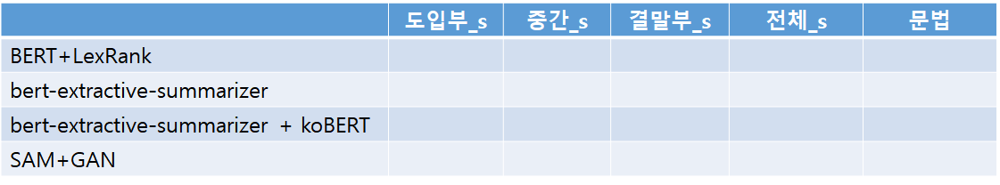

## 비교 대상 요약 알고리즘 준비

In [20]:
def similarity(query_text, org_text):
    sentences = nltk.sent_tokenize(org_text)
    print("Num sentences:", len(sentences))
    querys = nltk.sent_tokenize(query_text)
    print("Num querys:", len(querys))

    #Compute the sentence embeddings
    org_embeddings = s_discriminator._embedder.encode(sentences,show_progress_bar=False)
    query_embeddings = s_discriminator._embedder.encode(querys,show_progress_bar=False)

    #Compute the pair-wise cosine similarities
    cos_scores = scipy.spatial.distance.cdist(query_embeddings, org_embeddings, "cosine")
    similarity_score = 1.0 - np.mean(np.min(cos_scores,axis=0))

    return similarity_score

def grammarity(text):
    
    input_ids = []
    attention_masks = []

    sentences = np.asarray(nltk.sent_tokenize(text))
    # For every sentence...
    for sent in sentences:
        # `encode_plus` will:
        #   (1) Tokenize the sentence.
        #   (2) Prepend the `[CLS]` token to the start.
        #   (3) Append the `[SEP]` token to the end.
        #   (4) Map tokens to their IDs.
        #   (5) Pad or truncate the sentence to `max_length`
        #   (6) Create attention masks for [PAD] tokens.
        encoded_dict = g_discriminator.tokenizer.encode_plus(
                            sent,                      # Sentence to encode.
                            add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                            max_length = 64,           # Pad & truncate all sentences.
                            pad_to_max_length = True,
                            return_attention_mask = True,   # Construct attn. masks.
                            return_tensors = 'pt',     # Return pytorch tensors.
                            truncation = True,
                       )
        # Add the encoded sentence to the list.    
        input_ids.append(encoded_dict['input_ids'])

        # And its attention mask (simply differentiates padding from non-padding).
        attention_masks.append(encoded_dict['attention_mask'])

    # Convert the lists into tensors.
    input_ids = torch.cat(input_ids, dim=0).to(device)
    attention_masks = torch.cat(attention_masks, dim=0).to(device)
    g_discriminator.discriminator.to(device)
    #if str(discriminator1.device) == 'cpu':
    #    pass
    #else:
    #    input_ids = input_ids.to(device)
    #    attention_masks = attention_masks.to(device)        

    with torch.no_grad():        
        outputs = g_discriminator.discriminator(input_ids, 
                               token_type_ids=None, 
                               attention_mask=attention_masks)
    #return torch.sigmoid(outputs[0][:,1])
    return torch.mean(outputs[0][:,1]).detach().cpu().numpy()
    #return outputs

In [160]:
import pandas as pd
import numpy as np

def evaluate(method_name, text, org_text_1,org_text_2,org_text_3):
    result = {}
    result['method'] = [method_name]
    org_text = org_text_1 + ' ' + org_text_2 + ' ' + org_text_3
    result['comp ratio'] = len(text)/len(org_text)
    result['intro'] = [similarity(text,org_text_1)]
    result['body'] = [similarity(text,org_text_2)]
    result['ending'] = [similarity(text,org_text_3)]
    result['var'] = np.var([result['intro'][0],result['body'][0],result['ending'][0]])
    result['total'] = [similarity(text,org_text)]
    result['grammar'] = [np.tanh(float(grammarity(text)))]
    return pd.DataFrame(result),result

In [22]:
"""
LexRank implementation
Source: https://github.com/crabcamp/lexrank/tree/dev
"""

import numpy as np
from scipy.sparse.csgraph import connected_components

def degree_centrality_scores(
    similarity_matrix,
    threshold=None,
    increase_power=True,
):
    if not (
        threshold is None
        or isinstance(threshold, float)
        and 0 <= threshold < 1
    ):
        raise ValueError(
            '\'threshold\' should be a floating-point number '
            'from the interval [0, 1) or None',
        )

    if threshold is None:
        markov_matrix = create_markov_matrix(similarity_matrix)

    else:
        markov_matrix = create_markov_matrix_discrete(
            similarity_matrix,
            threshold,
        )

    scores = stationary_distribution(
        markov_matrix,
        increase_power=increase_power,
        normalized=False,
    )

    return scores


def _power_method(transition_matrix, increase_power=True):
    eigenvector = np.ones(len(transition_matrix))

    if len(eigenvector) == 1:
        return eigenvector

    transition = transition_matrix.transpose()

    while True:
        eigenvector_next = np.dot(transition, eigenvector)

        if np.allclose(eigenvector_next, eigenvector):
            return eigenvector_next

        eigenvector = eigenvector_next

        if increase_power:
            transition = np.dot(transition, transition)


def connected_nodes(matrix):
    _, labels = connected_components(matrix)

    groups = []

    for tag in np.unique(labels):
        group = np.where(labels == tag)[0]
        groups.append(group)

    return groups


def create_markov_matrix(weights_matrix):
    n_1, n_2 = weights_matrix.shape
    if n_1 != n_2:
        raise ValueError('\'weights_matrix\' should be square')

    row_sum = weights_matrix.sum(axis=1, keepdims=True)

    return weights_matrix / row_sum


def create_markov_matrix_discrete(weights_matrix, threshold):
    discrete_weights_matrix = np.zeros(weights_matrix.shape)
    ixs = np.where(weights_matrix >= threshold)
    discrete_weights_matrix[ixs] = 1

    return create_markov_matrix(discrete_weights_matrix)


def graph_nodes_clusters(transition_matrix, increase_power=True):
    clusters = connected_nodes(transition_matrix)
    clusters.sort(key=len, reverse=True)

    centroid_scores = []

    for group in clusters:
        t_matrix = transition_matrix[np.ix_(group, group)]
        eigenvector = _power_method(t_matrix, increase_power=increase_power)
        centroid_scores.append(eigenvector / len(group))

    return clusters, centroid_scores


def stationary_distribution(
    transition_matrix,
    increase_power=True,
    normalized=True,
):
    n_1, n_2 = transition_matrix.shape
    if n_1 != n_2:
        raise ValueError('\'transition_matrix\' should be square')

    distribution = np.zeros(n_1)

    grouped_indices = connected_nodes(transition_matrix)

    for group in grouped_indices:
        t_matrix = transition_matrix[np.ix_(group, group)]
        eigenvector = _power_method(t_matrix, increase_power=increase_power)
        distribution[group] = eigenvector

    if normalized:
        distribution /= n_1

    return distribution


* Hands-on Guide To Extractive Text Summarization With BERTSum<br>
https://analyticsindiamag.com/hands-on-guide-to-extractive-text-summarization-with-bertsum/ <br>
https://pypi.org/project/bert-extractive-summarizer/

In [23]:
!pip install bert-extractive-summarizer

In [24]:
from transformers import *

SQUAD_MODEL = "monologg/kobert"

# Load model, model config and tokenizer via Transformers
custom_config = AutoConfig.from_pretrained(SQUAD_MODEL)
custom_config.output_hidden_states=True
custom_tokenizer = AutoTokenizer.from_pretrained(SQUAD_MODEL)
custom_model = AutoModel.from_pretrained(SQUAD_MODEL, config=custom_config)

In [186]:
def sam_wgan(org_text):
    source = Source(org_text[0] + org_text[1] + org_text[2])
    source.analysis_frame_terms(s_discriminator,comp_rate=0.08,except_key=True)
    summarizer = SAM_Summarizer(g_discriminator,s_discriminator)
    summarizer.ready(source)
    summarizer.summarize(epochs=500,batch_size=1,frame_expansion_ratio = 1.0,init_bias=0.8,learning_rate=5e-5)
    summary_text = summarizer.get_summary(3)[0]
    print('-'*50)
    print('summary:')
    print(summary_text)
    print('-'*50)
    df,arr = evaluate('SAM+WGAN',summary_text,org_text[0],org_text[1],org_text[2])
    return df,arr

In [181]:
def bert_lexrank_sum(org_text,n_top=8):
    input_text = org_text[0] + org_text[1] + org_text[2]
    #Split the document into sentences
    sentences = nltk.sent_tokenize(input_text)
    print("Num sentences:", len(sentences))

    #Compute the sentence embeddings
    embeddings = s_discriminator._embedder.encode(sentences,show_progress_bar=False)

    #Compute the pair-wise cosine similarities
    cos_scores = scipy.spatial.distance.cdist(embeddings, embeddings, "cosine")
    #util.pytorch_cos_sim(embeddings, embeddings).numpy()
    print(cos_scores)
    #Compute the centrality for each sentence
    centrality_scores = degree_centrality_scores(cos_scores, threshold=None)

    #We argsort so that the first element is the sentence with the highest score
    most_central_sentence_indices = np.argsort(-centrality_scores)

    #Print the 5 sentences with the highest scores
    summary_text = ""
    for idx in most_central_sentence_indices[0:n_top]:
        summary_text += sentences[idx].strip()

    df,arr = evaluate('BERT+LexRank',summary_text,org_text[0],org_text[1],org_text[2])
    return df,arr


In [176]:
from summarizer import Summarizer

def besm(org_text):
    model1 = Summarizer()
    result = model1(org_text[0] + org_text[1] + org_text[2], num_sentences=5)
    summary_text = "".join(result)
    df,arr = evaluate('BESM',summary_text,org_text[0],org_text[1],org_text[2])
    return df,arr

In [177]:
def besm_bert(org_text):
    model2 = Summarizer(custom_model=custom_model, custom_tokenizer=custom_tokenizer)
    result = model2(org_text[0] + org_text[1] + org_text[2], num_sentences=5)
    summary_text = "".join(result)
    df,arr = evaluate('BESM+kobert',summary_text,org_text[0],org_text[1],org_text[2])
    return df,arr

## 신데렐라 Story 실험

In [178]:
org_text_1 = """
옛날 어느 집에 귀여운 여자 아기가 태어났어요.
아기는 무럭무럭 자라서, 예쁘고 마음씨 고운 소녀가 되었어요.
그러던 어느날, 소녀의 어머니가 병이들어 그만 세상을 떠나고 말았어요.
소녀의 아버지는 홀로 남은 소녀가 걱정되었어요.
그래서 얼마 후 새어머니를 맞이했어요.
새어머니는 소녀보다 나이가 위인 두 딸을 데리고 왔어요.
그러나 새어머니와 언니들은 성질이 고약한 심술쟁이들이었어요.
새어머니는 소녀가 자기 딸들보다 예쁘고 착한 게 못마땅했어요.
그런데 이번에는 아버지마저 돌아가셨어요.
소녀는 하녀처럼 하루 종일 쓸고, 닦고, 집안일을 도맡아 했어요.
해도 해도 끝이 없는 집안일이 힘들어 지칠때면
난롯가에 앉아서 잠시 쉬곤 했지요.
"""

org_text_2 = """
어느 날, 왕궁에서 무도회가 열렸어요.
신데렐라의 집에도 초대장이 왔어요.
새어머니는 언니들을 데리고 무도회장으로 떠났어요.
신데렐라도 무도회에 가고 싶었어요.
혼자 남은 신데렐라는 훌쩍훌쩍 울기 시작했어요.
신데렐라, 너도 무도회에 가고 싶니?
신데렐라가 고개를 들어보니, 마법사 할머니가 빙그레 웃고 있었어요.
내가 너를 무도회에 보내주마 호박 한개와 생쥐 두마리, 도마뱀을 구해 오렴.
마법사 할머니가 주문을 외웠어요.
그리고 지팡이로 호박을 건드리자, 호박이 화려한 황금 마차로 변했어요.
이번에는 생쥐와 도마뱀을 건드렸어요.
그랬더니 생쥐는 흰말로, 도마뱀은 멋진 마부로 변했답니다.
신데렐라의 옷도 구슬 장식이 반짝이는 예쁜 드레스로 바뀌웠어요.
신데렐라, 발을 내밀어 보거라.
할머니는 신데렐라에게 반짝반짝 빛나는 유리 구두를 신겨 주었어요.
신데렐라, 밤 열두시가 되면 모든게 처음대로 돌아간단다. 황금 마차는 호박으로, 흰말은 생쥐로, 마부는 도마뱀으로 변하게 돼. 그러니까 반드시 밤 열두 시가 되기 전에 돌아와야 해. 알겠지?
왕자님도 아름다운 신데렐라에게 마음을 빼았겼어요.
왕자님은 무도회장에 모인 다른 아가씨들은 쳐다보지도 않고,신데렐라하고만 춤을 추었어요.
신데렐라는 왕자님과 춤을 추느라 시간 가는 줄도 몰랐어요.
땡, 땡, 땡...... 벽시계가 열두 시를 알리는 소리에 신데렐라는 화들짝 놀랐어요.
신데렐라가 허둥지둥 왕궁을 빠져나가는데,
유리 구두 한 짝이 벗겨졌어요.
하지만 구두를 주울 틈이 없었어요.
신데렐라를 뛰쫓아오던 왕자님은 층계에서 유리 구두 한 짝을 주웠어요.
왕자님은 유리 구두를 가지고 임금님께 가서 말했어요.
이 유리 구두의 주인과 결혼하겠어요.
"""

org_text_3 = """
그래서 신하들은 유리 구두의 주인을 찾아 온 나라를 돌아다녔어요.
언니들은 발을 오므려도 보고, 구두를 늘려도 보았지만 한눈에 보기에도 유리 구두는 너무 작았어요.
그때, 신데렐라가 조용히 다가와 말했어요.
저도 한번 신어 볼 수 있나요?
신데렐라는 신하게 건넨 유리 구두를 신었어요,
유리 구두는 신데렐라의 발에 꼭 맞았어요.
신하들은 신데렐라를 왕궁으로 데리고 갔어요.
그 뒤 신데렐라는 왕자님과 결혼하여 오래오래 행복하게 살았대요.
"""

------------------------------------------------------------------
옛날 어느 집에 귀여운 여자 아기가 태어났어요. 아기는 무럭무럭 자라서, 예쁘고 마음씨 고운 소녀가 되었어요. 그러던 어느날, 소녀의 어머니가 병이들어 그만 세상을 떠나고 말았어요. 소녀의 아버지는 홀로 남은 소녀가 걱정되었어요. 그래서 얼마 후 새어머니를 맞이했어요. 새어머니는 소녀보다 나이가 위인 두 딸을 데리고 왔어요. 그러나 새어머니와 언니들은 성질이 고약한 심술쟁이들이었어요. 새어머니는 소녀가 자기 딸들보다 예쁘고 착한 게 못마땅했어요. 그런데 이번에는 아버지마저 돌아가셨어요. 소녀는 하녀처럼 하루 종일 쓸고, 닦고, 집안일을 도맡아 했어요. 해도 해도 끝이 없는 집안일이 힘들어 지칠때면 난롯가에 앉아서 잠시 쉬곤 했지요. 어느 날, 왕궁에서 무도회가 열렸어요. 신데렐라의 집에도 초대장이 왔어요. 새어머니는 언니들을 데리고 무도회장으로 떠났어요. 신데렐라도 무도회에 가고 싶었어요. 혼자 남은 신데렐라는 훌쩍훌쩍 울기 시작했어요. 신데렐라, 너도 무도회에 가고 싶니? 신데렐라가 고개를 들어보니, 마법사 할머니가 빙그레 웃고 있었어요. 내가 너를 무도회에 보내주마 호박 한개와 생쥐 두마리, 도마뱀을 구해 오렴. 마법사 할머니가 주문을 외웠어요. 그리고 지팡이로 호박을 건드리자, 호박이 화려한 황금 마차로 변했어요. 이번에는 생쥐와 도마뱀을 건드렸어요. 그랬더니 생쥐는 흰말로, 도마뱀은 멋진 마부로 변했답니다. 신데렐라의 옷도 구슬 장식이 반짝이는 예쁜 드레스로 바뀌웠어요. 신데렐라, 발을 내밀어 보거라. 할머니는 신데렐라에게 반짝반짝 빛나는 유리 구두를 신겨 주었어요. 신데렐라, 밤 열두시가 되면 모든게 처음대로 돌아간단다. 황금 마차는 호박으로, 흰말은 생쥐로, 마부는 도마뱀으로 변하게 돼. 그러니까 반드시 밤 열두 시가 되기 전에 돌아와야 해. 알겠지? 왕자님도 아름다운 신데렐라에게 마음을 빼았겼어요. 왕자님은 무도회장에 모인 다른 

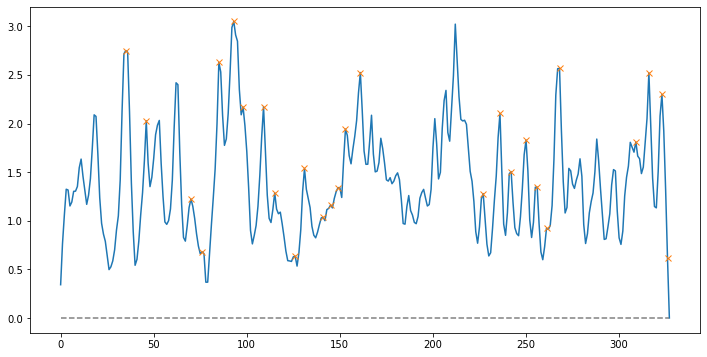

Peak count: 27
Frame text: 맞이했어요. 언니들은 했어요. 힘들어 왕궁에서 언니들을 무도회에 무도회에 마법사 생쥐 마법사 황금 생쥐와 생쥐는 마부로 드레스로 열두 왕궁을 벗겨졌어요. 왕자님은 주웠어요. 임금님께 결혼하겠어요. 구두는 왕궁으로 결혼하여 살았대요. 

Similarity : 0.47652731639401313
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.228739932179451   similarity loss:-0.07695427536964417


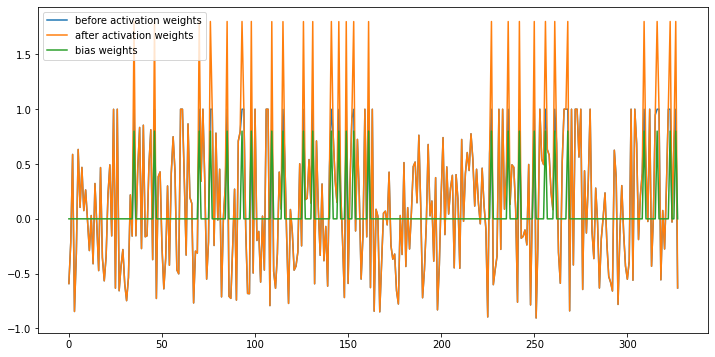

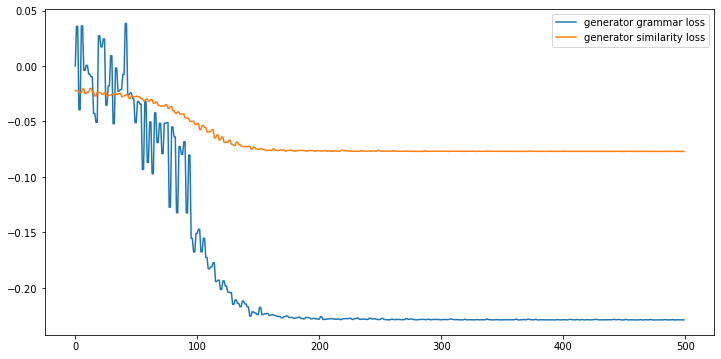

--------------------------------------------------
summary:
말았어요. 아버지는 맞이했어요. 언니들은 아버지마저 돌아가셨어요. 했어요. 해도 힘들어 지칠때면 왕궁에서 언니들을 데리고 무도회에 싶었어요. 시작했어요. 신데렐라, 무도회에 마법사 생쥐 마법사 황금 생쥐와 생쥐는 마부로 반짝이는 드레스로 신데렐라, 열두 신데렐라는 놀랐어요. 왕궁을 벗겨졌어요. 왕자님은 구두 주웠어요. 임금님께 구두의 주인과 결혼하겠어요. 신하들은 구두의 주인을 온 오므려도 신데렐라는 건넨 구두는 꼭 왕궁으로 데리고 왕자님과 결혼하여 살았대요.
--------------------------------------------------
Num sentences: 11
Num querys: 11
Num sentences: 28
Num querys: 11
Num sentences: 7
Num querys: 11
Num sentences: 46
Num querys: 11
Num sentences: 46
[[0.         0.38204615 0.49504121 ... 0.68205056 0.61611683 0.62742191]
 [0.38204615 0.         0.73639959 ... 0.62604466 0.73538013 0.62594273]
 [0.49504121 0.73639959 0.         ... 0.82806575 0.81571041 0.86315465]
 ...
 [0.68205056 0.62604466 0.82806575 ... 0.         0.4442605  0.49476858]
 [0.61611683 0.73538013 0.81571041 ... 0.4442605  0.         0.29959817]
 [0.62742191 0.62594273 0.86315465 ... 0.49476858 0.29959817 0.        ]]
Num sentences: 11
Num querys: 1
Num 

,method,comp ratio,intro,body,ending,var,total,grammar
0,SAM+WGAN,0.178867,0.478083,0.570875,0.610619,0.003084,0.554734,0.998135
1,BERT+LexRank,0.150552,0.225772,0.244255,0.181226,0.000700,0.230244,0.999879
2,BESM,0.162983,0.411179,0.611856,0.599732,0.008441,0.562023,0.999894
3,BESM+kobert,0.162983,0.411179,0.611856,0.599732,0.008441,0.562023,0.999894


In [187]:
df1,_ = sam_wgan([org_text_1,org_text_2,org_text_3])
df2,_ = bert_lexrank_sum([org_text_1,org_text_2,org_text_3])
df3,_ = besm([org_text_1,org_text_2,org_text_3])
df4,_ = besm_bert([org_text_1,org_text_2,org_text_3])
result = pd.concat([df1, df2, df3, df4 ], ignore_index=True)
result


Test용 Data 준비

In [188]:
urls

['https://raw.githubusercontent.com/dolmani38/Summary/master/data/korean_sample.txt',
 'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-ABC%20%EC%82%B4%EC%9D%B8%EC%82%AC%EA%B1%B4.txt',
 'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EA%B7%B8%EB%A6%AC%EA%B3%A0%20%EC%95%84%EB%AC%B4%EB%8F%84%20%EC%97%86%EC%97%88%EB%8B%A4.txt',
 'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%82%98%EC%9D%BC%EA%B0%95%EC%9D%98%20%EC%A3%BD%EC%9D%8C.txt',
 'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%A7%8C%EC%B0%AC%ED%9A%8C%EC%9D%98%2013%EC%9D%B8.txt',
 'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-

In [189]:
ko_sentences_dataset = []
for url in urls:
    raw_text = urllib.request.urlopen(url).read().decode('utf-8')
    ko_sentences_dataset += nltk.sent_tokenize(clean_text(raw_text))


In [ ]:
len(ko_sentences_dataset)

In [200]:
document = []
offset = 0
while (offset < len(ko_sentences_dataset)):
    intro_cnt = random.choice([5,8,10,13])
    body_cnt = random.choice([10,15,18,20,25])
    conclu_cnt = random.choice([5,8,10,13])
    intro = ' '.join(ko_sentences_dataset[offset:offset+intro_cnt])
    body = ' '.join(ko_sentences_dataset[offset+intro_cnt:offset+intro_cnt+body_cnt])
    conclu = ' '.join(ko_sentences_dataset[offset+intro_cnt+body_cnt:offset+intro_cnt+body_cnt+conclu_cnt])
    offset = offset+intro_cnt+body_cnt+conclu_cnt
    document.append([intro,body,conclu])

print(len(document))

document[0]

3905


['제길 아젝스는 쓰게 술잔을 기울였다. 열흘 후 앞으로 다가온 약혼식을 생각하면속이쓰리고 가슴이 답답해져 온다. 빌어먹을 이제 겨우 18세인 자신이 벌써 약혼을 하고 일 년 후 결혼을 해야 하다니어이가없다. 성인식을 치룬지 이제 몇 달이나 됐다고 벌써 결혼이란 말인가. 이제수많은 미인들과의 열애는 그만두고 이름도 거룩한 대 포러스 제국의제1공주인아레나, 아레나 에이, 이름도 모르겠다. 그냥 못생긴, 아주못생긴 것하고정략결혼이란 것을 해야한다. 게다가 평생 그년의 눈치를 보면서살아야 할 판이니바람도 제대로 피우지 못할 것이다. 내 청춘은 이제 여기서 끝난것이다. 으악, 미치겠다. 아젝스는 기어이 비명을 질렀다.',
 '그러자 앞에서 같이 술을 들고 있던자신의호위기사인 한스 멕그리거가 다 이해한다는 표정으로 빈 잔에 술을 따랐다. 아젝스 도련님, 그만 돌아가시지요. 많이 취하셨습니다. 빌어먹을 앙리 베델이란 놈이다. 이놈은 한스와는 달리 아주 아주 잔소리쟁이다. 그것도 내가 듣기 싫어하는 말만 골라서 하는. 그래. 앙리는 내가 밉지, 엉? 아닙니다, 아젝스 도련님. 다만, 시간도 늦었고 술도 많이 드셨으니그만돌아가야 하지 않겠습니까?',
 '그래, 너는 네놈 일 아니라고 그런 편한 소리하지. 너도 내 처지 되봐라. 술이라도 먹어야 잠을 자지. 게다가 가긴 어딜가. 당연히 외박이지. 앞으로얼마남지도 않은 청춘 뜨겁게 불태워야 하지 않겠어? 한스, 가자. 너 좋은데 알고 있지? 어제간데 말고 다른 곳에 가자고. 어제는별로였어. 예, 도련님 안됩니다. 오늘 아침에도 그렇게 혼나시고도 또 가십니까? 그러다 정말큰일납니다.']

------------------------------------------------------------------
제길 아젝스는 쓰게 술잔을 기울였다. 열흘 후 앞으로 다가온 약혼식을 생각하면속이쓰리고 가슴이 답답해져 온다. 빌어먹을 이제 겨우 18세인 자신이 벌써 약혼을 하고 일 년 후 결혼을 해야 하다니어이가없다. 성인식을 치룬지 이제 몇 달이나 됐다고 벌써 결혼이란 말인가. 이제수많은 미인들과의 열애는 그만두고 이름도 거룩한 대 포러스 제국의제1공주인아레나, 아레나 에이, 이름도 모르겠다. 그냥 못생긴, 아주못생긴 것하고정략결혼이란 것을 해야한다. 게다가 평생 그년의 눈치를 보면서살아야 할 판이니바람도 제대로 피우지 못할 것이다. 내 청춘은 이제 여기서 끝난것이다. 으악, 미치겠다. 아젝스는 기어이 비명을 질렀다. 그러자 앞에서 같이 술을 들고 있던자신의호위기사인 한스 멕그리거가 다 이해한다는 표정으로 빈 잔에 술을 따랐다. 아젝스 도련님, 그만 돌아가시지요. 많이 취하셨습니다. 빌어먹을 앙리 베델이란 놈이다. 이놈은 한스와는 달리 아주 아주 잔소리쟁이다. 그것도 내가 듣기 싫어하는 말만 골라서 하는. 그래. 앙리는 내가 밉지, 엉? 아닙니다, 아젝스 도련님. 다만, 시간도 늦었고 술도 많이 드셨으니그만돌아가야 하지 않겠습니까?그래, 너는 네놈 일 아니라고 그런 편한 소리하지. 너도 내 처지 되봐라. 술이라도 먹어야 잠을 자지. 게다가 가긴 어딜가. 당연히 외박이지. 앞으로얼마남지도 않은 청춘 뜨겁게 불태워야 하지 않겠어? 한스, 가자. 너 좋은데 알고 있지? 어제간데 말고 다른 곳에 가자고. 어제는별로였어. 예, 도련님 안됩니다. 오늘 아침에도 그렇게 혼나시고도 또 가십니까? 그러다 정말큰일납니다.
------------------------------------------------------------------
Token table of origin text
---------------------------------------------
 

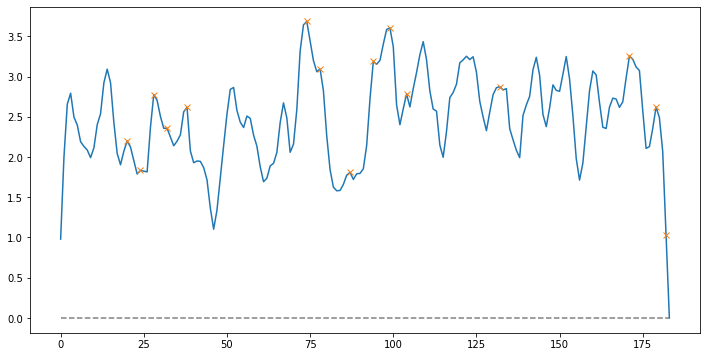

Peak count: 15
Frame text: 벌써 년 하다니어이가없다. 몇 이제수많은 미치겠다. 질렀다. 다 아젝스 취하셨습니다. 이놈은 않겠습니까?그래, 어제는별로였어. 또 정말큰일납니다. 

Similarity : 0.4924352913148262
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.22643157839775085   similarity loss:-0.06398530304431915


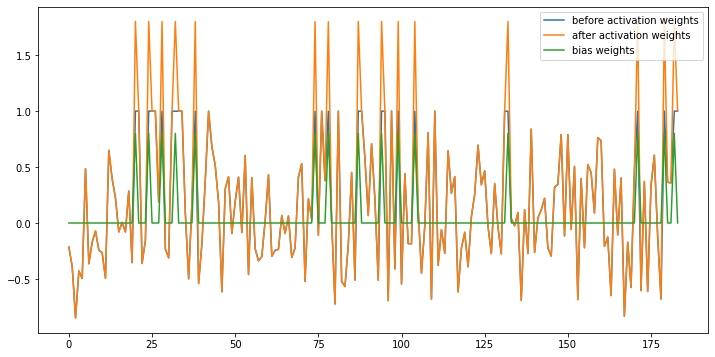

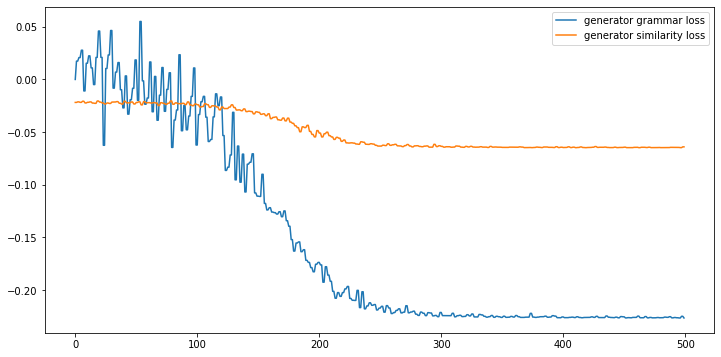

--------------------------------------------------
summary:
벌써 약혼을 년 후 결혼을 하다니어이가없다. 이제 몇 달이나 됐다고 이제수많은 이름도 미치겠다. 기어이 질렀다. 같이 다 이해한다는 아젝스 도련님, 돌아가시지요. 취하셨습니다. 이놈은 그것도 하지 않겠습니까?그래, 어제는별로였어. 또 정말큰일납니다. 
--------------------------------------------------
Num sentences: 10
Num querys: 7
Num sentences: 10
Num querys: 7
Num sentences: 13
Num querys: 7
Num sentences: 33
Num querys: 7
Num sentences: 31
[[0.00000000e+00 7.61355730e-01 7.50743906e-01 8.15047516e-01
  7.45362343e-01 5.52348552e-01 8.19129901e-01 8.38030443e-01
  7.01076729e-01 3.54227165e-01 6.73914300e-01 3.26720603e-01
  6.72573052e-01 6.80374010e-01 7.64460365e-01 9.23813036e-01
  6.00549273e-01 6.37639702e-01 5.17276357e-01 8.87258432e-01
  4.69631420e-01 8.48943678e-01 8.09463519e-01 8.94366617e-01
  7.65843267e-01 8.79421859e-01 8.76654722e-01 8.89584732e-01
  7.20462390e-01 7.25998521e-01 7.34236053e-01]
 [7.61355730e-01 0.00000000e+00 4.45001965e-01 4.36263860e-01
  7.44957617e-01 5.55516100e-01 5.93338171e-01 7.68854921e

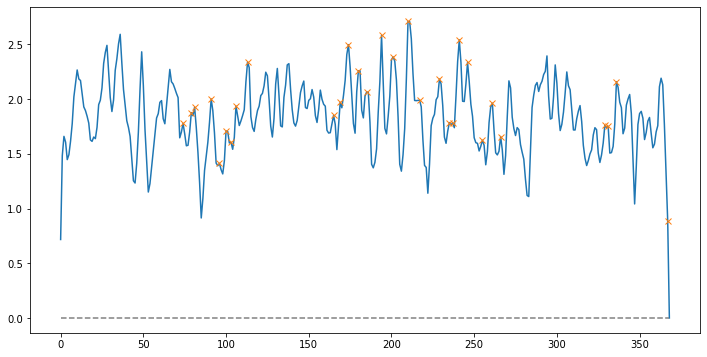

Peak count: 30
Frame text: 없이 마차는이일행중 화려했다. 보석으로 가장 아름다운 그러나 슬픈기색이역력해서 그녀는 의례적인신년행사에나 못한 비교가되지않는다. 되었다. 되기위해열심히 굳히고있지못하였다. 외척의 백작이라 현 자신의본가인휠테른 굳히고 이런 머나먼 고립될수밖에없다. 것이다. 마십시오. 될것입니다. 마법사중 실력이 물리쳤다. 그리신통하지못했다. 

Similarity : 0.5008691075945522
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20287951827049255   similarity loss:-0.05706069618463516


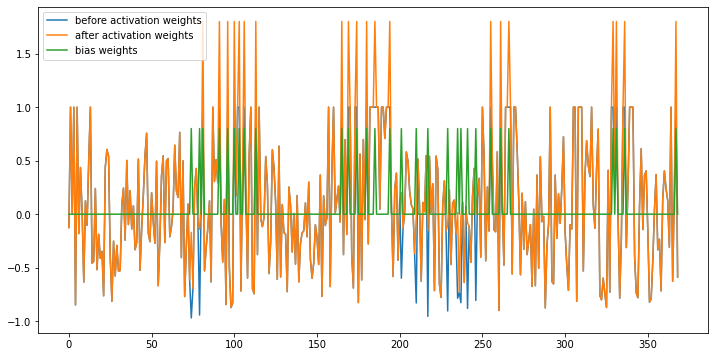

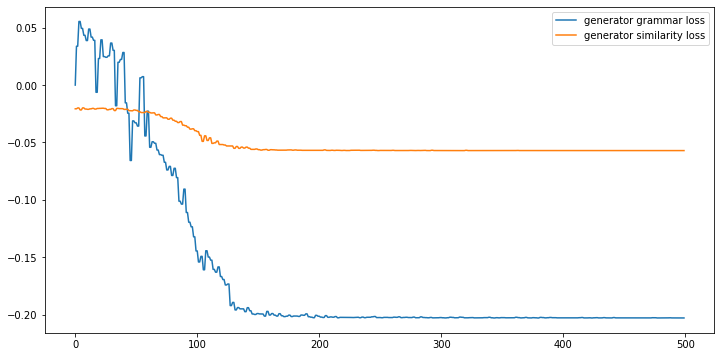

--------------------------------------------------
summary:
몰라,몰라. 일은 생각하자고. 말고 화려했다. 각 보석으로 가장 아름다운 얼굴이었다. 그러나 슬픈기색이역력해서 퇴색하게 그녀는 흐르는숲을보며 못하고, 변방에 의례적인신년행사에나 못한 공작이므로 귀족과 비교가되지않는다. 되었다. 신분으로 차기 국왕이 되기위해열심히 노력하는 그녀의 황궁에서 자신의 아직 확고히 굳히고있지못하였다. 황후의 것이다. 마십시오. 다 잘 될것입니다. 앞에 같이 동행하던 현 대륙에서 가장 왕국이자 한 때는전대륙을통일했던-물론 대륙의 마탑의 마법사중 실력이 나사스를 물리쳤다. 마탑에 눌러 앉아 궁중에서의 그리신통하지못했다.
--------------------------------------------------
Num sentences: 5
Num querys: 12
Num sentences: 25
Num querys: 12
Num sentences: 13
Num querys: 12
Num sentences: 43
Num querys: 12
Num sentences: 41
[[0.00000000e+00 8.32011552e-01 7.88051356e-01 ... 1.03721880e+00
  1.00971183e+00 8.46961972e-01]
 [8.32011552e-01 2.22044605e-16 6.99683502e-01 ... 7.30593231e-01
  8.11612577e-01 9.32123774e-01]
 [7.88051356e-01 6.99683502e-01 1.11022302e-16 ... 1.03584167e+00
  8.61542002e-01 9.52450375e-01]
 ...
 [1.03721880e+00 7.30593231e-01 1.03584167e+00 ... 0.00000000e+00
  4.38681399e-01 5.14248156e-01]
 [1.00971183e+00 8.11612577e-01 8

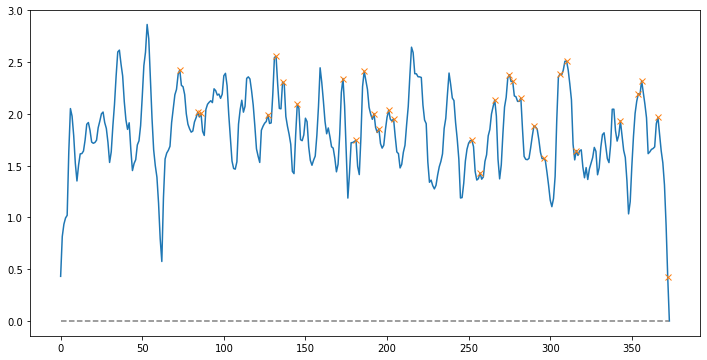

Peak count: 30
Frame text: 매력이있는 자신의 채워줄 세력이불어났다. 의지를 모을것인가부터에서사람을 그리고어느정도 그러기에 공작의자제에게 자제가 여자만 망나니라니 걱정이 궁중마법사자리를 있는 나사스는 영지는 가장 영지이나, 큰 나오는 얼씬도 틸라크 일삼고 자리를 영지의수십년에걸친 영지의 대단했지요. 없으니 그렇군요. 

Similarity : 0.4987418129282033
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.17380474507808685   similarity loss:-0.0472855307161808


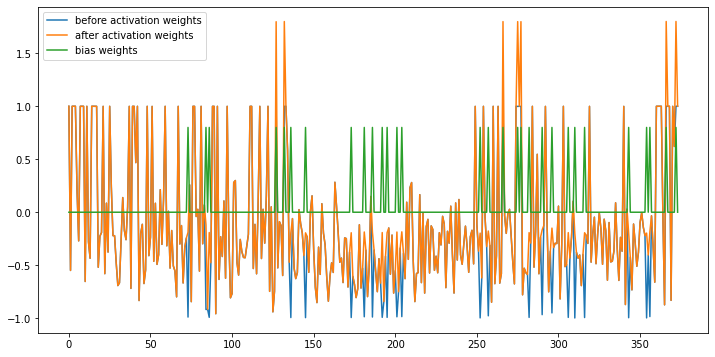

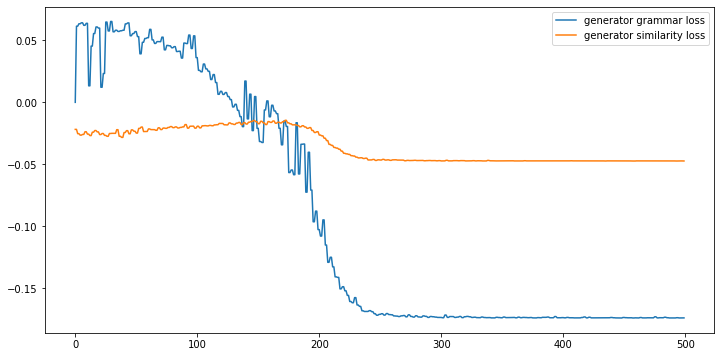

--------------------------------------------------
summary:
 타국인이라는 점은 둘째로 겨우 명맥만유지하고 있는아라사 것이 결정적인 이유가 되었다. 그만큼 그만큼 이런 공주가 접근한 것이 안위를 것은 너무도 보였다. 아니었다. 어차피 포러스 이유도아무런 없었기 때문이었다. 약한세력에 떡고물도 좋았다. 그리고 사람도여럿 하나 세력이불어났다. 의지를 하였다. 해요. 곳은 정리하더니 후우, 영지는 제국에서 가장 큰 영지이나, 아닙니다. 몬스터들 부족들이 항상 많았지만 포러스국과의연계가끊기게 되고 틸라크 영지는 없으니 살기 위해 것입니다. 그렇군요. 
--------------------------------------------------
Num sentences: 13
Num querys: 11
Num sentences: 15
Num querys: 11
Num sentences: 8
Num querys: 11
Num sentences: 36
Num querys: 11
Num sentences: 34
[[0.00000000e+00 8.01250487e-01 7.64009601e-01 ... 8.56623116e-01
  5.35311443e-01 1.12858404e+00]
 [8.01250487e-01 2.22044605e-16 6.80534434e-01 ... 4.66681256e-01
  7.21434172e-01 7.74588853e-01]
 [7.64009601e-01 6.80534434e-01 2.22044605e-16 ... 6.26370150e-01
  8.26452330e-01 8.84434366e-01]
 ...
 [8.56623116e-01 4.66681256e-01 6.26370150e-01 ... 0.00000000e+00
  6.77067805e-01 4.99705244e-01]
 [5.35311443e-01 7.21434172e-01 8.26452330e-01 ... 6.77067805e-01

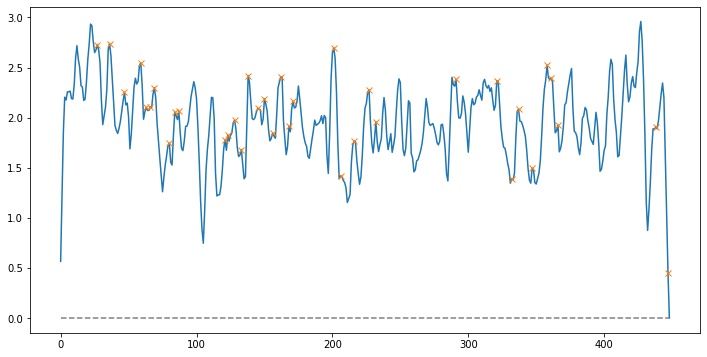

Peak count: 36
Frame text: 휴노이국의 휴노이국을 넘어 틸라크 있었기 공작은 아무런주인도 그지역에 처음엔 대항하던 계속전진하다 부족은 멸족을 하고는 북쪽은아무래도드래곤 휴노이 사막부족의 다소 있었는데 겁을 청하게 그러나 드베리아 중류지역까지 틸라크 영지가 큰기대를 사병을 함으로 그러나 수 부랴 대다수의 당시상황이반대 주로 없었다. 

Similarity : 0.43136781280155756
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1513848751783371   similarity loss:-0.053701985627412796


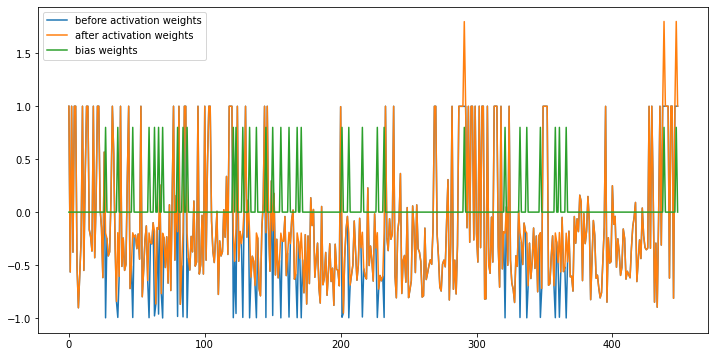

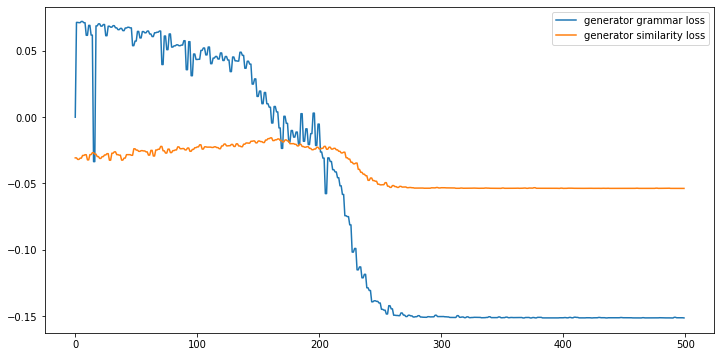

--------------------------------------------------
summary:
 이상하네요. 외진 땅이 들어보니 있기 전에는 그리고 제일의 영지라면서요. 다만당시서쪽의 때 이때 현 된 있던유목민의 적으로 간주하고 삼는 포러스 발견했다는 사실과앞으로더나가겠다는 기초공사를 하기 시작했습니다. 힘으로 끝 향하다가 국과만나게되었습니다. 영지입니다. 휴노이 그럼, 그러나 그리 때까지 때문에 틸라크 영주역시 그리 큰기대를 하지않고 그래서 키우고 있죠. 사병수로 거느린 틸라크 공작이 현 사병을 키우고 있었다. 더많은,그리고 있고, 법으로 정한 것이다. 물론 그래서 영지였다. 영지에는 있었다. 군대가 주로 휴노이군의침략을 막고 있는데, 강력한 군이라고는 수 없었다. 
--------------------------------------------------
Num sentences: 8
Num querys: 11
Num sentences: 18
Num querys: 11
Num sentences: 13
Num querys: 11
Num sentences: 39
Num querys: 11
Num sentences: 37
[[0.00000000e+00 7.06654109e-01 7.85211001e-01 ... 6.23635052e-01
  9.24300891e-01 8.46664066e-01]
 [7.06654109e-01 0.00000000e+00 5.53330301e-01 ... 4.23624820e-01
  6.79123383e-01 6.58981688e-01]
 [7.85211001e-01 5.53330301e-01 0.00000000e+00 ... 4.43013125e-01
  7.19124626e-01 4.90414174e-01]
 ...
 [6.23635052e-01 4.23624820e-01 4.43013125e-01 ... 0.00000000e+00
  7.17290513e-01 5.48238460e-01]
 [9.24300891e

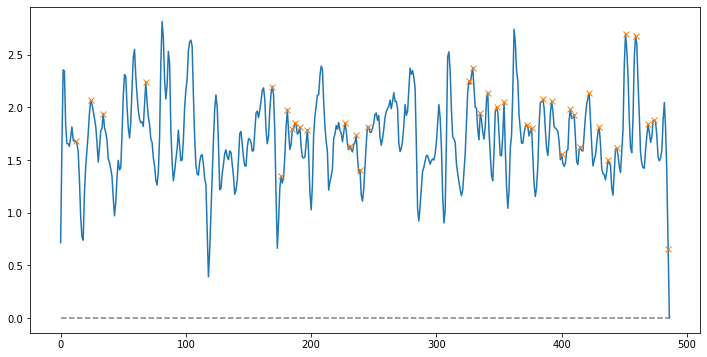

Peak count: 39
Frame text: 올 소문만 모르기 수없었다. 틸라크 내게 거리면서. 비교적잘해주니 많이 없이 먹히니까. 소드 무가입니다. 유시시가 능력을 모를 황실의 사사하셨기때문입니다. 나셨다면 전투에서 일원으로 전쟁에참여한대부분의 어쨌든, 슬퍼한 맺어주기로천명했습니다. 아들이태어나게되어 돌아가시고모든 황후파에서 공작가에 되었답니다. 못했지만 않을 사람이라도 텐데, 출신이라아쉽게되었습니다. 시집을 없었네요. 아무런 공작가에미안해지는군요. 

Similarity : 0.5241656436636648
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20449316501617432   similarity loss:-0.0649975836277008


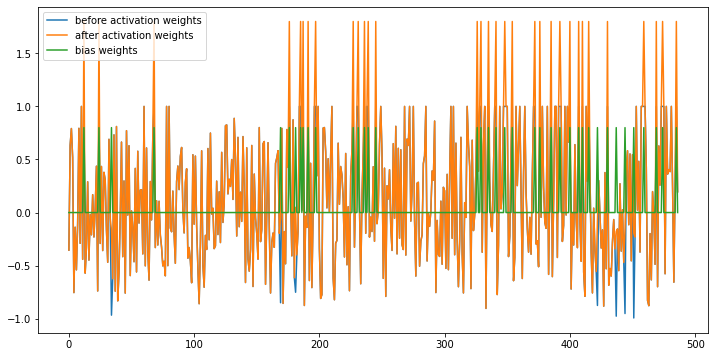

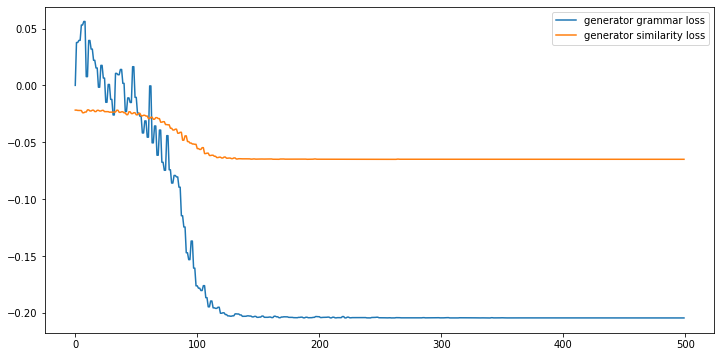

--------------------------------------------------
summary:
보다는성곽을방패삼아 올 소문만 대거 수없었다. 최대 고작이었다. 내게 역할을 비교적잘해주니 많이 없이 싸게 먹히니까. 정말 그런 소드 명문 무가입니다. 유시시가 그 능력을 모를 한오십년이되었군요. 제국이 왔지요. 포러스 남부연방국과 대공은 알고 처음 황실의 샤틀리에를 사사하셨기때문입니다. 전쟁에서 나셨다면 마지막 전투에서 바람에 황실의 일원으로 오해를 하게된 전쟁에참여한대부분의 알고 그분의 명색이 그런겁니다. 어쨌든, 슬퍼한 황제께선대공의장례식에서 틸라크 맺어주기로천명했습니다. 다행인지 황가의 모두 아들이태어나게되어 인연이 그렇게 흘러 돌아가시고모든 황후파에서 공작가에 한다고 되었답니다. 않을 비사가 사실도 모르고 시집을 가다니,정말한심하네요. 없었네요. 간다면서 아무런 사전 없이길을나섰다가 물어보니 공작가에미안해지는군요.
--------------------------------------------------
Num sentences: 13
Num querys: 13
Num sentences: 20
Num querys: 13
Num sentences: 13
Num querys: 13
Num sentences: 46
Num querys: 13
Num sentences: 44
[[0.00000000e+00 4.39977781e-01 6.16490797e-01 ... 1.02596420e+00
  5.90555539e-01 9.95757598e-01]
 [4.39977781e-01 2.22044605e-16 7.77032775e-01 ... 7.74617230e-01
  5.81122545e-01 8.09608977e-01]
 [6.16490797e-01 7.77032775e-01 1.11022302e-16 ... 8.06555660e-01
  7.59102693e-01 9.51035751e-01]
 ...
 [1.02596420e+00 7.74617230

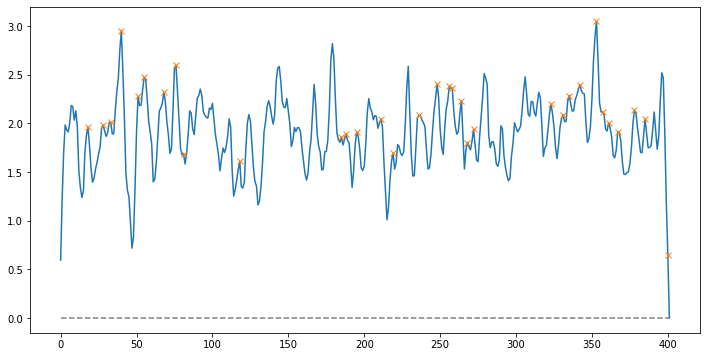

Peak count: 33
Frame text: 틸라크공작은아닙니다. 타리안 한분과돌프레앙 대단한가문입니다. 그리고현 마스터는 사실이라면 아니겠습니까?지금은 분명 전부터 어느정도황태자의도움을 생각에 오늘 성문을주시했다. 말을 체구에 충분했다. 거슬리기는 오히려그것이틸라크 했다. 아젝스 역시 위해서였다. 며칠에 비록 황제폐하의 공작이었다. 들어섰다. 함성을 나섰다. 마차에가까이서서 미소로다가오고오른편의 않았다. 

Similarity : 0.5104488126217125
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2006627470254898   similarity loss:-0.056293267756700516


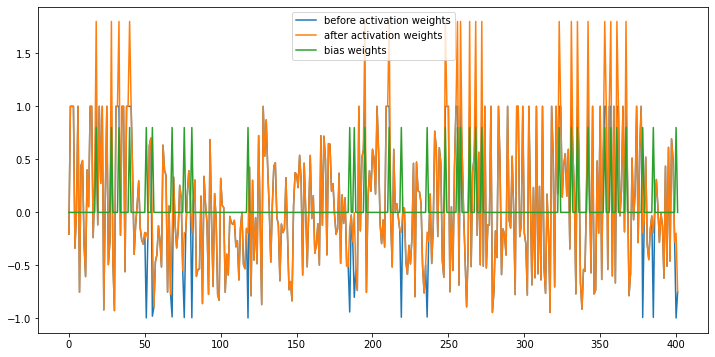

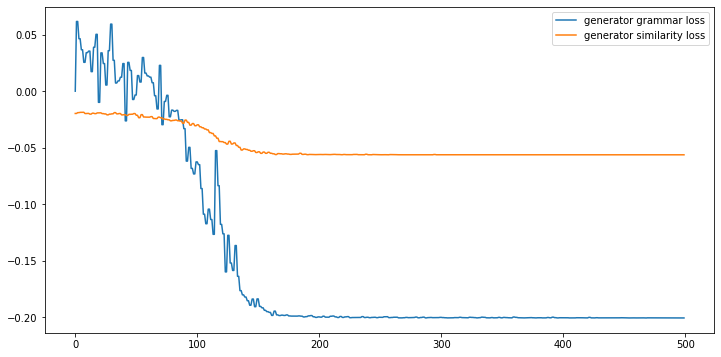

--------------------------------------------------
summary:
참, 그럼 현 소드 마스터는 총 틸라크공작은아닙니다. 제국의 당시 한명이었던라케다이몬님과그의 타리안 그리고 백년전에 한분과돌프레앙 네분이 전부입니다. 이것만 하더라도 대단한가문입니다. 현 이란다. 다시 오늘 어찌나 자리를 지키며 성문을주시했다. 충분했다. 다만,화려한 예복에 좀 거슬리기는 오히려그것이틸라크 했다. 아젝스 역시 허리에 담아 축 덜떨어져 기사단장인 지멘 지멘은대대로틸라크 가신으로 누구보다도신뢰하는부하요, 성문앞에 제국의제1황녀인아레나 맞이 위해서였다. 그녀를 며칠에 비록 황제폐하의 영지도 내심 공작이었다. 이윽고 성문을 들어섰다. 우레와 함성을 싣고틸라크공작이하 뒤따라 나섰다. 내려 보았다.
--------------------------------------------------
Num sentences: 8
Num querys: 12
Num sentences: 25
Num querys: 12
Num sentences: 10
Num querys: 12
Num sentences: 43
Num querys: 12
Num sentences: 41
[[0.00000000e+00 5.18594829e-01 4.28276952e-01 ... 9.41669928e-01
  8.99027093e-01 5.43290469e-01]
 [5.18594829e-01 1.11022302e-16 5.75870157e-01 ... 8.70343375e-01
  9.14839583e-01 7.96996719e-01]
 [4.28276952e-01 5.75870157e-01 1.11022302e-16 ... 9.71270369e-01
  8.81269694e-01 5.81306389e-01]
 ...
 [9.41669928e-01 8.70343375e-01 9.71270369e-01 ... 0.00000000e+00
  8.36734788e-01 8.93333683e-0

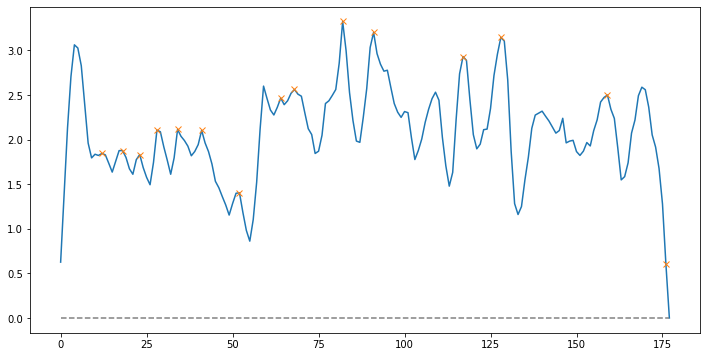

Peak count: 15
Frame text: 인사를 그라시스 환영을 성이 여느귀족처럼화려한 변방의 확실한아젝스라는 공작님, 싶군요. 공작이잠시주춤했다. 공주님. 섰다. 구겼다. 공작 하였다. 

Similarity : 0.4772266900916644
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20179419219493866   similarity loss:-0.05720731243491173


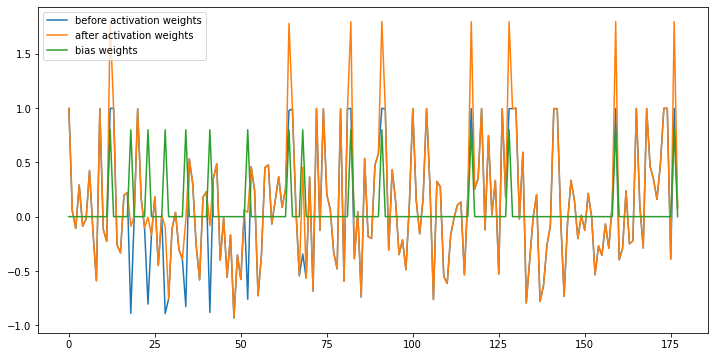

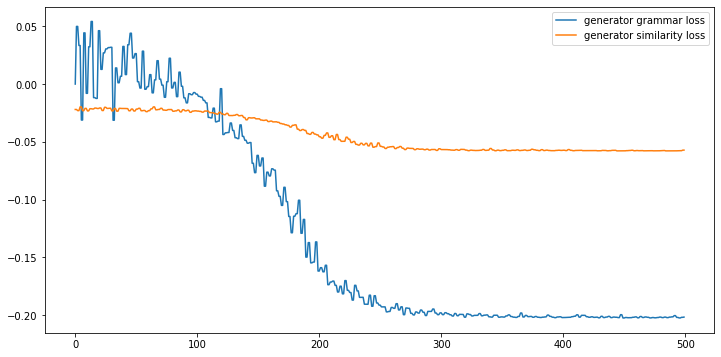

--------------------------------------------------
summary:
 일제히 인사를 하였다. 이하 공작님, 우선 피곤 차갑게 일어서려던 틸라크 공작이잠시주춤했다. 공주님. 우선 오십시오. 남기고 섰다. 그곁에 씁스레하니 구겼다. 첫만남이않좋았기 때문이다. 안좋은 행동이었다. 공작 보다 급히 최대한 괴롭힐까 하였다.
--------------------------------------------------
Num sentences: 8
Num querys: 9
Num sentences: 10
Num querys: 9
Num sentences: 8
Num querys: 9
Num sentences: 26
Num querys: 9
Num sentences: 24
[[2.22044605e-16 6.44712489e-01 7.66519473e-01 5.14480261e-01
  6.62567883e-01 8.52158937e-01 7.67235019e-01 7.85601530e-01
  6.82345071e-01 5.51457337e-01 7.13950945e-01 8.94645841e-01
  9.24899379e-01 6.40860661e-01 8.39062319e-01 3.41778850e-01
  7.26732332e-01 8.73244139e-01 7.91399856e-01 9.94423923e-01
  8.56077087e-01 4.33279459e-01 4.69809112e-01 9.38366238e-01]
 [6.44712489e-01 0.00000000e+00 5.02317377e-01 9.39476292e-01
  5.88782192e-01 7.17659801e-01 8.73598438e-01 8.60064005e-01
  5.88999727e-01 7.93786097e-01 4.95181541e-01 7.79417531e-01
  7.77518273e-01 8.22866254e-01 6.10784327e-01 

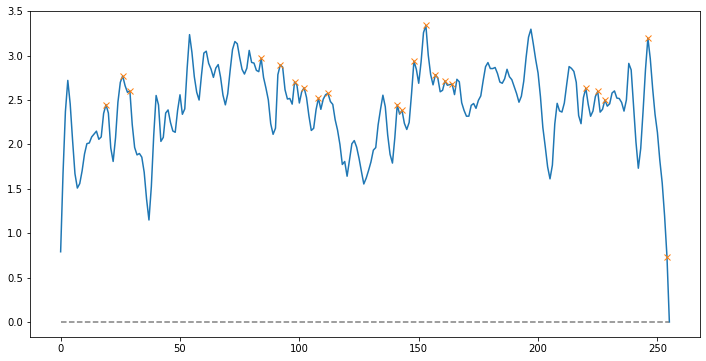

Peak count: 21
Frame text: 기사요, 아젝스 뭐? 도련님을 가져왔겠습니까? 정성이었지요. 있었지만 어디까지나도련님이 말씀을 야, 못할 도련님 저런 만약 했다면 바른 그 아젝스는 앙리를 아앙리~. 낙이지? 

Similarity : 0.5144378976700158
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1813298463821411   similarity loss:-0.05923960357904434


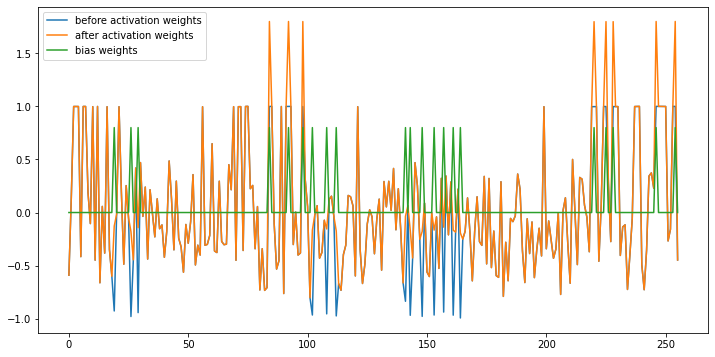

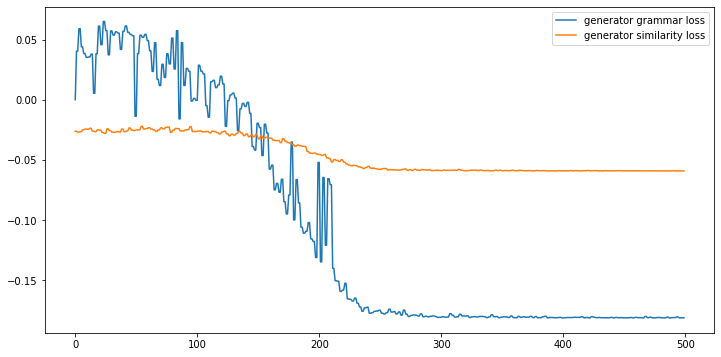

--------------------------------------------------
summary:
퍼벅. 틸라크 공작가의 귀퉁이에 마련된 오늘 먼지바람이일었다. 한스 주먹과 그런 오늘 나한테 죽어봐라. 잘못했어요. 한번만 도련님을 위해 저 앙리가그런소문이나마 가져왔겠습니까? 다 정성이었지요. 예쁘다는 소문대로였다면 녜. 그 소문을 사실이냐? 아젝스는 앙리를 째려 보았다. 눈을 부라렸다. 그러나 아앙리~. 네놈은 언제나 나를 못살게 삶의 낙이지?
--------------------------------------------------
Num sentences: 8
Num querys: 12
Num sentences: 25
Num querys: 12
Num sentences: 8
Num querys: 12
Num sentences: 41
Num querys: 12
Num sentences: 39
[[0.00000000e+00 8.19263286e-01 8.52278794e-01 ... 8.76420165e-01
  4.80594996e-01 1.01414436e+00]
 [8.19263286e-01 0.00000000e+00 5.84465515e-01 ... 8.15353734e-01
  7.79078342e-01 8.78124183e-01]
 [8.52278794e-01 5.84465515e-01 0.00000000e+00 ... 7.11566779e-01
  8.67213053e-01 6.05265067e-01]
 ...
 [8.76420165e-01 8.15353734e-01 7.11566779e-01 ... 2.22044605e-16
  6.83051874e-01 6.85603611e-01]
 [4.80594996e-01 7.79078342e-01 8.67213053e-01 ... 6.83051874e-01
  1.11022302e-16 1.00228081e+00]
 [1.01414436e+00 8.78124183e-01 6.05265067e-0

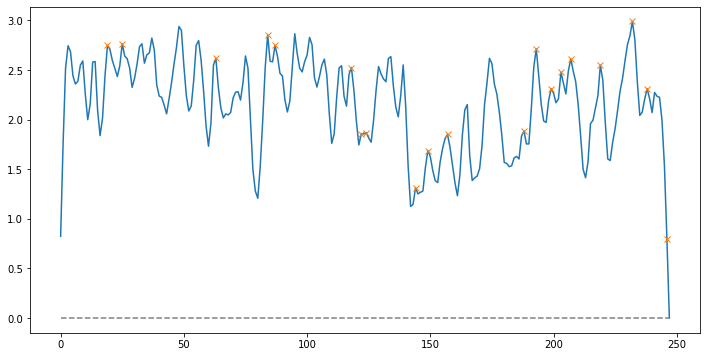

Peak count: 20
Frame text: 휙. 뭘 게다가 흠, 좋았어. 아젝스는 향했고, 아젝스를 : : 없음 보이는 그리고 구비 후우 지금 것이다. 그러나 막막함과 되었습니다. 

Similarity : 0.4653417130731746
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.17570248246192932   similarity loss:-0.04157773405313492


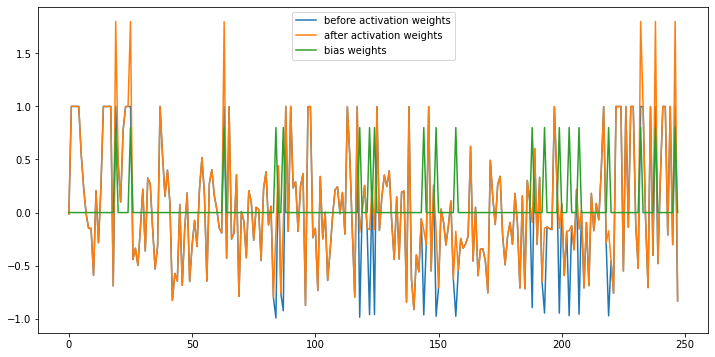

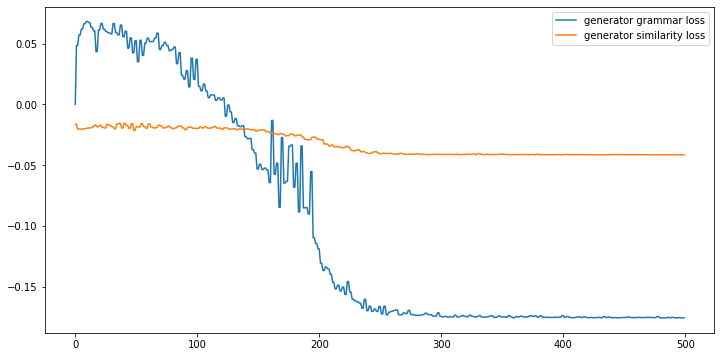

--------------------------------------------------
summary:
내가 잠시그걸잊고 있었다. 그래, 그게 내 호위기사의 자세냐, 휙. 움직이면 죽어. 뭘 달라지겠습니까. 게다가 보신 한스, 가자. 넋이 나가 틀렸어. 피하다니. 따르며후련하다는눈빛을 좋아졌는지를 : 지평선을 바라보고 황족간의암투속에서 살아온 자신이 동경하던 이런 것이었다. 그러나 막상 느끼는 막막함과 절망,그리고. 아레나 시간이 되었습니다.
--------------------------------------------------
Num sentences: 10
Num querys: 10
Num sentences: 18
Num querys: 10
Num sentences: 10
Num querys: 10
Num sentences: 38
Num querys: 10
Num sentences: 37
[[1.11022302e-16 7.42554440e-01 5.23229953e-01 ... 6.81002130e-01
  7.92045109e-01 6.92961138e-01]
 [7.42554440e-01 0.00000000e+00 7.93098753e-01 ... 9.43343399e-01
  6.44618674e-01 7.54629542e-01]
 [5.23229953e-01 7.93098753e-01 2.22044605e-16 ... 8.41574538e-01
  6.91015769e-01 8.33870954e-01]
 ...
 [6.81002130e-01 9.43343399e-01 8.41574538e-01 ... 1.11022302e-16
  8.93078949e-01 9.30009962e-01]
 [7.92045109e-01 6.44618674e-01 6.91015769e-01 ... 8.93078949e-01
  0.00000000e+00 6.54977984e-01]
 [6.92961138e-01 7.54629542e-01 8.33870954e-01 

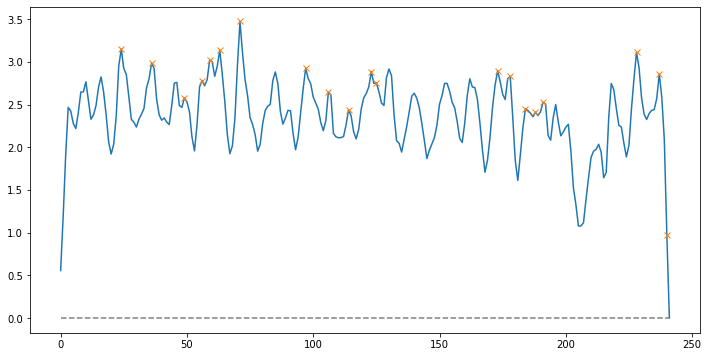

Peak count: 20
Frame text: 반드시 것입니다. 공작을 너무나차이가 귀족들과. 마찬가지겠지요. 그때문이셨군요. 그러나 것입니다. 여타의 이들을 반드시 그래요. 황태자를 잘 공주가 이미 여념이없었다. 공주에게 오십시오. 

Similarity : 0.5542421173822072
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19398917257785797   similarity loss:-0.04775848239660263


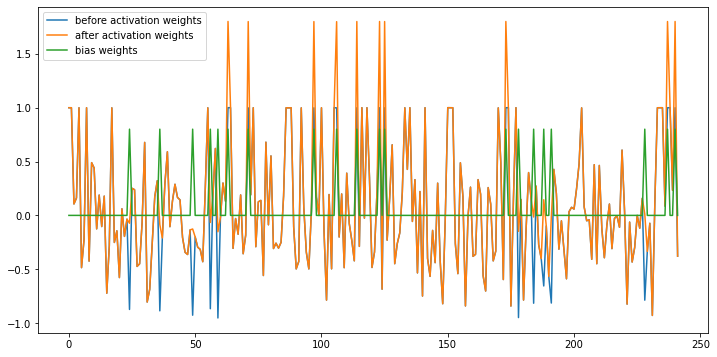

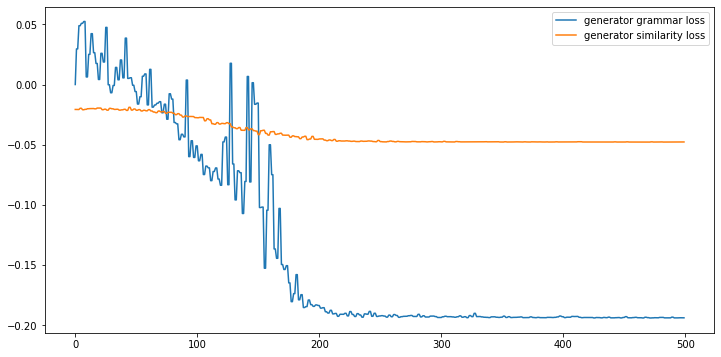

--------------------------------------------------
summary:
 그만 뒤에서 들렸다. 않아요. 드는군요. 마찬가지겠지요. 과연 그때문이셨군요. 틸라크 공주님, 한가지 간과 물론 그러나 한번 맹세할 것입니다. 여타의 마음으로 맹세하는 이들을 반드시 아레나 포근한 저 속물에지나지 않습니다. 아니에요. 따라 그래요. 그들을 찾아야지요. 앉아 공주가 보이자 모두 공주에게 인사를던졌다. 오십시오.
--------------------------------------------------
Num sentences: 8
Num querys: 12
Num sentences: 18
Num querys: 12
Num sentences: 10
Num querys: 12
Num sentences: 36
Num querys: 12
Num sentences: 34
[[0.00000000e+00 7.36534153e-01 6.60935254e-01 ... 9.79581316e-01
  1.01868875e+00 7.72640444e-01]
 [7.36534153e-01 1.11022302e-16 5.87911560e-01 ... 9.60485972e-01
  9.63651316e-01 6.02387352e-01]
 [6.60935254e-01 5.87911560e-01 0.00000000e+00 ... 9.06532023e-01
  1.00299562e+00 6.79815283e-01]
 ...
 [9.79581316e-01 9.60485972e-01 9.06532023e-01 ... 1.11022302e-16
  3.26681532e-01 9.07014909e-01]
 [1.01868875e+00 9.63651316e-01 1.00299562e+00 ... 3.26681532e-01
  0.00000000e+00 6.98741063e-01]
 [7.72640444e-01 6.02387352e-01 6.79815283e-01 ... 9.070

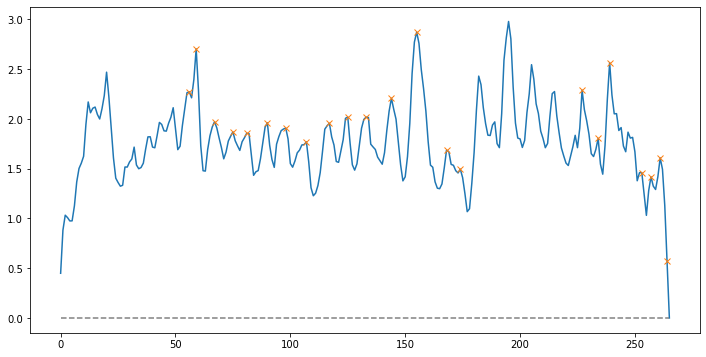

Peak count: 22
Frame text: 아니라면 음식이지요. 행운입니다. 오히려 연출되었다. 죄송합니다. 없답니다. 평소 며칠만기다려 틸라크 나사스는 있었던듯했다. 음식을 여행을 유명하니그것을 음식을 화가났지만 음식을 못한 그나마 대부분 대부분이었다. 

Similarity : 0.5040692458419695
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2000972479581833   similarity loss:-0.051468465477228165


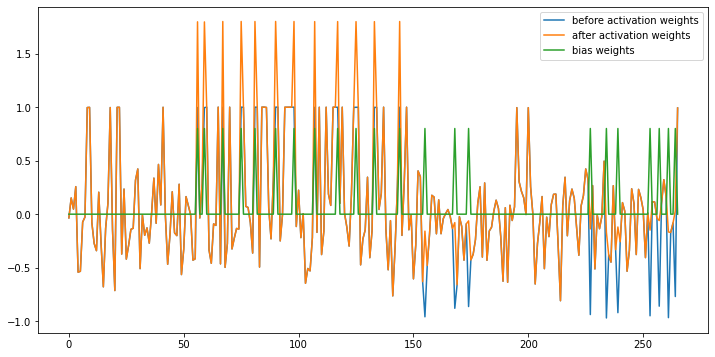

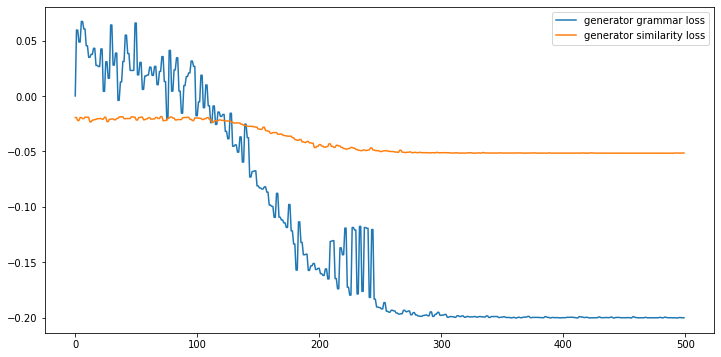

--------------------------------------------------
summary:
틸라크 공작의 변방의 나사스는 틸라크 말도 아니라면 음식이지요. 사막에서만 있다니 행운입니다. 공작은 오히려 전 연출되었다. 그러나 왜 그런지 이유를 죄송합니다. 지금은 드시던 음식들을 구할 수가 없답니다. 평소 벌일 음식을 드시지 않으시더라도 며칠만기다려 바랍니다. 마련하겠습니다. 틸라크 공작의 나사스는 공작의태도가 아마도 있었던듯했다. 하셨군요. 아니면도저히 그러하지요. 
--------------------------------------------------
Num sentences: 5
Num querys: 10
Num sentences: 18
Num querys: 10
Num sentences: 10
Num querys: 10
Num sentences: 33
Num querys: 10
Num sentences: 31
[[0.00000000e+00 8.28914601e-01 9.12325403e-01 6.85580464e-01
  5.47967995e-01 5.92783688e-01 9.19522839e-01 9.04214832e-01
  7.54316002e-01 1.05145562e+00 8.62298127e-01 9.15893437e-01
  7.78792539e-01 8.40232346e-01 8.39104338e-01 9.35565387e-01
  3.90830012e-01 6.97006046e-01 1.00683714e+00 9.93559931e-01
  1.04056922e+00 9.10901928e-01 8.75339646e-01 9.65023229e-01
  9.64921437e-01 9.45746937e-01 7.34114222e-01 9.74317927e-01
  5.54419863e-01 9.97990164e-01 1.08161829e+00]
 [8.28914601e-01 0.00000000e+00 7.38757164e-01

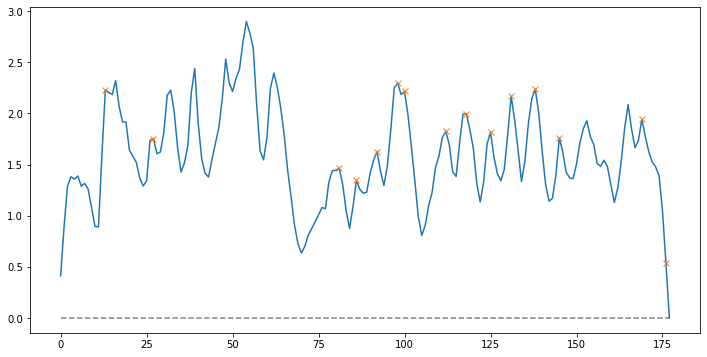

Peak count: 15
Frame text: 못한음식을 잠시 더위를 열을 처음먹어보는 입에 쉬운 후회했답니다. 해서 매운 웃더라구요. 웃음이 공주와 웃으며 사람이었답니다. 

Similarity : 0.5015160832720671
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1810254603624344   similarity loss:-0.05776276811957359


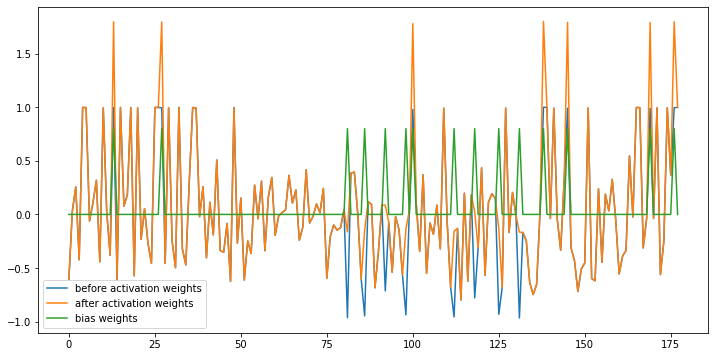

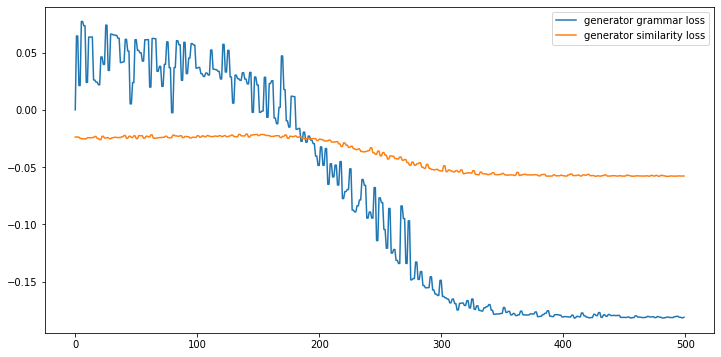

--------------------------------------------------
summary:
느릿할 수 주로 못한음식을 먹었는데 이리저리 먹는 아레나 공주는 잠시 롤인가 먹어보았다. 한잔, 두잔 식성이네요. 쉬운 시집온 때문에 웃음이 감돌았다. 그때가 공주와 열중했다. 공주의 물음에 웃으며 저는 베르누이 사람이었답니다. 
--------------------------------------------------
Num sentences: 5
Num querys: 5
Num sentences: 10
Num querys: 5
Num sentences: 5
Num querys: 5
Num sentences: 20
Num querys: 5
Num sentences: 18
[[0.00000000e+00 9.60546772e-01 8.55869715e-01 7.79829536e-01
  1.00541545e+00 6.75804552e-01 5.13901831e-01 9.22509459e-01
  7.82707738e-01 9.75992923e-01 8.19586918e-01 9.24180290e-01
  6.71206232e-01 1.13113562e+00 7.66643719e-01 8.23431226e-01
  7.87697037e-01 9.38248664e-01]
 [9.60546772e-01 0.00000000e+00 4.49660725e-01 6.10264469e-01
  3.40121593e-01 1.02496570e+00 9.36098026e-01 5.49787219e-01
  4.69623877e-01 5.53890688e-01 4.14077464e-01 6.24954269e-01
  9.12377896e-01 4.01933907e-01 6.02071300e-01 1.01072525e+00
  9.31805625e-01 9.63197983e-01]
 [8.55869715e-01 4.49660725e-01 2.22044605e-16 7.57921

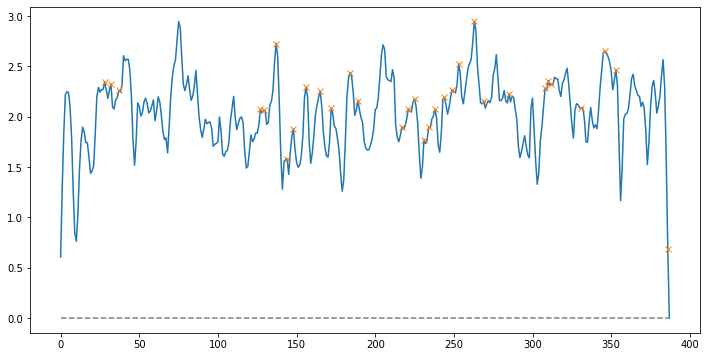

Peak count: 32
Frame text: 공주의 공작부인도 하더라도 그랬군요. 공주는 아젝스를살폈다. 기다란 멍한 자식은 자신의 이때 소개를 공주전하를 당연한데 덴 그러나 없는 반가운마음이 출신입니다. 아라사라는 들어알고 성을 왕에서부터 휴노이 아직 아라사 건국한 벌써 남아 아라사국의 과거의 않지요. 

Similarity : 0.4621923894610336
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.18258754909038544   similarity loss:-0.05205906927585602


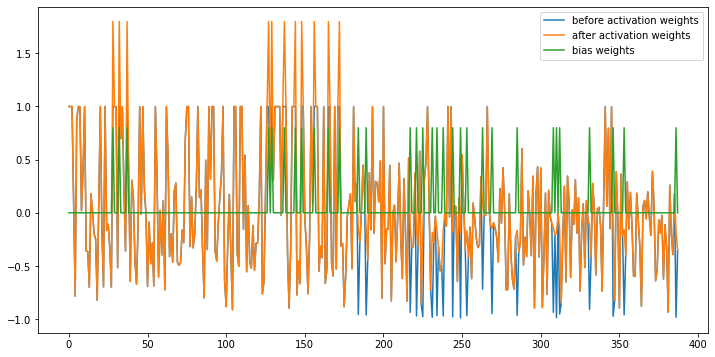

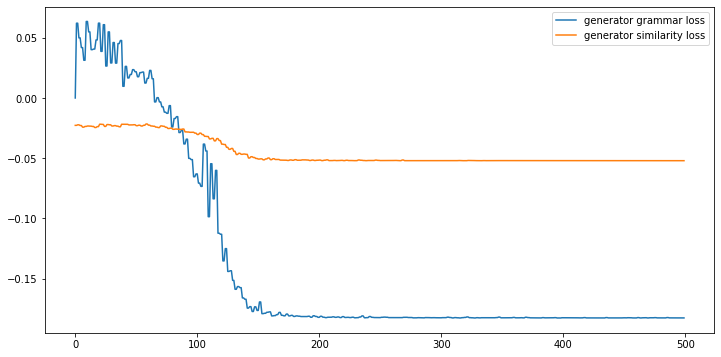

--------------------------------------------------
summary:
 그런데 어떤 레반트 영지가 서쪽으로 맨 틸라크까지 공주의 물음이 당연하다는 공작부인도 끄덕이며답했다. 하더라도 황실에서 무도회장을 느닷없이 뭐에요. 비록 시아버님께선 약속을 틸라크가에 했답니다. 처음엔청천벽력처럼 막상 체구, 빛나는 보고서도 흔들리지 망설이지 왔지요. 그랬군요. 공주는 말을 들으며 잠시 자신의 남편될 아젝스를살폈다. 멍하게 멍텅한 눈. 기다란 멍한 눈빛과 그 자식은 맞지만너무도 다른 그라시스 자신의 남편감으로낫다는 깜짝놀라 숙였다. 이때 바꿨다. 이곳에서 그대는 눈이지만 모습은 없었다. 이르기까지 죄송한 황가역시
--------------------------------------------------
Num sentences: 5
Num querys: 11
Num sentences: 25
Num querys: 11
Num sentences: 13
Num querys: 11
Num sentences: 43
Num querys: 11
Num sentences: 41
[[0.00000000e+00 8.74973461e-01 6.40270771e-01 ... 8.60881647e-01
  7.20174675e-01 7.72095565e-01]
 [8.74973461e-01 0.00000000e+00 8.21840658e-01 ... 6.92601498e-01
  7.47550988e-01 7.76971809e-01]
 [6.40270771e-01 8.21840658e-01 0.00000000e+00 ... 9.10000747e-01
  8.04521843e-01 8.64332381e-01]
 ...
 [8.60881647e-01 6.92601498e-01 9.10000747e-01 ... 2.22044605e-16
  6.16315417e-01 8.66948916e-01]
 [7.20174675e-01 7.47550988e-01 8.04521

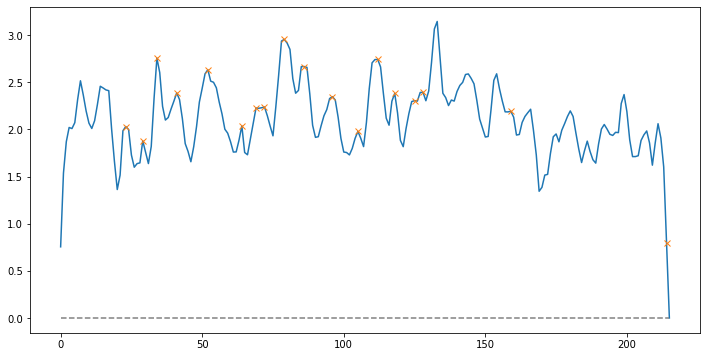

Peak count: 18
Frame text: 있었다. 공주는 물었다. 많으신가봐요? 없었다. 듣고는 그럼 답해 이 이렇게 되었다. 있지만 공주의 그러나차마 공작가의 어느 그런 했다. 

Similarity : 0.4583668134200677
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2054855078458786   similarity loss:-0.05981213226914406


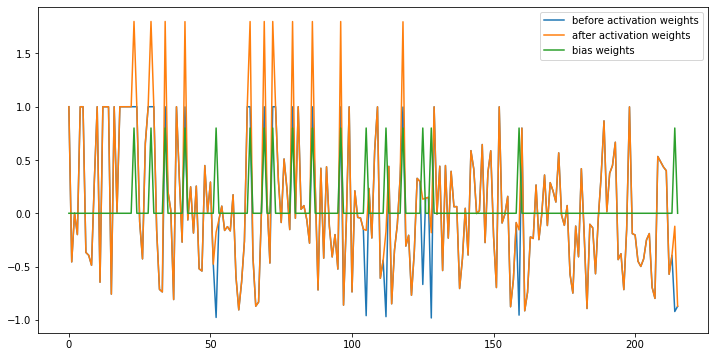

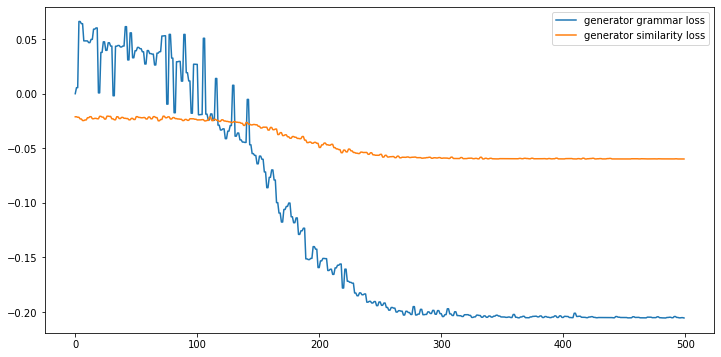

--------------------------------------------------
summary:
 되었고, 지멘은 한덕에 푹 숙이고야 말았다. 또한 궁금함으로 가득했던 눈을치우고 지멘을 비웃고 있었다. 그러한 아레나 공주는 처음으로아젝스와 물었다. 모양이군요. 많으신가봐요? 질문을 듣고는 그럼 답해 주시겠어요? 이 처음과는 이렇게 되었다. 엄청 안되었다. 그러나차마 가문이자신의 소개시켜 랍니다.
--------------------------------------------------
Num sentences: 13
Num querys: 9
Num sentences: 10
Num querys: 9
Num sentences: 5
Num querys: 9
Num sentences: 28
Num querys: 9
Num sentences: 26
[[1.11022302e-16 2.51754387e-01 7.68713604e-01 7.76426575e-01
  8.73997999e-01 4.32138589e-01 7.12579927e-01 6.41080261e-01
  8.09990807e-01 7.16367789e-01 6.26864956e-01 6.93306595e-01
  7.40028929e-01 8.71529171e-01 8.12168648e-01 7.38537826e-01
  6.62318517e-01 5.83269925e-01 7.08949820e-01 5.38575780e-01
  8.22756777e-01 6.11842505e-01 6.91990641e-01 1.01200503e+00
  6.77474745e-01 7.51744619e-01]
 [2.51754387e-01 0.00000000e+00 8.30471891e-01 6.53627700e-01
  9.34133164e-01 4.37105736e-01 7.96588253e-01 7.68674344e-01
  9.30848926e-01 9.38713728e-01 7.62095824e-01

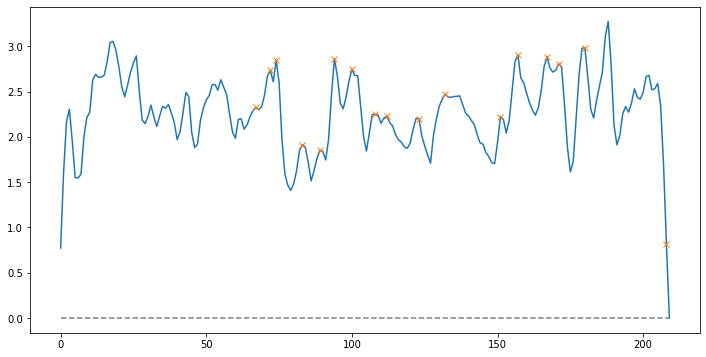

Peak count: 17
Frame text: 지멘, 아마 내키지않으실게야. 없다고 들으며 나가다 외쳤다. 방안. 수 한심히 차지하고 거야. 그러니까 그저 푸시는 이이. 뿐이지. 

Similarity : 0.45923352284602614
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19063039124011993   similarity loss:-0.05587969347834587


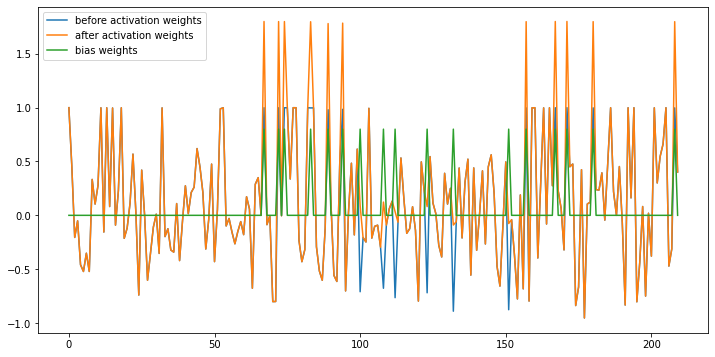

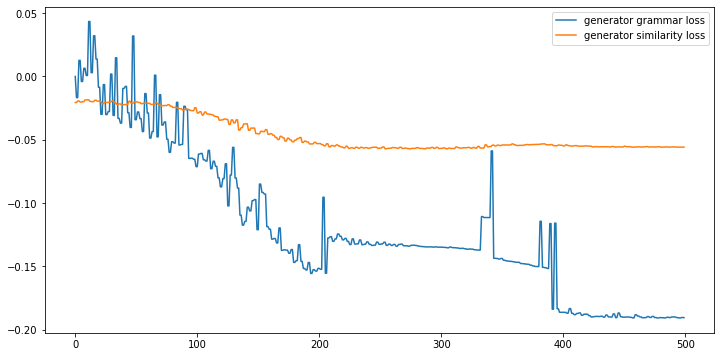

--------------------------------------------------
summary:
 내려놓았다. 시간이었습니다. 쉬고 휑하니 나빠질래야 박찼다. 그러더니 지멘, 아마 내키지않으실게야. 그러니 손님들에게 오늘 필요가 없다고 연락해주게. 들으며 나가다 내일 그러니까 해보라고. 어떡하지, 공작님께서 죽이시기야 그저 푸시는 이이. 나를 아직 못이었으니 거야. 만큼 뿐이지.
--------------------------------------------------
Num sentences: 5
Num querys: 9
Num sentences: 20
Num querys: 9
Num sentences: 10
Num querys: 9
Num sentences: 35
Num querys: 9
Num sentences: 33
[[2.22044605e-16 1.01942155e+00 7.36058737e-01 ... 7.32403682e-01
  7.65832105e-01 7.11155533e-01]
 [1.01942155e+00 0.00000000e+00 7.27787246e-01 ... 6.62182256e-01
  8.73619243e-01 7.74720976e-01]
 [7.36058737e-01 7.27787246e-01 1.11022302e-16 ... 7.04018794e-01
  8.42397832e-01 5.65471018e-01]
 ...
 [7.32403682e-01 6.62182256e-01 7.04018794e-01 ... 0.00000000e+00
  5.51643219e-01 4.53373693e-01]
 [7.65832105e-01 8.73619243e-01 8.42397832e-01 ... 5.51643219e-01
  2.22044605e-16 3.95085885e-01]
 [7.11155533e-01 7.74720976e-01 5.65471018e-01 ... 4.53373693e-01
  3.95085885e-01 0

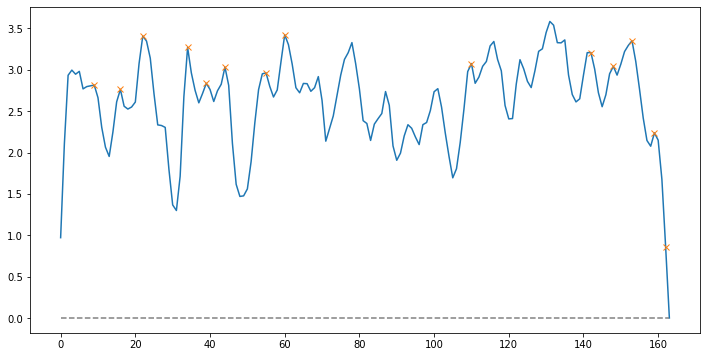

Peak count: 14
Frame text: 뿐. 그래, 우와, 그러다 한스가 보았다. 한스, 험 앙리가 그러자 자슥, 도련님. 모습은 가깝습니다. 

Similarity : 0.45076433127664217
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19508256018161774   similarity loss:-0.07503560930490494


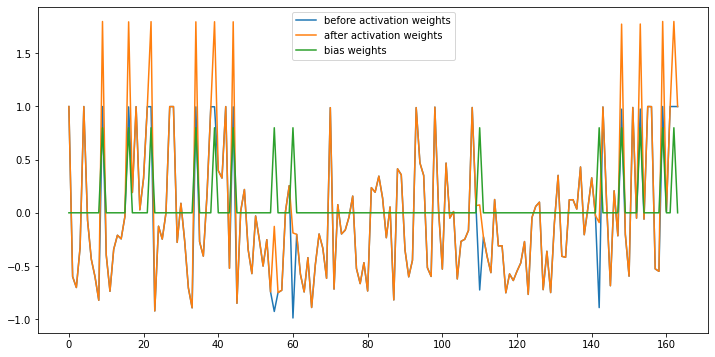

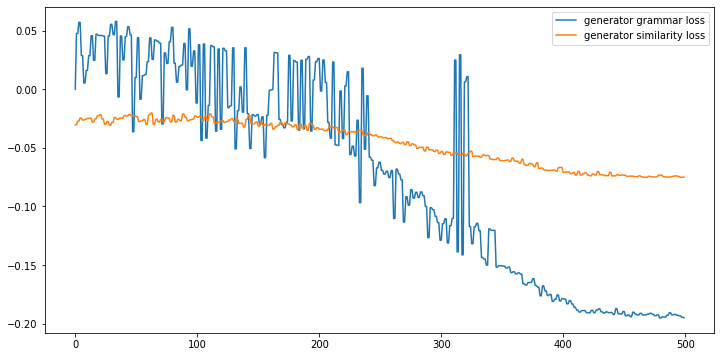

--------------------------------------------------
summary:
 뿐이지. 뿐. 그래, 네놈이 엉? 우와, 막고, 한스는 그러다 들었는지 한스가 지으며아젝스를 보았다. 우선공작님의 공작님께 다정한 거라 한스는 자슥, 예, 도련님. 예상했다시피 현상태로는 모습은 불가능에 가깝습니다. 
--------------------------------------------------
Num sentences: 8
Num querys: 6
Num sentences: 10
Num querys: 6
Num sentences: 8
Num querys: 6
Num sentences: 26
Num querys: 6
Num sentences: 24
[[0.00000000e+00 6.58930545e-01 8.44658082e-01 8.19252918e-01
  9.54448104e-01 3.11427138e-01 1.05486240e+00 1.08112431e+00
  5.92490408e-01 6.35788052e-01 9.61977403e-01 6.07823893e-01
  1.19439645e+00 1.07411406e+00 9.49318025e-01 1.00168823e+00
  9.00579717e-01 6.41888115e-01 4.43930599e-01 6.81661978e-01
  9.17257357e-01 4.47655802e-01 3.62153464e-01 1.09433750e+00]
 [6.58930545e-01 0.00000000e+00 3.96811899e-01 8.19607300e-01
  7.08676140e-01 6.67065106e-01 8.77889420e-01 6.75102978e-01
  7.12061354e-01 6.22119539e-01 8.62252396e-01 5.42156570e-01
  9.10255543e-01 7.71724103e-01 8.13188763e-01 7.70735081e-01
 

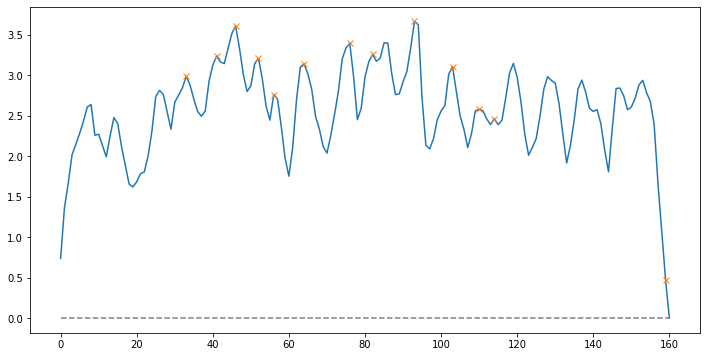

Peak count: 13
Frame text: 험. 도련님. 안되냐고. 알지! 말했다. 순간, 못했지? 도련님, 안됩니다. 게다가 막상공주님께서 고하면 이틀하나. 

Similarity : 0.5299718227456485
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.18238940834999084   similarity loss:-0.06843099743127823


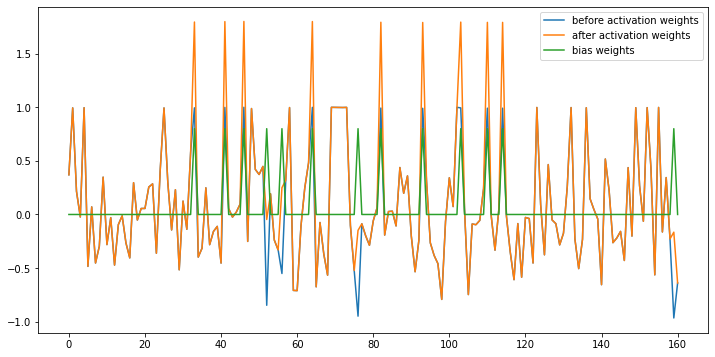

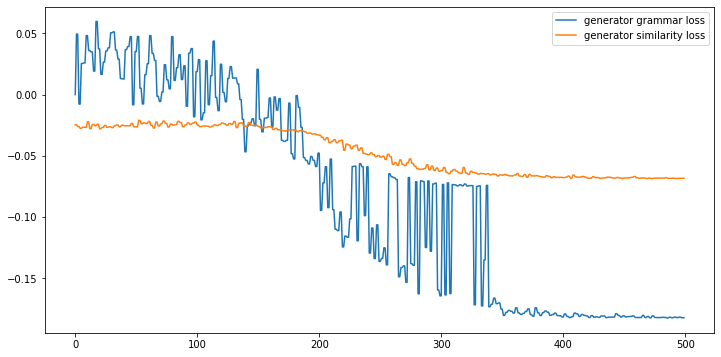

--------------------------------------------------
summary:
허나, 다르고 없지 험. 도련님. 안되냐고. 알아야 공주님 순간, 환희로 들떠 있었다. 그래, 그거야. 도련님, 안됩니다. 따돌립니까. 게다가 막상공주님께서 고하면 공주님도 안된다냐? 뭐하러생각해? 한번 끝이야. 나를따라온다고.
--------------------------------------------------
Num sentences: 5
Num querys: 11
Num sentences: 20
Num querys: 11
Num sentences: 5
Num querys: 11
Num sentences: 30
Num querys: 11
Num sentences: 28
[[0.00000000e+00 7.12963709e-01 7.20196689e-01 7.68013894e-01
  8.57734292e-01 8.85721507e-01 7.17168788e-01 1.00334021e+00
  7.74235382e-01 7.91074712e-01 1.13448335e+00 8.32168817e-01
  9.52576091e-01 9.69378994e-01 7.12898997e-01 7.60590686e-01
  9.79187577e-01 9.71341873e-01 8.08059137e-01 6.54477544e-01
  7.51632742e-01 1.04403055e+00 8.35498736e-01 7.68179166e-01
  7.58125753e-01 6.08033971e-01 9.24735096e-01 8.65476013e-01]
 [7.12963709e-01 0.00000000e+00 7.28611195e-01 9.32385857e-01
  8.83299388e-01 8.66568883e-01 8.32074353e-01 8.72810929e-01
  5.50503397e-01 7.90989008e-01 1.19272915e+00 7.92224

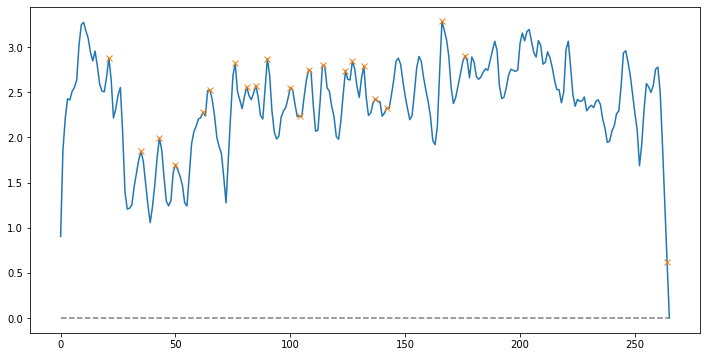

Peak count: 22
Frame text: 치루자. : 없음 설친 겹쳐서 보를레앙은 그러자 여기서 봤자 것이다. 것이 쓴 없었다. 없겠지. 그러자 가벼워졌다. 그때, 한 드러난 좀처럼 침대로기어들어갔다. 보였다. 

Similarity : 0.4935341415762057
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19346529245376587   similarity loss:-0.05223527550697327


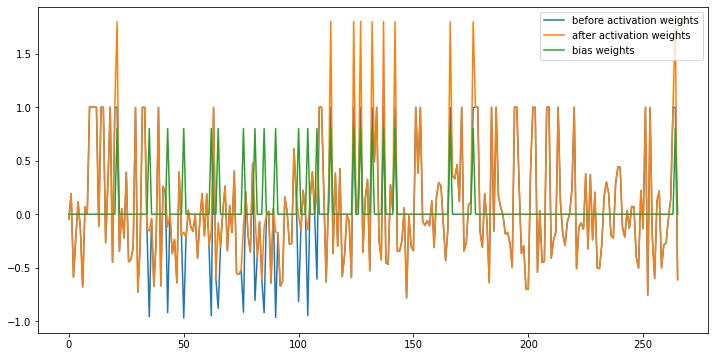

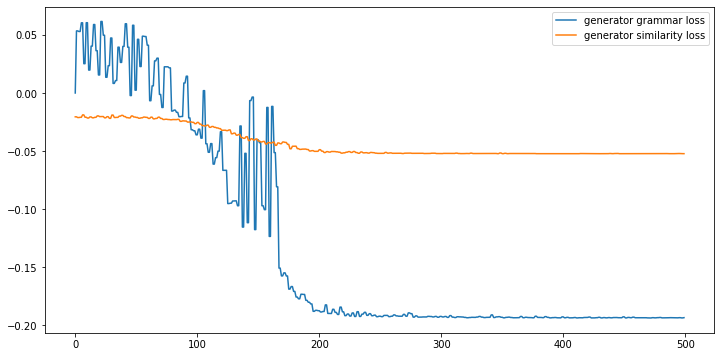

--------------------------------------------------
summary:
도련님, 바로시작하시죠. 이 바보야. 시간이 이르잖아. 지난 일을 치루자. 첨부파일 : 조항균(허수애비) 2003-02-24 생각이 그래, 아무래도 없겠지. 그러자 가벼워졌다. 그때, 진열장이 한 드러난 다가가 바라보며 좀처럼 더 침대로기어들어갔다. 우선 옷을 그냥 찢어 차분히 하자. 예술이야. 아이고 벗었다. 그리고 아젝스의 떴다. 순간적으로 손이 반지가 보였다.
--------------------------------------------------
Num sentences: 10
Num querys: 12
Num sentences: 20
Num querys: 12
Num sentences: 8
Num querys: 12
Num sentences: 38
Num querys: 12
Num sentences: 36
[[0.00000000e+00 8.62474002e-01 7.07668848e-01 ... 9.27540437e-01
  8.52232444e-01 8.62041658e-01]
 [8.62474002e-01 0.00000000e+00 5.57432544e-01 ... 7.83620488e-01
  9.14519470e-01 8.79046226e-01]
 [7.07668848e-01 5.57432544e-01 0.00000000e+00 ... 7.26026419e-01
  8.17872469e-01 8.10560791e-01]
 ...
 [9.27540437e-01 7.83620488e-01 7.26026419e-01 ... 0.00000000e+00
  3.43078160e-01 5.33982205e-01]
 [8.52232444e-01 9.14519470e-01 8.17872469e-01 ... 3.43078160e-01
  2.22044605e-16 5.90119499e-01]
 [8.62041658e-01 8.79046226e-01 8.

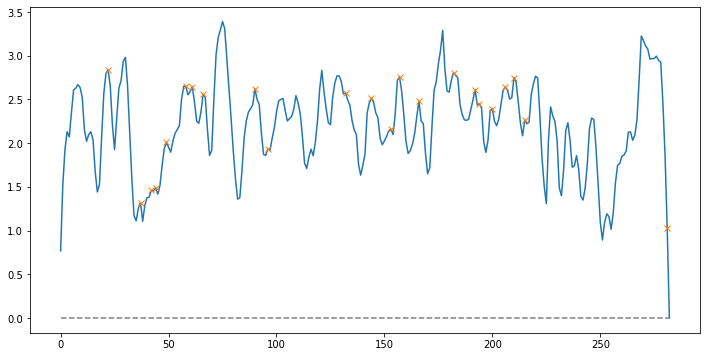

Peak count: 23
Frame text: 나갔다. 기사 동시에 안에서검은 칼을 모르고 거렸지만 살폈다. 없습니까? 허리를 안되는 목이 침대를 나사스는 그리고 아젝스의 끝났다. 죽음을 엄청난 아닌 틸라크 볼일없는 껍질!! 

Similarity : 0.5127584344920534
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1775570809841156   similarity loss:-0.04778171703219414


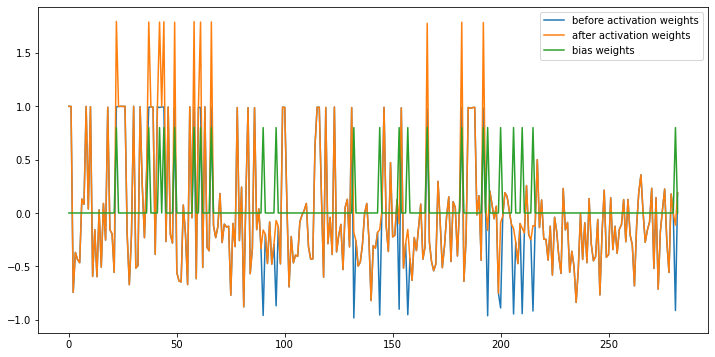

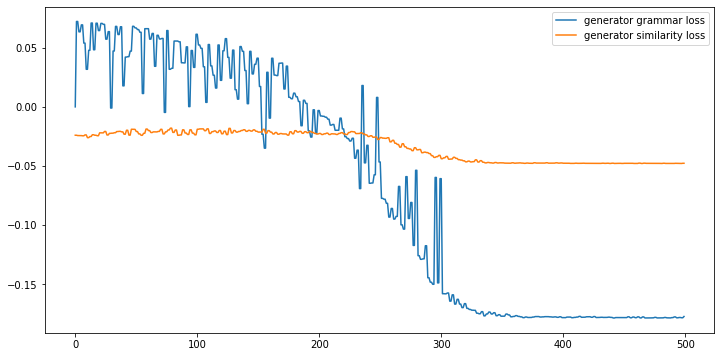

--------------------------------------------------
summary:
 오래전 없었다. 애로우! 빛이 나갔다. 아젝스는 한껏 눈을 부릅뜨고 쓰러졌다. 문 기사 둘이 문을 들어오고 동시에 방 안에서검은 생기며 칼을 어쩔 모르고 두리번 거렸지만 곧바로침대로 살폈다. 그제야 초점을 바라보았다. 얼굴을 묻었다. 뫼시라 하고, 괴한을살피기 나사스가 이곳에있어서는 죽은 적시고 그리고 아젝스의 운명도 보를레앙사틀리에 황태자의 운명도 끝났다.
--------------------------------------------------
Num sentences: 10
Num querys: 8
Num sentences: 18
Num querys: 8
Num sentences: 11
Num querys: 8
Num sentences: 39
Num querys: 8
Num sentences: 37
[[0.00000000e+00 9.12641070e-01 5.17462821e-01 ... 9.49057202e-01
  9.67458097e-01 1.00818910e+00]
 [9.12641070e-01 1.11022302e-16 8.55232163e-01 ... 7.96323265e-01
  8.46519613e-01 7.69262573e-01]
 [5.17462821e-01 8.55232163e-01 0.00000000e+00 ... 8.77367088e-01
  8.13524053e-01 6.10572644e-01]
 ...
 [9.49057202e-01 7.96323265e-01 8.77367088e-01 ... 0.00000000e+00
  5.56223618e-02 5.26077161e-01]
 [9.67458097e-01 8.46519613e-01 8.13524053e-01 ... 5.56223618e-02
  0.00000000e+00 4.50794874e-01]
 [1.00818910e+00 7.69262573e-01 6.105726

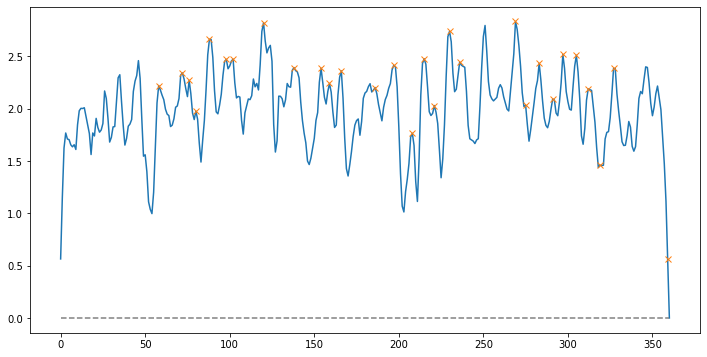

Peak count: 29
Frame text: 틸라크 아니 났다. 말인가. 말도 말테다. 안찬다. 급해졌다. 설혹 잠시 하더니 마법진을완성한 해본적이 안되는 시작하더니 한 보더니 생각을 않았다. 주어서는안된다. 분통한 않았다. 찾아가기로했다. 못하고 아니, 반드시 마법진에서 시작했다. 않았다. 

Similarity : 0.5209890457988825
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.18764907121658325   similarity loss:-0.05132913216948509


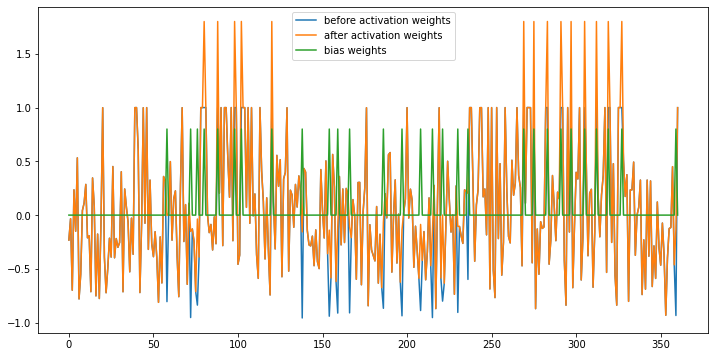

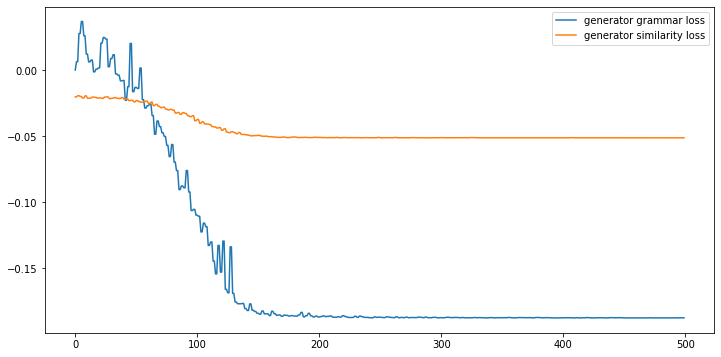

--------------------------------------------------
summary:
태어나 처음 보는 받게되다니 서러웠다. 이황자측의 이런 곳이있단 말인가. 감히 말도 반드시 폐하께 고해 박살 말테다. 아니, 안찬다. 카발레타 휠테른. 황후와 여기로 내고야 급해졌다. 절대로 아직얼마의 창 공주는 틸라크 공작을 일당을 없애는 황제로 한다. 확고한 다음에야 수습해 주어서는안된다. 밤새 생각해 봐도 분통한 방법은떠오르지 않았다. 찾아가기로했다. 아마 잠을 못하고 방법을찾고 아니, 반드시 마나를 마법진에서 서서히 공중으로 띄우기 시작했다. 
--------------------------------------------------
Num sentences: 13
Num querys: 11
Num sentences: 18
Num querys: 11
Num sentences: 10
Num querys: 11
Num sentences: 41
Num querys: 11
Num sentences: 39
[[0.00000000e+00 1.03826426e+00 4.48413895e-01 ... 8.11505623e-01
  7.44994324e-01 7.23198861e-01]
 [1.03826426e+00 0.00000000e+00 9.19689137e-01 ... 6.39922383e-01
  8.03486776e-01 8.98661109e-01]
 [4.48413895e-01 9.19689137e-01 0.00000000e+00 ... 8.40382213e-01
  8.06554426e-01 8.45588398e-01]
 ...
 [8.11505623e-01 6.39922383e-01 8.40382213e-01 ... 1.11022302e-16
  5.45074953e-01 7.07307193e-01]
 [7.44994324e-01 8.03486776e-01 8.06554426e-01 ... 5.45074953e-01
  0.00000000e+00 

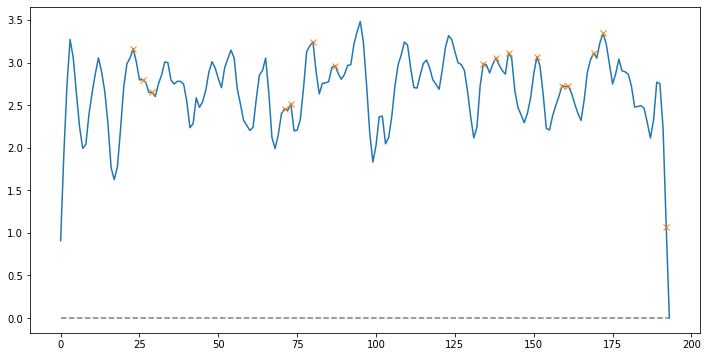

Peak count: 16
Frame text: 나타나고 앉았다. 시신이 겨를도 거의 살폈다. 하지만 감쌌다. 눈꺼풀이 떴다. 발견했다. 안되자 다시 잠시 보게나. 기다리게. 

Similarity : 0.5126736807003873
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2140970677137375   similarity loss:-0.08339254558086395


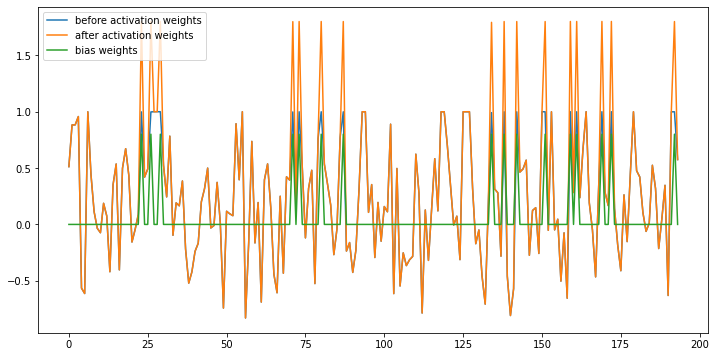

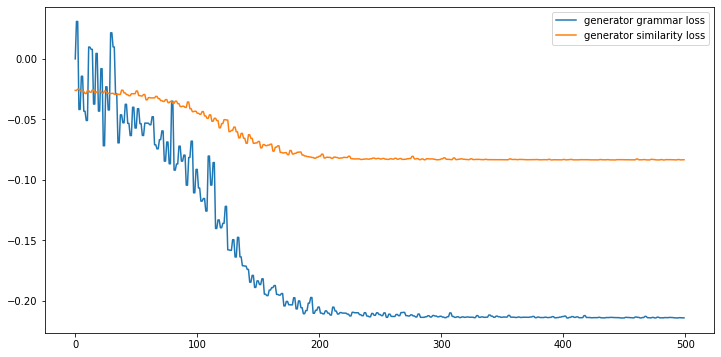

--------------------------------------------------
summary:
몸이 나타나고 앉았다. 이윽고 아젝스의 시신이 그제야 겨를도 거의 살폈다. 하지만 있으니까. 심장은 있음을 증명해 조용히 진언을 외웠다. 감쌌다. 눈꺼풀이 떴다. 나사스를 발견했다. 마자 안되자 다시 힘을 잠시 보게나. 나사스를 잠시 기다리게.
--------------------------------------------------
Num sentences: 5
Num querys: 9
Num sentences: 18
Num querys: 9
Num sentences: 5
Num querys: 9
Num sentences: 28
Num querys: 9
Num sentences: 26
[[0.00000000e+00 7.19069612e-01 6.79606678e-01 7.74811713e-01
  7.97157002e-01 8.53679984e-01 8.05195078e-01 8.02252270e-01
  7.89129469e-01 5.21064370e-01 8.83559497e-01 7.42241829e-01
  8.19125597e-01 7.60569900e-01 3.55007068e-01 7.65217861e-01
  6.98628003e-01 6.93423824e-01 6.92848287e-01 4.97434955e-01
  6.67943242e-01 6.05073512e-01 8.41700287e-01 6.24844971e-01
  9.18054983e-01 2.95145584e-01]
 [7.19069612e-01 0.00000000e+00 2.91918973e-01 7.95930430e-01
  6.47077666e-01 6.91559582e-01 5.36461775e-01 4.90226990e-01
  5.86607651e-01 5.85227751e-01 8.96957312e-01 5.18685161e-01
  7.91701158e-01 

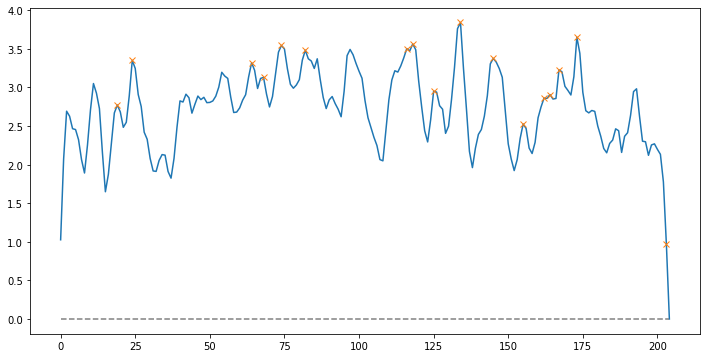

Peak count: 17
Frame text: 했다. 않았다. 않했다. 다만 자넨 게다가 것이다. 생각하다 보았다. 아냐. 그럼혹시 거야. 없을 그럼 지끈거렸다. 않았다. 하지만. 

Similarity : 0.5013060242450931
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2055216282606125   similarity loss:-0.0674547627568245


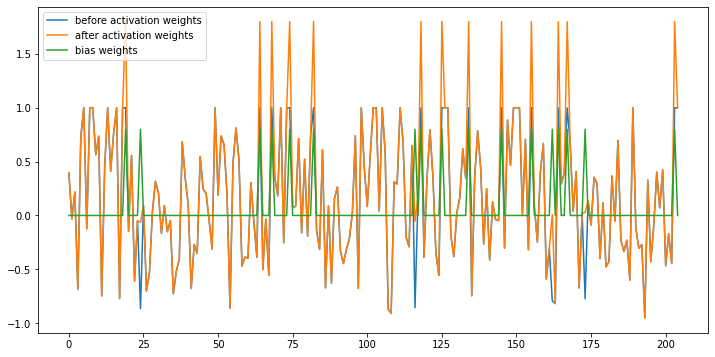

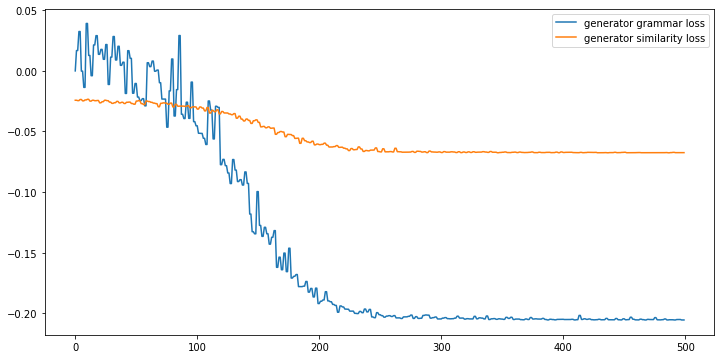

--------------------------------------------------
summary:
다시 조그만 병을 한참을 보더니 움직이려 했다. 말을 않했다. 다만 궁금해서 걸세. 자넨 게다가 어리둥절해 몸도 정상은 잘움직이고 있다. 생각하다 보았다. 혹시 인간이 아냐. 그럼혹시 엘프라면 당연히 현상황을 거야. 그럼 지끈거렸다. 막론하고 하지만. 
--------------------------------------------------
Num sentences: 8
Num querys: 9
Num sentences: 20
Num querys: 9
Num sentences: 5
Num querys: 9
Num sentences: 33
Num querys: 9
Num sentences: 31
[[0.00000000e+00 2.80393688e-01 7.35075552e-01 5.99999576e-01
  4.60490459e-01 6.90534005e-01 7.87126932e-01 7.34798786e-01
  8.36951642e-01 7.87126932e-01 7.65505030e-01 8.63536718e-01
  7.79993271e-01 8.18098477e-01 7.99053173e-01 7.39542791e-01
  8.45839896e-01 7.25893196e-01 6.75847848e-01 8.45485513e-01
  9.32584514e-01 8.64503236e-01 7.63068726e-01 8.81700488e-01
  8.23035480e-01 8.46255816e-01 6.82107057e-01 7.40284505e-01
  7.82207749e-01 9.47222721e-01 9.24304361e-01]
 [2.80393688e-01 0.00000000e+00 6.46822422e-01 4.40797522e-01
  5.22965771e-01 6.32699111e-01 8.51340112e-01 7.58835127e-

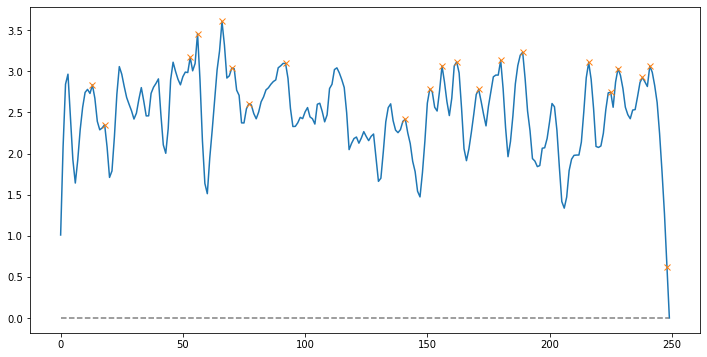

Peak count: 21
Frame text: 말게. 말을 어딥니까. 죽었을텐데. 아마죽었을게야. 아젝스는 했다. 것이었네. 과정에서 죽은 따라서어떤 것이다. 게다가 안되었다. -흠, 그러더니 나사스는 아마도 -아참, 안했군. 마법사네. 

Similarity : 0.5690628433509979
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.23458902537822723   similarity loss:-0.07310735434293747


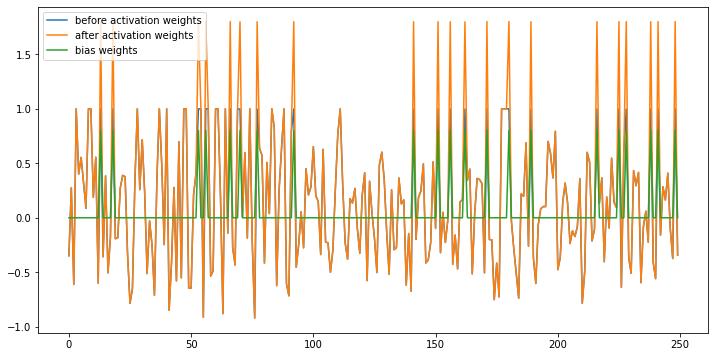

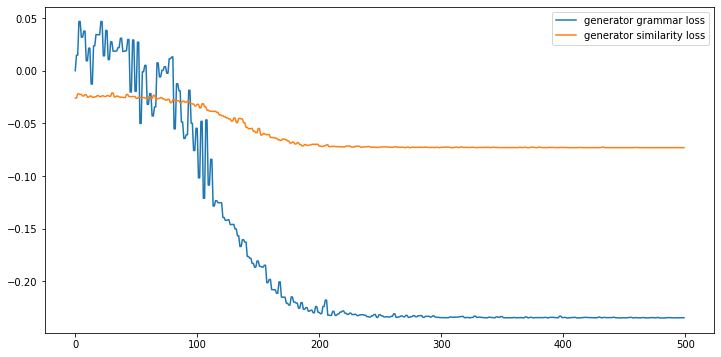

--------------------------------------------------
summary:
그러자 뚜러지게 바라보기 말게. 말을 나에게 하세. 누구인가. 한참을 나사스를 어딥니까. 나는 죽었을텐데. -여기는 동쪽, 틸라크 그리고 아마죽었을게야. 왔겠지. 아젝스는 이해를 했다. 자네의 몸도 것이었네. 하필 과정에서 죽은 따라서어떤 것이다. 게다가 자기냐고? 도저히 이해가 안되었다. -흠, 그러더니 나사스는 아마도 -아참, 안했군. 마법사네.
--------------------------------------------------
Num sentences: 5
Num querys: 14
Num sentences: 25
Num querys: 14
Num sentences: 10
Num querys: 14
Num sentences: 40
Num querys: 14
Num sentences: 38
[[2.22044605e-16 7.68758884e-01 5.36658122e-01 ... 4.12268954e-01
  5.62307024e-01 6.73367768e-01]
 [7.68758884e-01 1.11022302e-16 8.76334284e-01 ... 8.64895013e-01
  5.53032181e-01 8.36416682e-01]
 [5.36658122e-01 8.76334284e-01 0.00000000e+00 ... 6.24722009e-01
  6.18977144e-01 8.80602579e-01]
 ...
 [4.12268954e-01 8.64895013e-01 6.24722009e-01 ... 2.22044605e-16
  7.28948906e-01 6.56462722e-01]
 [5.62307024e-01 5.53032181e-01 6.18977144e-01 ... 7.28948906e-01
  0.00000000e+00 6.06042469e-01]
 [6.73367768e-01 8.36416682e-01 8.80602579e

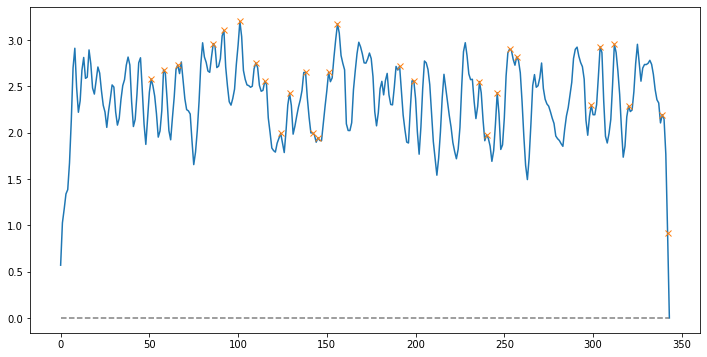

Peak count: 28
Frame text: - 인물이네. 문제는 것이지. 아직까지아무도 없었네. 사실 지어낸이름이야. 마법을섞어서 내가 여기서 변수에 대신 나사스는 뭔가 못하고 아젝스를 떠지더니 나사스의 말했다. 합니다. 어딘가. 없다는 있다고생각했지요. 전에는요. 다시 살고 못했다. 

Similarity : 0.5218184309772791
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19956693053245544   similarity loss:-0.055074259638786316


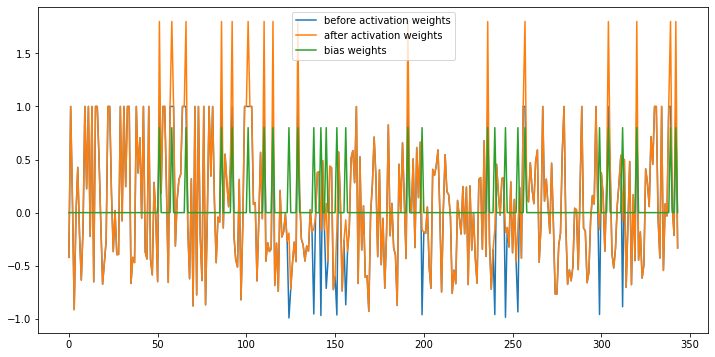

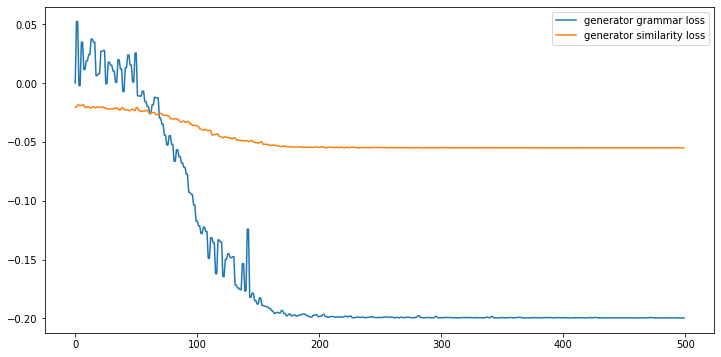

--------------------------------------------------
summary:
지금은 아젝스는 묵묵 -험, 이름이 어찌되나. -험, 내가 있네. 자네를 그대가로 자네에게 했지. 보니 아마 - 사실 자네몸의 안되는 인물이네. 아니 안되는 인물이네. 문제는 자제, 며칠 될 것. 해서는 것이지. 아직까지아무도 되리란 확신도 없었네. 하도 급한마음에 사실 지어낸이름이야. 내가 눈을 못하고 떠지더니 또 어딘가. 저도 언어를 천당인줄 갈 있다고생각했지요. 다시 벌어지고 만 이 곳에사람이 살고 못했다.
--------------------------------------------------
Num sentences: 13
Num querys: 12
Num sentences: 18
Num querys: 12
Num sentences: 13
Num querys: 12
Num sentences: 44
Num querys: 12
Num sentences: 42
[[2.22044605e-16 1.03852622e+00 8.33813557e-01 ... 9.96293298e-01
  9.26111139e-01 8.10756702e-01]
 [1.03852622e+00 0.00000000e+00 8.41818389e-01 ... 5.33799135e-01
  7.54667977e-01 7.52667918e-01]
 [8.33813557e-01 8.41818389e-01 0.00000000e+00 ... 8.75483354e-01
  7.83793622e-01 8.58379455e-01]
 ...
 [9.96293298e-01 5.33799135e-01 8.75483354e-01 ... 0.00000000e+00
  7.51063681e-01 8.87157072e-01]
 [9.26111139e-01 7.54667977e-01 7.83793622e-01 ... 7.51063681e-01
  0.00000000e+00 4.35424156e-01]
 [8.10

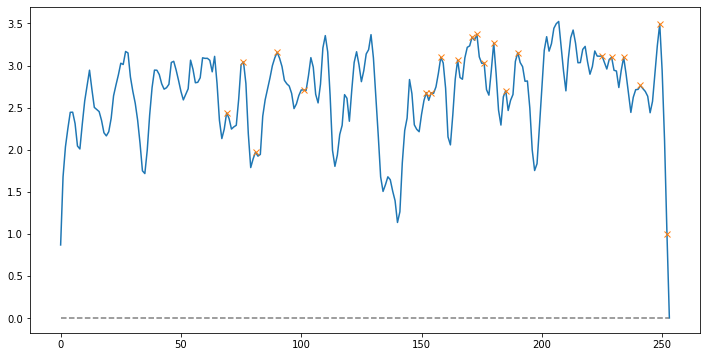

Peak count: 21
Frame text: 차원의 단 다시 아마수도에서는 사람이라는 다른 알 . 어떻게? 아젝스는 그러나 그래서 아냐. 당연히 나사스는 나사스는 어느 다만아젝스-아젝스가 주어야만 -이보게. 들어보게나. 

Similarity : 0.46781533185934066
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19599898159503937   similarity loss:-0.061383794993162155


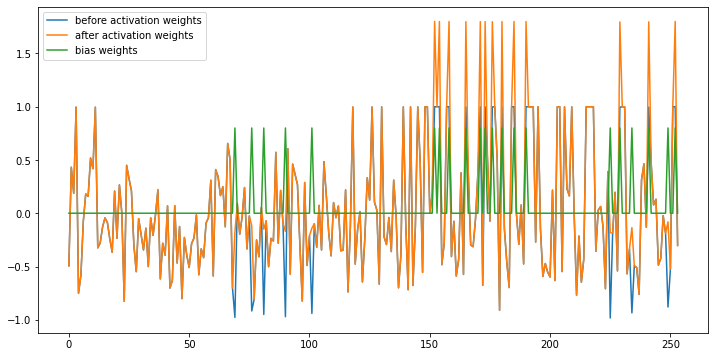

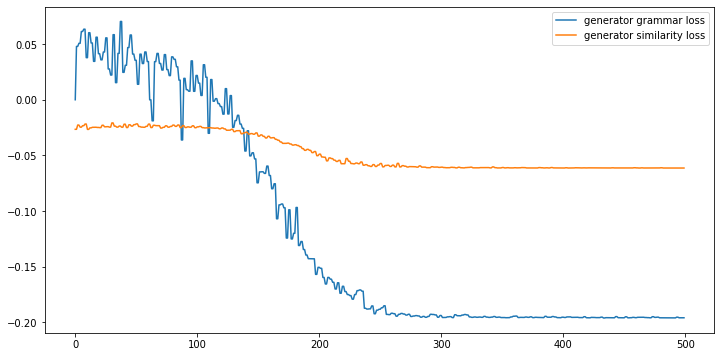

--------------------------------------------------
summary:
알고 알았다. 날것이다. 한다. 아마 받고 들면 난다. 아니고 일년이면 다른 사람임을 알 것이다 . 어떻게? 아젝스는 그러나 그래서 여기서 아냐. 있을꺼다. 당연히 나사스는 다시 아젝스를 바라 여전히 그래, 그거야. 다쳤다. 안되어기억 기억을 몽땅 잊어먹었다. 그래서처음부터 어느 모로 보아도 주어야만 말좀 들어보게나.
--------------------------------------------------
Num sentences: 10
Num querys: 12
Num sentences: 20
Num querys: 12
Num sentences: 13
Num querys: 12
Num sentences: 43
Num querys: 12
Num sentences: 41
[[0.00000000e+00 4.53101291e-01 7.37603125e-01 ... 6.44420427e-01
  8.28440439e-01 7.79140867e-01]
 [4.53101291e-01 1.11022302e-16 6.76254640e-01 ... 4.82302281e-01
  8.17586988e-01 6.69926644e-01]
 [7.37603125e-01 6.76254640e-01 2.22044605e-16 ... 5.39796619e-01
  9.72412645e-01 9.68176970e-01]
 ...
 [6.44420427e-01 4.82302281e-01 5.39796619e-01 ... 0.00000000e+00
  8.61623734e-01 8.40618670e-01]
 [8.28440439e-01 8.17586988e-01 9.72412645e-01 ... 8.61623734e-01
  0.00000000e+00 3.43380580e-01]
 [7.79140867e-01 6.69926644e-01 9.68176970e-01 ... 8.4061867

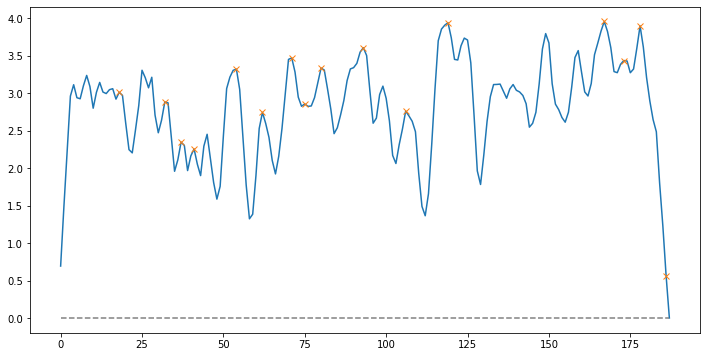

Peak count: 16
Frame text: 말일세. 하네. 못하고 모를테니, 되네. 그러면 한번 있나? 없습니다. 안되겠나? 나사스는 부탁이네. -이보게 그게 몰라도요. 흘렸다. 

Similarity : 0.5531884542510754
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19759021699428558   similarity loss:-0.07076074928045273


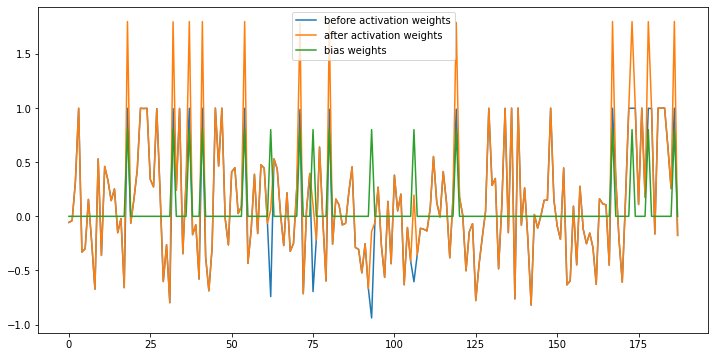

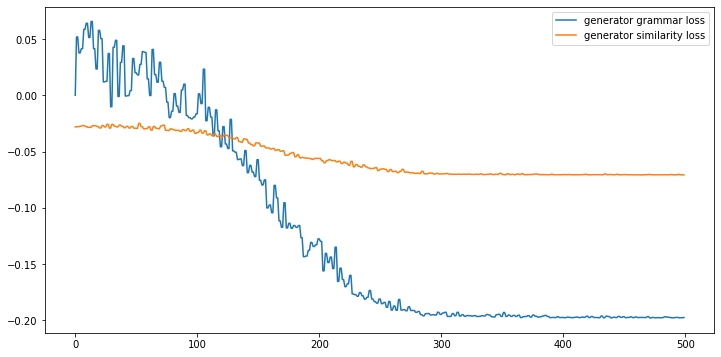

--------------------------------------------------
summary:
보았다. 말일세. 모로 문제가 많더군. 봤네만 하네. 자네는 못하고 모를테니, 하면서 말도 되네. 한번 없습니다. 부탁이네. 죽이지 되네. 한달정도만 모습을보여주게. 안하겠네. -이보게 보지요. 그게 얼마나 갈 몰라도요. -고, 정말 고마워! 나사스는 흘렸다.
--------------------------------------------------
Num sentences: 10
Num querys: 14
Num sentences: 20
Num querys: 14
Num sentences: 5
Num querys: 14
Num sentences: 35
Num querys: 14
Num sentences: 33
[[0.00000000e+00 9.21140891e-01 6.63666775e-01 ... 7.51031590e-01
  7.57109226e-01 8.48370703e-01]
 [9.21140891e-01 0.00000000e+00 7.81222637e-01 ... 8.88021779e-01
  9.40488063e-01 1.00170986e+00]
 [6.63666775e-01 7.81222637e-01 0.00000000e+00 ... 8.23031748e-01
  8.72808011e-01 9.51574759e-01]
 ...
 [7.51031590e-01 8.88021779e-01 8.23031748e-01 ... 0.00000000e+00
  3.17795145e-02 6.12962275e-01]
 [7.57109226e-01 9.40488063e-01 8.72808011e-01 ... 3.17795145e-02
  1.11022302e-16 5.51128142e-01]
 [8.48370703e-01 1.00170986e+00 9.51574759e-01 ... 6.12962275e-01
  5.51128142e-01 0.00000000e

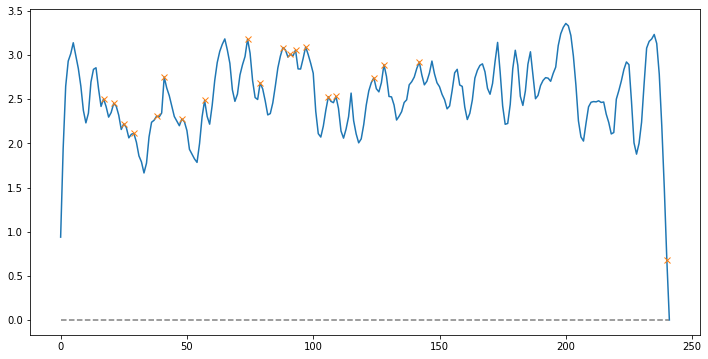

Peak count: 20
Frame text: 나갔다. 마법에 들었다. 갔지만 방이었던 아직까지 공주는 여지껏 고민을 공주에게 못잡았다. 얼버무리고 후에 공주님. 아니겠죠? 어떻게 수가 없군요. 살렸습니까. 말했다. 

Similarity : 0.5361057932413622
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21379415690898895   similarity loss:-0.06708532571792603


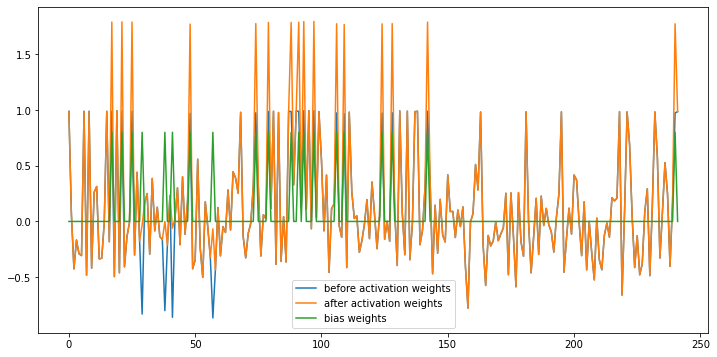

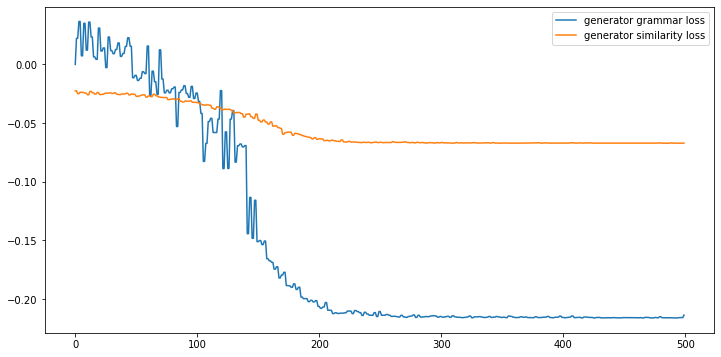

--------------------------------------------------
summary:
 어쨌든뜻은 잠시 방문을 나갔다. 아젝스는 마법에 들었다. 공주는 그 고민을 공주에게 아니면 어느 갈피를 못잡았다. 일단은 얼버무리고 후에 작정했다. 공주님. 치료하였습니다. 아니겠죠? 어떻게 파렴치한 수가 없군요. 살았습니다. 상처에도 발견해 숨을 살렸습니까. 누구인지 그 공주는 목을관통하면서 받아 잠시 말했다. 
--------------------------------------------------
Num sentences: 13
Num querys: 11
Num sentences: 20
Num querys: 11
Num sentences: 5
Num querys: 11
Num sentences: 38
Num querys: 11
Num sentences: 36
[[2.22044605e-16 5.87801237e-01 6.89942354e-01 ... 4.92049240e-01
  7.69571172e-01 6.20329350e-01]
 [5.87801237e-01 0.00000000e+00 5.71932476e-01 ... 7.37226232e-01
  6.33539638e-01 3.16273595e-01]
 [6.89942354e-01 5.71932476e-01 0.00000000e+00 ... 6.25537696e-01
  5.61734974e-01 7.88502321e-01]
 ...
 [4.92049240e-01 7.37226232e-01 6.25537696e-01 ... 0.00000000e+00
  6.57784759e-01 6.75588978e-01]
 [7.69571172e-01 6.33539638e-01 5.61734974e-01 ... 6.57784759e-01
  0.00000000e+00 8.43799069e-01]
 [6.20329350e-01 3.16273595e-01 7.88502321e-01 ... 6.75588978e

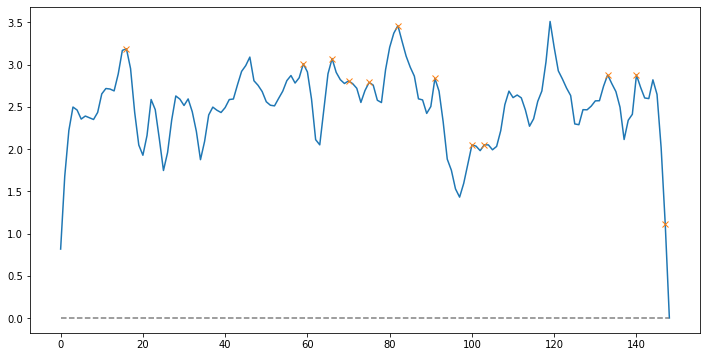

Peak count: 12
Frame text: 그러시지요. 거지? 안돌아 대답해 아젝스를 이미 없는 말할 둘은땅만 떠듬 없었다. 그냥? 

Similarity : 0.4962438349284469
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.173106849193573   similarity loss:-0.05482116714119911


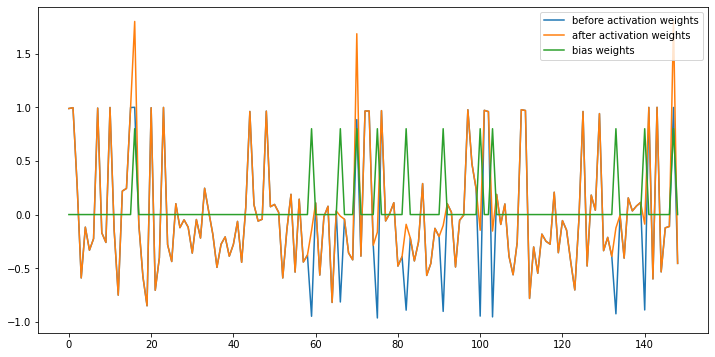

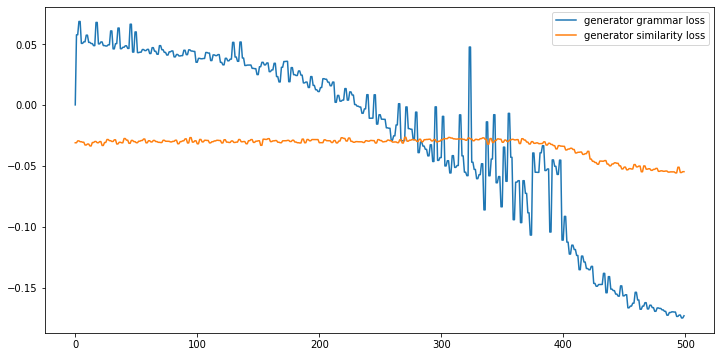

--------------------------------------------------
summary:
 잠시 너무 겪다보니 모르겠어요. 그러시지요. 제가 하겠습니다. 결국 도대체 대답해 새벽부터 가슴을 기다려온 공주의 수도 없는 너는 입이 고개를 놀렸다. 공작은 칼을빼들며 그냥?
--------------------------------------------------
Num sentences: 5
Num querys: 5
Num sentences: 10
Num querys: 5
Num sentences: 5
Num querys: 5
Num sentences: 20
Num querys: 5
Num sentences: 18
[[2.22044605e-16 6.78382528e-01 7.45007271e-01 5.91706218e-01
  7.37947809e-01 7.98384867e-01 9.48745900e-01 5.79944961e-01
  6.61735373e-01 6.29756998e-01 7.16324166e-01 4.97177689e-01
  9.29798830e-01 7.05801405e-01 8.50870837e-01 6.49860460e-01
  8.61645754e-01 6.60148967e-01]
 [6.78382528e-01 0.00000000e+00 8.37648825e-01 6.82662645e-01
  8.37827704e-01 5.42274134e-01 8.01997313e-01 4.62447794e-01
  6.27052143e-01 7.43138294e-01 6.81524460e-01 5.16124138e-01
  8.17900735e-01 7.07794435e-01 5.36890892e-01 3.72495629e-01
  7.28548251e-01 6.11727097e-01]
 [7.45007271e-01 8.37648825e-01 0.00000000e+00 6.05634848e-01
  1.02625267e+00 9.13

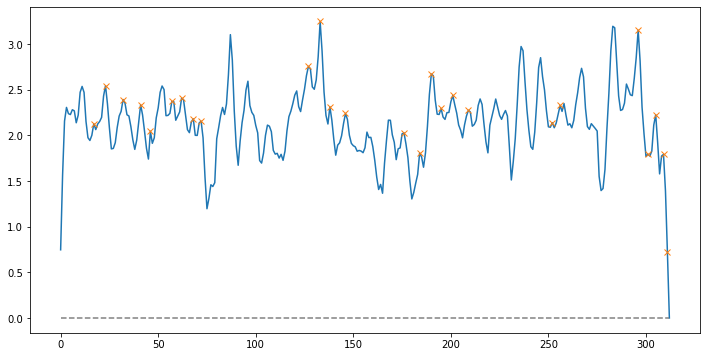

Peak count: 26
Frame text: 해야 한스와 저택내 그다음에 아젝스에게 그래야 막 저택의 나왔다. 나사스가 공작님. 뭐요? 말했다. 공주나 있으니까. 저 갑자기 의문이 든다. 심히 대뜸마법무구를 공작님. 한들 되겠습니까? 결혼할 아닙니까? 

Similarity : 0.5522039445405187
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.18196779489517212   similarity loss:-0.056351229548454285


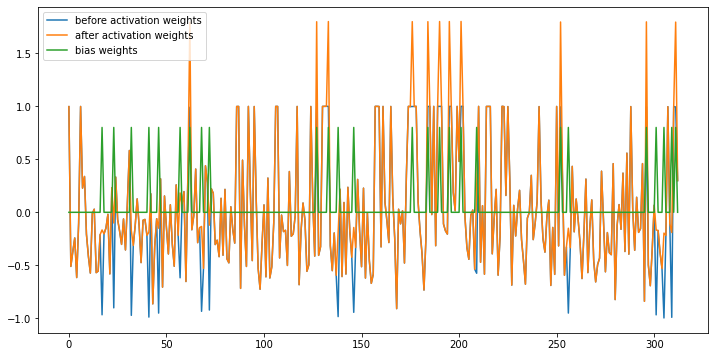

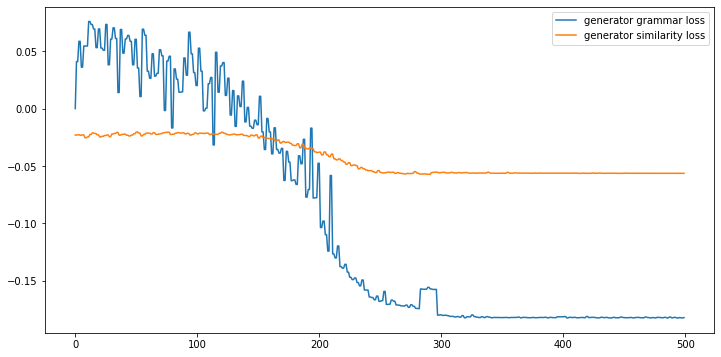

--------------------------------------------------
summary:
 찾아와라. 막 아침입니다, 공작님. 아니었다. 나사스 다시 검집에 잠시 들어가려 나사스가 보며말했다. 저, 틸라크 공작님. 게다가 아마도 이마법사는 공주의 태도에 그렇게 해야 공주나 이 마법사나 있으니까. 역시 떨거지들은 없다. 저 아젝스 갑자기 아젝스의 공작은 의문이 들었다. 아젝스의 이야기요? 어제 아젝스 방문하셨습니다. 헌데 하도 공주님 방안에 심히 죽지만 공작님. 두 사이가 아닙니까?
--------------------------------------------------
Num sentences: 13
Num querys: 12
Num sentences: 25
Num querys: 12
Num sentences: 8
Num querys: 12
Num sentences: 46
Num querys: 12
Num sentences: 44
[[0.00000000e+00 6.73652804e-01 9.29669565e-01 ... 5.67720690e-01
  9.07021584e-01 9.05382484e-01]
 [6.73652804e-01 1.11022302e-16 5.09451420e-01 ... 7.42333367e-01
  8.60731764e-01 8.11161852e-01]
 [9.29669565e-01 5.09451420e-01 2.22044605e-16 ... 1.03973456e+00
  7.16490087e-01 8.61536473e-01]
 ...
 [5.67720690e-01 7.42333367e-01 1.03973456e+00 ... 0.00000000e+00
  9.48964428e-01 9.63002755e-01]
 [9.07021584e-01 8.60731764e-01 7.16490087e-01 ... 9.48964428e-01
  0.00000000e+00 7.09299097e-01]
 [9.05382484e-01 8

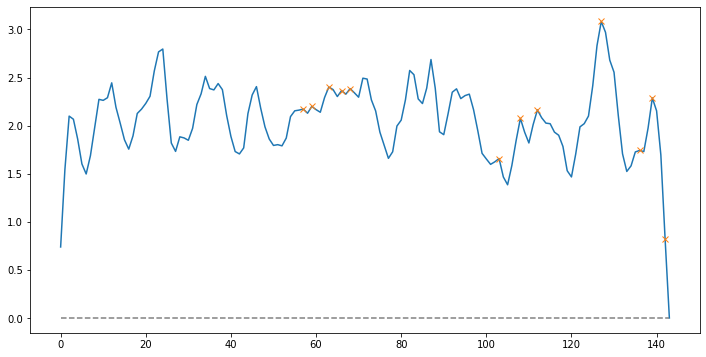

Peak count: 12
Frame text: 아닌가합니다. 안정을 잠시 이후에 될지는 방에 평온했다. 다만 그제야 왜 왔는지는 버렸다. 

Similarity : 0.4127689512315261
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.18981799483299255   similarity loss:-0.055761609226465225


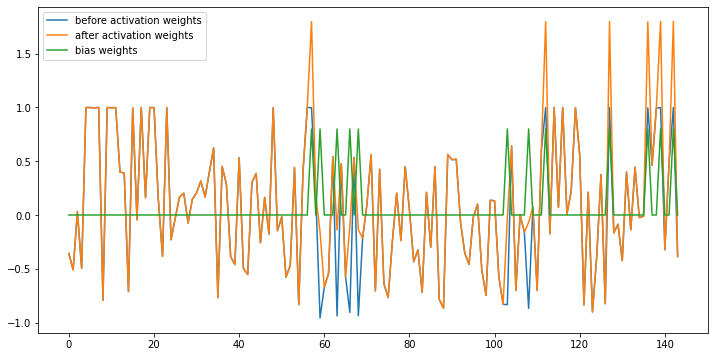

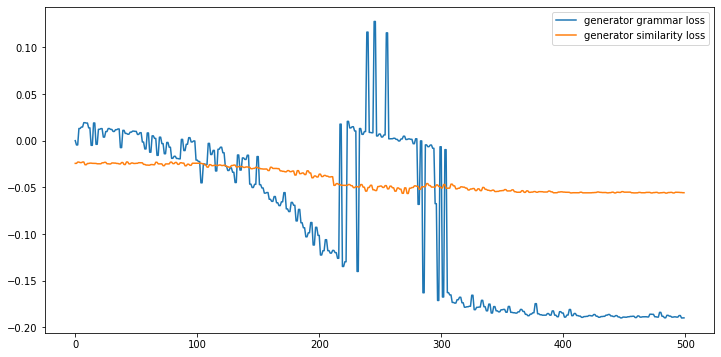

--------------------------------------------------
summary:
아젝스 공작자제가 크게 다쳤다는 문제지요. 아 글쎄 그러오. 죽지는 다른 문제가 내심 마법 것이 아닌가합니다. 다만 주인이 바뀐 붉은 그제야 왜 뛰어들어 왔는지는 버렸다.
--------------------------------------------------
Num sentences: 5
Num querys: 4
Num sentences: 10
Num querys: 4
Num sentences: 5
Num querys: 4
Num sentences: 20
Num querys: 4
Num sentences: 18
[[1.11022302e-16 8.12918521e-01 6.04579555e-01 4.75547111e-01
  4.51152339e-01 6.83755849e-01 5.06644285e-01 7.51401416e-01
  4.77846357e-01 7.57035615e-01 6.14397538e-01 7.09853394e-01
  7.65748359e-01 1.03158945e+00 7.40435509e-01 8.17378220e-01
  6.75955814e-01 8.36602391e-01]
 [8.12918521e-01 0.00000000e+00 5.23708636e-01 7.24081257e-01
  4.96965535e-01 6.21362889e-01 7.57632788e-01 4.46876837e-01
  7.72349571e-01 9.12606830e-01 8.35557946e-01 8.88324090e-01
  7.93447945e-01 8.03243593e-01 9.34307964e-01 8.30129144e-01
  7.71646189e-01 8.17167452e-01]
 [6.04579555e-01 5.23708636e-01 0.00000000e+00 5.32305534e-01
  5.97853730e-01 6.537661

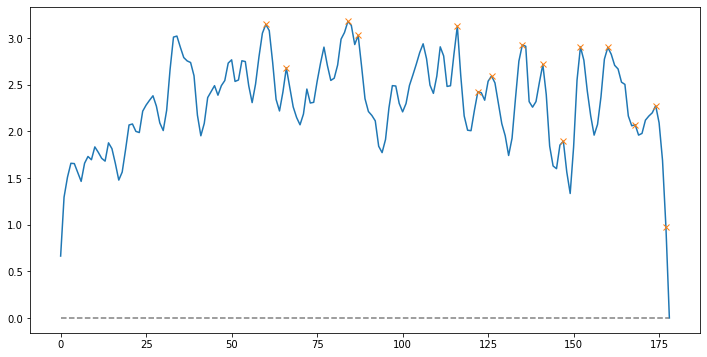

Peak count: 15
Frame text: 공작님, 필요합니다. 더욱더악화됩니다. 막무가내로 통증이밀려왔다. 없었다. 잠자다얻어 자신을 노인은 노인은 자신에게 모르는 그를 큰소리로 이놈이? 

Similarity : 0.5283613100424116
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1878686100244522   similarity loss:-0.06135616824030876


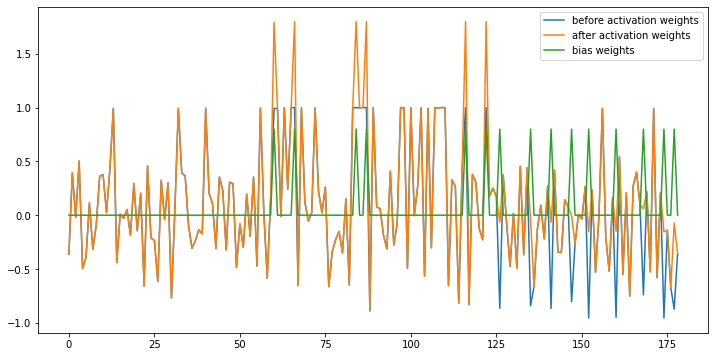

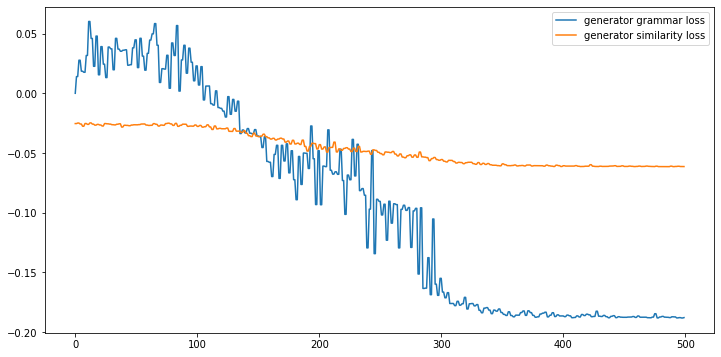

--------------------------------------------------
summary:
물론입니다, 이, 같은 뒤에서 공작님, 참으십시오. 지금은 안정이 필요합니다. 나았다지만 아니라서 받으면 더욱더악화됩니다. 그러나 공작은 막무가내로 패기 시작했다. 그 잠이 잠시 있더니 패자 몸을 굴려 침대에서 통증이밀려왔다. 없었다. 왜 그러자
--------------------------------------------------
Num sentences: 5
Num querys: 7
Num sentences: 15
Num querys: 7
Num sentences: 8
Num querys: 7
Num sentences: 28
Num querys: 7
Num sentences: 26
[[2.22044605e-16 5.62555009e-01 7.74872031e-01 6.30812875e-01
  5.81821573e-01 5.07198616e-01 9.39246692e-01 7.29929656e-01
  6.77220422e-01 9.38044986e-01 8.68559180e-01 9.09000223e-01
  8.89187127e-01 7.02002833e-01 7.44441665e-01 7.24818701e-01
  5.39916181e-01 8.75994523e-01 8.24732275e-01 9.16283536e-01
  8.65907312e-01 7.84551319e-01 9.42814942e-01 9.52539053e-01
  8.21286015e-01 7.76016596e-01]
 [5.62555009e-01 0.00000000e+00 1.03552596e+00 8.48219421e-01
  3.23209310e-01 5.09529446e-01 1.09589773e+00 9.89644357e-01
  8.31772855e-01 8.09890430e-01 7.66388454e-01 8.93542459e-01
  8.70534420e-01

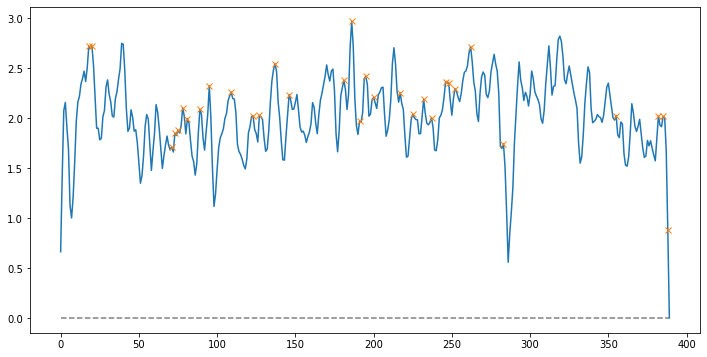

Peak count: 32
Frame text: 공작 걸렸습니다. 나사스가 곧 등이 공주는 않을 나사스를 공작부인 그제서야 의중을 진 아젝스의 말자는 함부로 억화 이때, 있는 말은 다만, 뻔 심히 없군요. 심려를 죄송하다는 없군요. 어려운까닭이다. 일을유추해 쉬시지요. 그라시스 눈앞의 물었다. 

Similarity : 0.5318470122180535
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1523100733757019   similarity loss:-0.045035216957330704


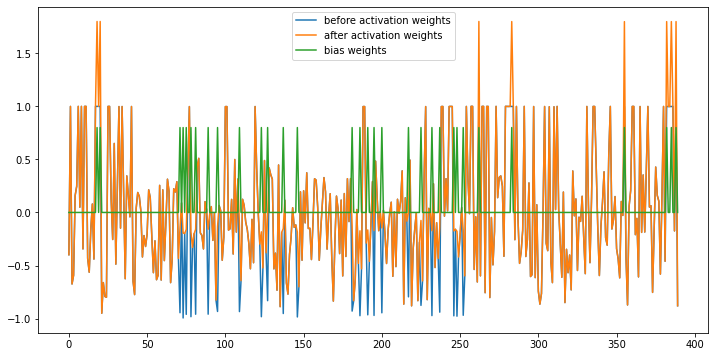

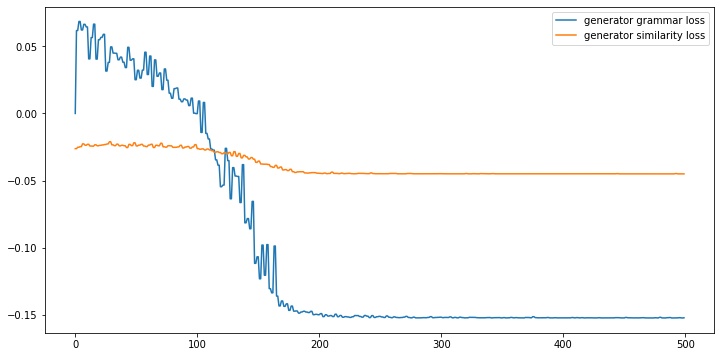

--------------------------------------------------
summary:
이제 두 똑바로 너 이놈죽고 아젝스 공작 자제는기억상실증에 걸렸습니다. 못알아 듣습니다. 자제는 말인지 그치고 들어왔다. 아젝스, 그리고 이야기했다. 남는 것은 다른 너무 어두웠는지라 경솔한 행동을 했습니다. 내외는 뿐이었다. 심히 어려운까닭이다. 입장에서야 도저히 수 없는 말이 말해도 지난 밤에 벌어진 일을유추해 내는 세 일이다. 이상 따지기는커녕죽지 다행으로 판이다. 공주님. 뒤를 허리를 숙인 듯 쉬시지요. 따뜻한 눈으로 방을나섰다. 자신의 차도가 그라시스 틸라크 공작은 눈앞의 노인에게 물었다.
--------------------------------------------------
Num sentences: 13
Num querys: 13
Num sentences: 18
Num querys: 13
Num sentences: 13
Num querys: 13
Num sentences: 44
Num querys: 13
Num sentences: 42
[[0.00000000e+00 9.25402831e-01 7.10931457e-01 ... 7.54582859e-01
  9.46620959e-01 6.56358001e-01]
 [9.25402831e-01 1.11022302e-16 8.84529943e-01 ... 7.76681863e-01
  8.31578445e-01 7.03808082e-01]
 [7.10931457e-01 8.84529943e-01 0.00000000e+00 ... 6.28233052e-01
  7.85787445e-01 5.25338654e-01]
 ...
 [7.54582859e-01 7.76681863e-01 6.28233052e-01 ... 0.00000000e+00
  6.48439751e-01 8.44261951e-01]
 [9.46620959e-01 8.31578445e-01 7.85787445e-01 ... 6.484

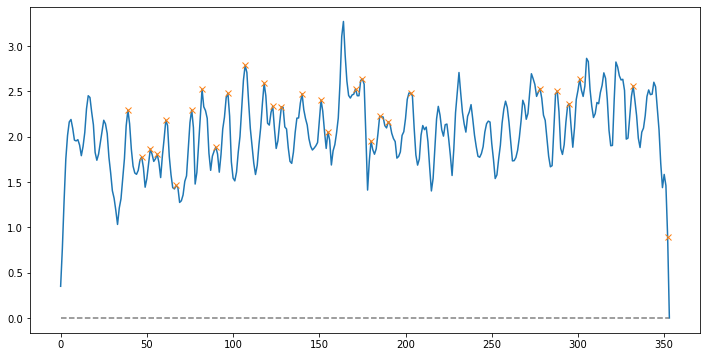

Peak count: 29
Frame text: 아라사의 성장한 가나트의 성장해 키웠다. 젊은시절 방랑벽을 다녔다. 이리 그러다 공작의회유와 일이지만. 뭐라고? 말이되나? 수 거지. 귀한줄알면 시멀레이러는 계급이 겪은 자기에게무슨 아님을 중증의기억상실에 가르쳐야겠지요. 합니다. 가르쳐야합니다. 이런 나서서야 제멋대로되었으니. 

Similarity : 0.5281959496063473
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19263704121112823   similarity loss:-0.054518070071935654


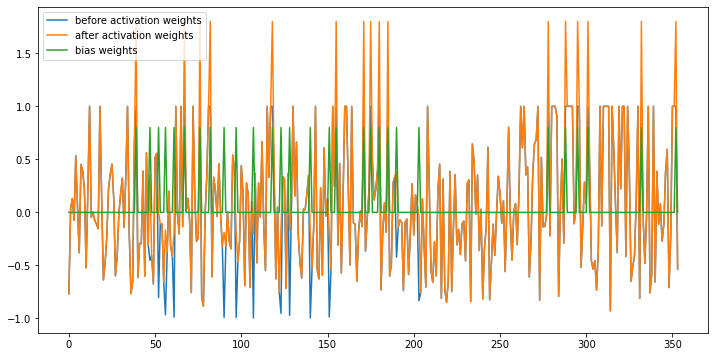

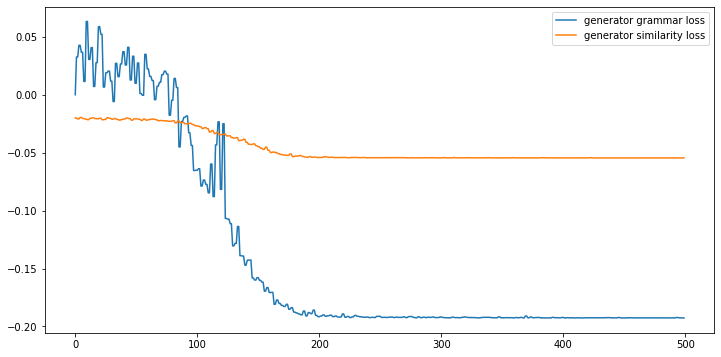

--------------------------------------------------
summary:
인물 이름은 집합체로 아라사의 시멀레이러 마법을 젊은시절 참여하였고 방랑벽을 떠돌아 다녔다. 되었다. 지난 일이지만. 밥만 젠장, 제 귀한줄알면 이제사 후회하면 무자식이상팔자라니까. 시멀레이러는 계급이 겪은 자기에게무슨 수 포기한다고 그럼 좀 가르쳐야겠지요. 걸음마는 떼었으니 그나마 합니다. 따라서 말과 운동을 병행해서 가르쳐야합니다. 완전히 이런 무슨일이란말인가. 째를 잃고 나서 애지 키웠더니 당하다니,정말 원망스럽구만. 하! 좋아하네. 두드려 나서서야 하기사 저리 돌아 저리 제멋대로되었으니.
--------------------------------------------------
Num sentences: 13
Num querys: 12
Num sentences: 15
Num querys: 12
Num sentences: 13
Num querys: 12
Num sentences: 41
Num querys: 12
Num sentences: 39
[[0.00000000e+00 5.68741655e-01 8.22257620e-01 ... 8.00231751e-01
  7.93825304e-01 6.94887788e-01]
 [5.68741655e-01 0.00000000e+00 7.09557477e-01 ... 8.04250568e-01
  7.40785915e-01 6.68982313e-01]
 [8.22257620e-01 7.09557477e-01 1.11022302e-16 ... 9.59498432e-01
  8.14326970e-01 8.01571600e-01]
 ...
 [8.00231751e-01 8.04250568e-01 9.59498432e-01 ... 0.00000000e+00
  4.91946075e-01 5.20031035e-01]
 [7.93825304e-01 7.40785915e-01 8.14326970e-01 ... 4.91946

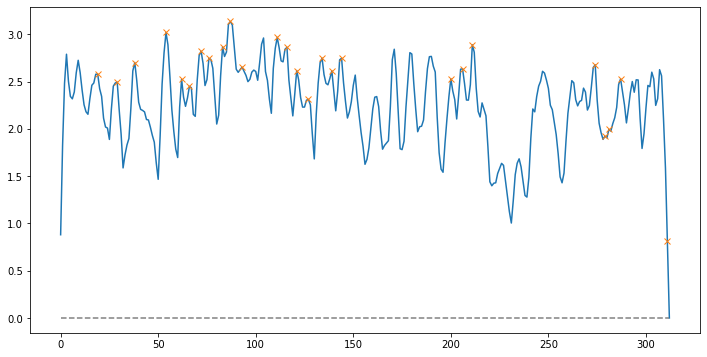

Peak count: 26
Frame text: 그간 사고나 제가 고작아니었잖습니까. 시멀레이러의 인상은 그러니까 저리된 헛, 말씀이십니까. 과오는 어떤가지금 그러자 그러시지요. 님, 공작님과 칠, 공작의 허허 썼답니다. 말이어야말이죠. 사실, 사실을 않고 단지 것이다. 

Similarity : 0.4663680970825158
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2137290984392166   similarity loss:-0.05353971943259239


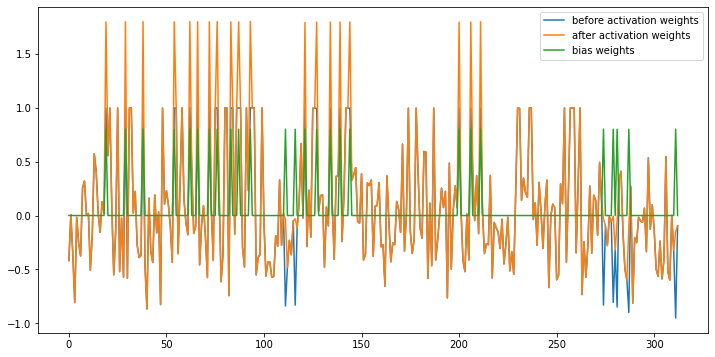

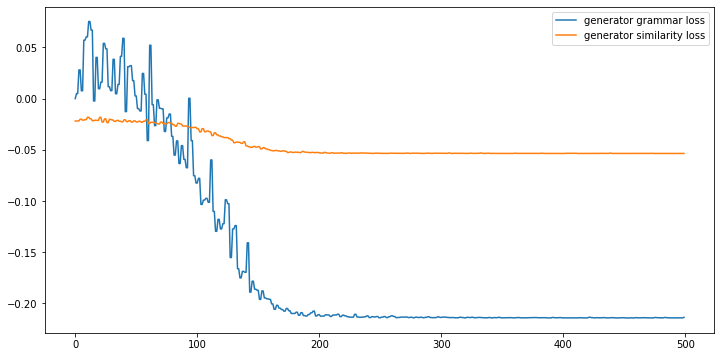

--------------------------------------------------
summary:
그간 시피아젝스가 살 사고나 공부는마다하고 여자 제가 그나마 고작아니었잖습니까. 그러니 정, 시멀레이러의 인상은 그러니까 아젝스가 저리된 내 마누라 헛, 그 지당한 말씀이십니까. 당연하지요. 그게아니지요. 과오는 잊고 다시 중요하죠. 그러시지요. 아젝스와 마, 님, 공작님과 칠, 몸좀추스려야 하겠군요. 공작의 치료에 고맙게 쥐며 허허 썼답니다. 말이어야말이죠. : 2003-02-24 본문크기 : 사람이라는 공주에게 말할 것인가 인가.
--------------------------------------------------
Num sentences: 13
Num querys: 10
Num sentences: 25
Num querys: 10
Num sentences: 5
Num querys: 10
Num sentences: 43
Num querys: 10
Num sentences: 41
[[1.11022302e-16 8.86308715e-01 5.58147099e-01 ... 9.91896953e-01
  8.10574464e-01 8.31887924e-01]
 [8.86308715e-01 2.22044605e-16 9.00404261e-01 ... 5.98441610e-01
  9.90821548e-01 7.86461583e-01]
 [5.58147099e-01 9.00404261e-01 0.00000000e+00 ... 9.12505621e-01
  8.25845764e-01 8.16168536e-01]
 ...
 [9.91896953e-01 5.98441610e-01 9.12505621e-01 ... 1.11022302e-16
  5.45013860e-01 7.59589826e-01]
 [8.10574464e-01 9.90821548e-01 8.25845764e-01 ... 5.45013860e-01
  0.00000000e+00 8.16870371e

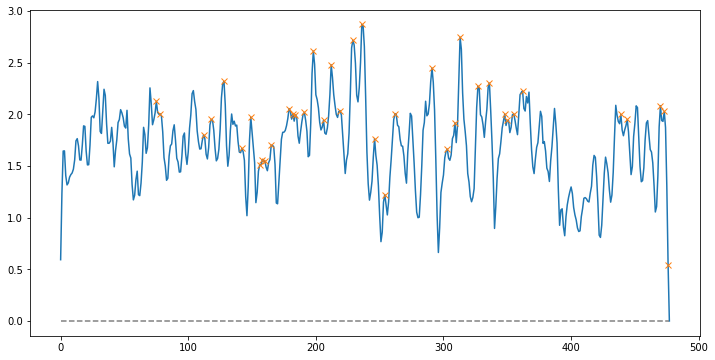

Peak count: 39
Frame text: 것이다. 가지고도 것이다. 쥐어 힘이다. 소유가 상실증에 수 것이다. 이곳보다는 많을 이득. 모르고 것이 중요한 공주는 큰 공주가 남편이라니. 정략 공주로서는 무덤까지 책들 시멀레이러였다. 미루어졌다. 말도 핑계로 항의는무의미했다. 나중에는 연습용 과거에 맞으며 보면 처사였다. 않아공작의 수십번. 연습용 몸을 해주었다. 

Similarity : 0.5077677836739259
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19357693195343018   similarity loss:-0.05828247591853142


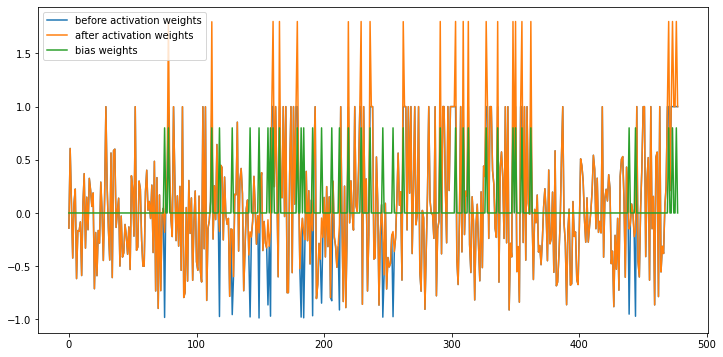

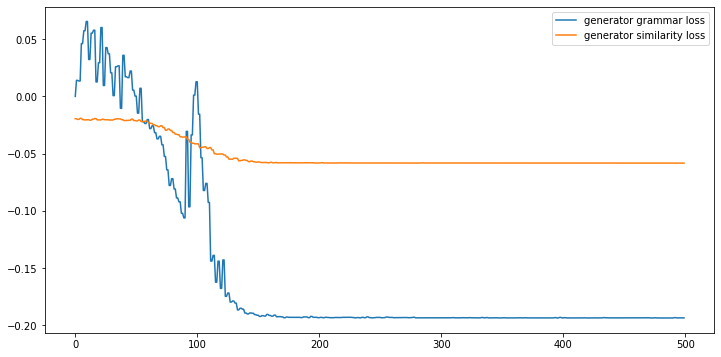

--------------------------------------------------
summary:
행위는 공주에게도 가지고도 한다. 진짜라는 잡고 그에게서상당한 것이다. 아무래도 이곳보다는 수도가 많을 치료한다는명목으로 떠나는 사병을 이끌고서. 마지막 이득. 만약 격는 남편이라니. 살아야 고통일것이다. 정략 모자라서 공주로서는 도저히견디지 못하리라. 시멀레이러였다. 아젝스가 다친지도 한 그간 오전에는 공작에게서 배우는 약혼도 미루어졌다. 약혼식을 치루고 되돌아 공주 일행은 강력히 항의를했지만, 말도 못하는 핑계로 항의는무의미했다. 나중에는 스스로 정도 뛰기까지 연습용 세로 사선 과거에 맞으며 익히다 보면 돌아올 모른다는 처사였다. 나오기도하고 위에서 마침내 나는 노력-앙리가 따르는 아젝스가 있으면 연습용 아젝스의 몸을 어루만지며 수정을 해주었다. 
--------------------------------------------------
Num sentences: 5
Num querys: 12
Num sentences: 25
Num querys: 12
Num sentences: 13
Num querys: 12
Num sentences: 43
Num querys: 12
Num sentences: 41
[[2.22044605e-16 3.68828176e-01 7.10210210e-01 ... 6.75067990e-01
  7.16970032e-01 7.97929790e-01]
 [3.68828176e-01 0.00000000e+00 6.69743936e-01 ... 6.46342090e-01
  6.34527064e-01 6.28480649e-01]
 [7.10210210e-01 6.69743936e-01 0.00000000e+00 ... 6.89200766e-01
  7.31801514e-01 7.23232104e-01]
 ...
 [6.75067990e-01 6.46342090e-01 6.89200766e-01 ... 0.00000000e+00
  5

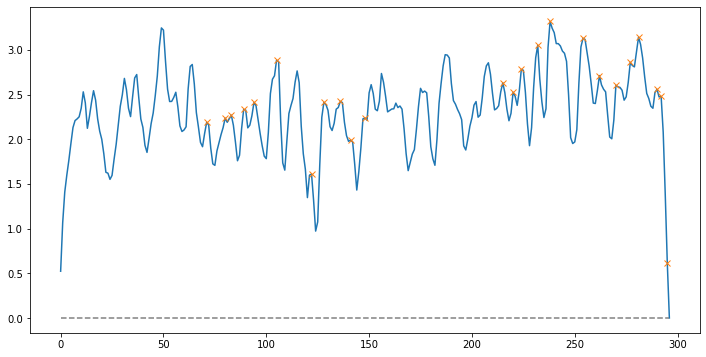

Peak count: 24
Frame text: 부진이었다. 것이다. 시작한 했다. 도저히 좀처럼 처음의 듣지도 말한 같은데 분명 끝나면이렇게 그날도 수업을 있어야지. 예전처럼 내시다니 지시겠지요. 예전엔 놈이었거든. 딴청을 의자하면 날 해요. 

Similarity : 0.5094311761400141
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1717178076505661   similarity loss:-0.06828182935714722


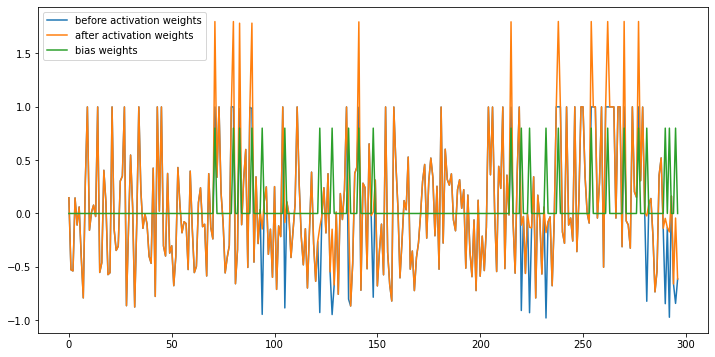

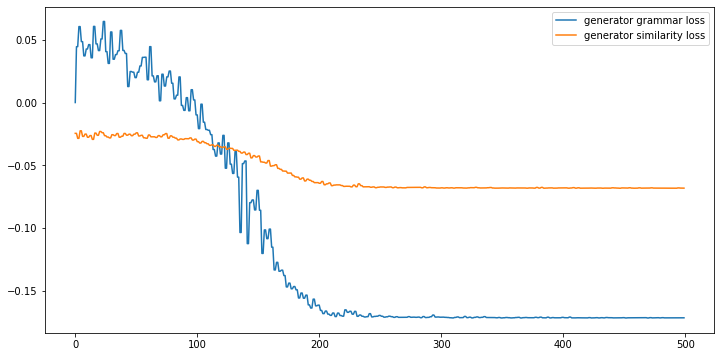

--------------------------------------------------
summary:
결과물이 롱소드의 움직임, 한 맞나 가전의 마나의 부진이었다. 잊어먹고, 망막했던 것이다. 시작한 것부터 했다. 가르치면 아젝스는 자신이 같은데 거참 연구대상이야. 처음에는 나사스를 물론지금은 생각이 끝나면이렇게 살폈다. 빠른시일내에 예전처럼 말빨로 정도로 환장할노릇일세. 이룩하신 대 내시다니 의외십니다. 좀더 보시지요. 나아 지시겠지요. 휴우, 사실 아젝스 확실히 예전하고는 예전엔 노력이란 놈이었거든. 지금
--------------------------------------------------
Num sentences: 5
Num querys: 11
Num sentences: 18
Num querys: 11
Num sentences: 10
Num querys: 11
Num sentences: 33
Num querys: 11
Num sentences: 31
[[0.00000000e+00 7.18441752e-01 8.46292924e-01 6.18745076e-01
  7.52540544e-01 7.69184772e-01 9.31160633e-01 9.44595266e-01
  6.04211264e-01 7.53112468e-01 7.60374894e-01 8.98038580e-01
  7.82749563e-01 7.60508261e-01 7.74272114e-01 7.37439814e-01
  8.87024882e-01 7.52947210e-01 8.14836046e-01 7.94427265e-01
  7.96589284e-01 8.47956445e-01 8.49904858e-01 8.68062032e-01
  7.94443213e-01 8.98421650e-01 8.60956541e-01 9.07353862e-01
  7.68913077e-01 7.54506126e-01 8.54841281e-01]
 [7.18441752e-01 1.11022302

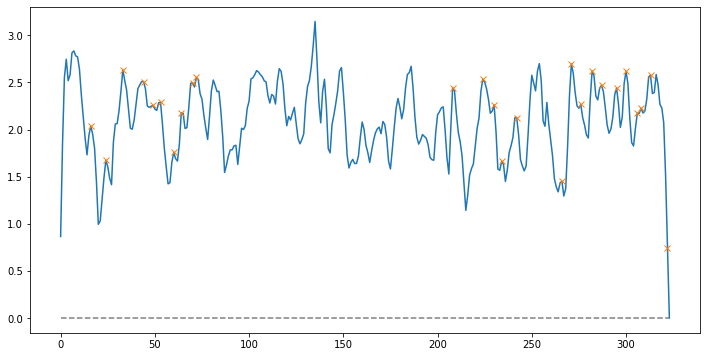

Peak count: 26
Frame text: 넘기고, 것은 하지. 있었군요. 어떨까요. 그런 거기에나오는 것이지요. 수 않겠습니까? 놀랐다. 아직보지는 마법사란다. 몬스터가 눈에보이는 다 일수였다. 능력 나사스는 다가갔다. 아젝스와 때문이다. 모두 있으므로. -여러가지 나았다. 

Similarity : 0.4500836662312556
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19064901769161224   similarity loss:-0.046521998941898346


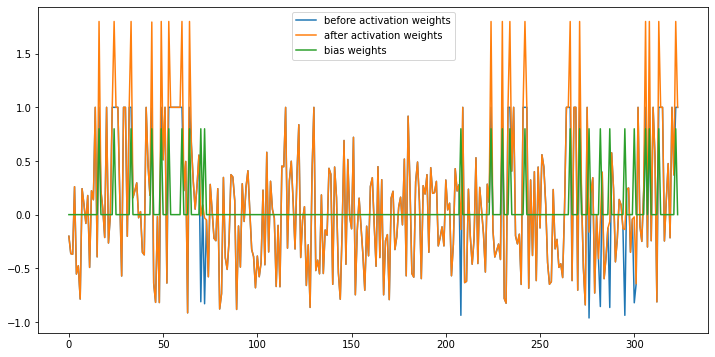

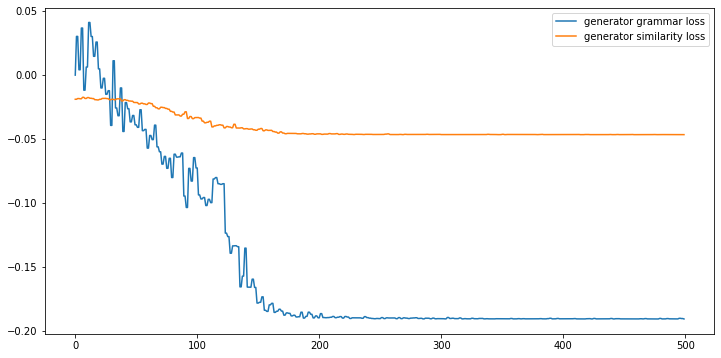

--------------------------------------------------
summary:
백개를 넘기고, 사랑이니 추상적인 것은 도저히 가르치질 어디 말이 설명이라도 하지. 허허. 있었군요. 어떨까요. 글을가르치는 그런 다음 어린애들이 좋아하는 영웅전기를 읽어 주면서 거기에나오는 것이지요. 기다려지는구나. 있었다. 보기에 아직보지는 마법사란다. 약탈부족이나 몬스터가 파이어 누빈단다. 눈에보이는 모든 그의뒤를 따르며 다 시체나 치우다 일수였다. 좋아하고 아직 모두 있으므로. 오늘은 -여러가지 물건 이름을 그나마 나았다. 
--------------------------------------------------
Num sentences: 10
Num querys: 12
Num sentences: 25
Num querys: 12
Num sentences: 10
Num querys: 12
Num sentences: 45
Num querys: 12
Num sentences: 43
[[1.11022302e-16 5.47068777e-01 1.01900466e+00 ... 5.55718917e-01
  1.01764514e+00 4.06083645e-01]
 [5.47068777e-01 2.22044605e-16 8.62178110e-01 ... 6.54650647e-01
  9.71312274e-01 6.02758575e-01]
 [1.01900466e+00 8.62178110e-01 2.22044605e-16 ... 9.47289884e-01
  6.99950344e-01 1.05567449e+00]
 ...
 [5.55718917e-01 6.54650647e-01 9.47289884e-01 ... 0.00000000e+00
  1.02000530e+00 6.95341029e-01]
 [1.01764514e+00 9.71312274e-01 6.99950344e-01 ... 1.02000530e+00
  0.00000000e+00 9.32382383e

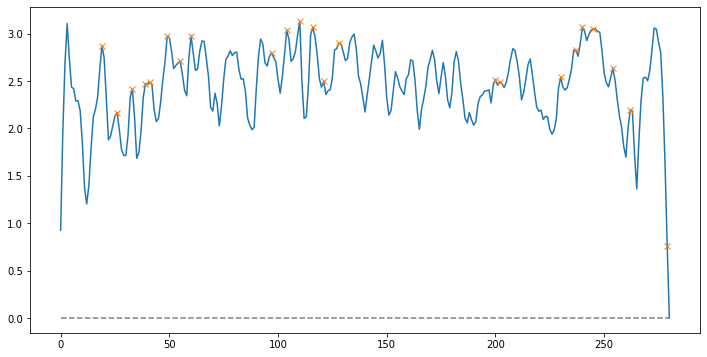

Peak count: 23
Frame text: 협력을구했다. 도움이 그러나 이야기에 한점 그러다 일상사를 어느덧 말이 말을 쓴다네. 말을 그러더니 식이었다. 끝에 혼자 완전히 이렇게 드디어 스승님. 그러나 펼쳤다. 그거야! 

Similarity : 0.511620605905543
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1845800280570984   similarity loss:-0.055187806487083435


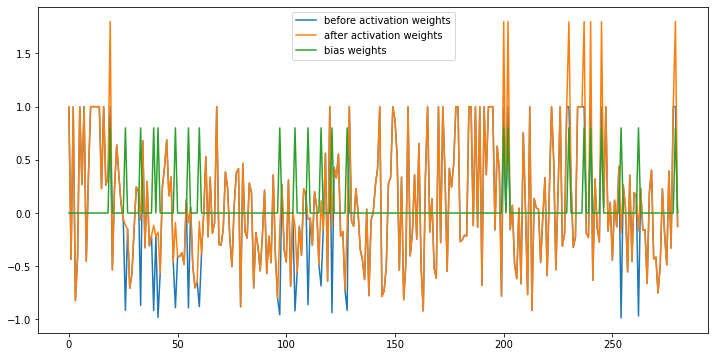

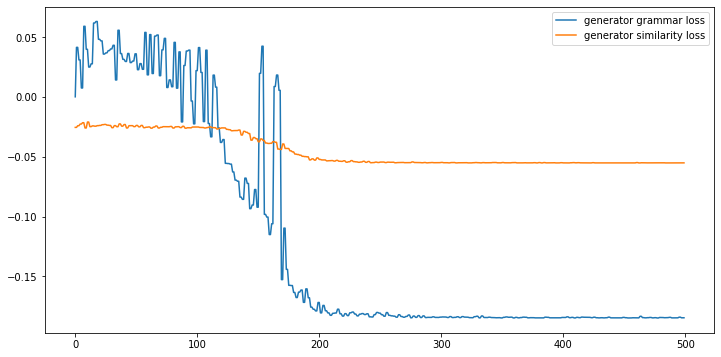

--------------------------------------------------
summary:
 아무리 없었다. 그래도 현재의 포러스제국의권력구도와 공주의 역할, 그리고 인물의 협력을구했다. 들으니 굳어졌다. 나사스가 뜨는 나사스는 시멀레이러에게 조합의 글자 의미를깨우치고 얇은 책을 의미하는 뜻을 보여 단어를 그림을 이름을 알려주는 기존의 끝에 혼자 무슨 그림으로 그림과 의미를표현했다. 완전히 즐겁게 행하는 시멀레이러였다. 이렇게 드디어 스승님. 뭐라고 바로 그거야!
--------------------------------------------------
Num sentences: 13
Num querys: 7
Num sentences: 10
Num querys: 7
Num sentences: 10
Num querys: 7
Num sentences: 33
Num querys: 7
Num sentences: 31
[[0.00000000e+00 7.21970634e-01 9.50934515e-01 6.06325199e-01
  5.26430617e-01 7.54319778e-01 5.37040461e-01 7.88052951e-01
  6.65109062e-01 7.97676308e-01 9.72794683e-01 5.83920530e-01
  7.01068947e-01 2.98900833e-01 5.24523660e-01 9.07577222e-01
  8.70266697e-01 7.35176631e-01 7.31258392e-01 5.21575785e-01
  4.33867947e-01 5.58621404e-01 4.50297029e-01 8.35023910e-01
  5.78137100e-01 6.36820317e-01 5.97173908e-01 7.70118679e-01
  6.70661472e-01 8.35023935e-01 9.45512571e-01]
 [7.21970634e-01 0.00000000e+00 5.01126945e-01 7.8

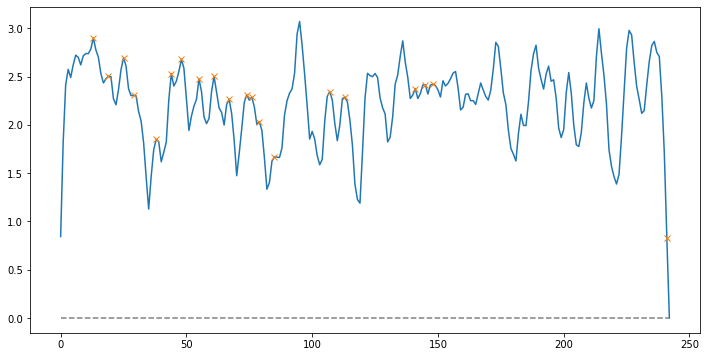

Peak count: 20
Frame text: 이야하하하하하. 전부였다. 수업이진행되었다. 시멀레이러는 더듬거리긴 이때부터 그간 시작했다. 아젝스가 따라서 가르칠 있었다. 공작보다 모습을 검이 기본을알고 소드마스터에 다만 전신의 못참아! 

Similarity : 0.531218614846711
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19276480376720428   similarity loss:-0.05339348688721657


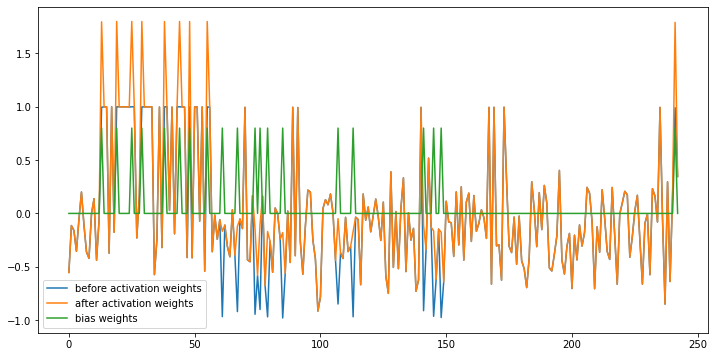

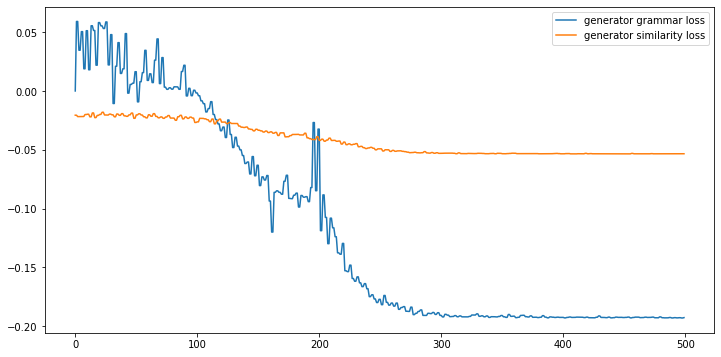

--------------------------------------------------
summary:
이야하하하하하. 그날 아젝스가 말은 전부였다. 그 말 외엔 이전과 동일하게 수업이진행되었다. 그러나 시멀레이러는 더욱더 수업에 박차를 가해 되어가는 더듬거리긴 하지만 정도 되었다. 이때부터 공작도 아젝스를 그간 별러왔던 가문의 마나운기법을 시작했다. 다행히 호흡법을 시작할 있게되었다. 몰랐다. 그에게 하루 뿐이었다. 네놈의 못참아!
--------------------------------------------------
Num sentences: 10
Num querys: 9
Num sentences: 20
Num querys: 9
Num sentences: 5
Num querys: 9
Num sentences: 35
Num querys: 9
Num sentences: 33
[[0.00000000e+00 7.23805648e-01 6.07750294e-01 ... 9.40260729e-01
  8.50877960e-01 4.79389482e-01]
 [7.23805648e-01 2.22044605e-16 3.76689090e-01 ... 8.45078193e-01
  7.57729516e-01 8.23950717e-01]
 [6.07750294e-01 3.76689090e-01 0.00000000e+00 ... 8.92320988e-01
  6.30522351e-01 7.40600500e-01]
 ...
 [9.40260729e-01 8.45078193e-01 8.92320988e-01 ... 1.11022302e-16
  5.92401150e-01 9.02325954e-01]
 [8.50877960e-01 7.57729516e-01 6.30522351e-01 ... 5.92401150e-01
  0.00000000e+00 6.78379523e-01]
 [4.79389482e-01 8.23950717e-01 7.40600500e-01 ... 9.0232

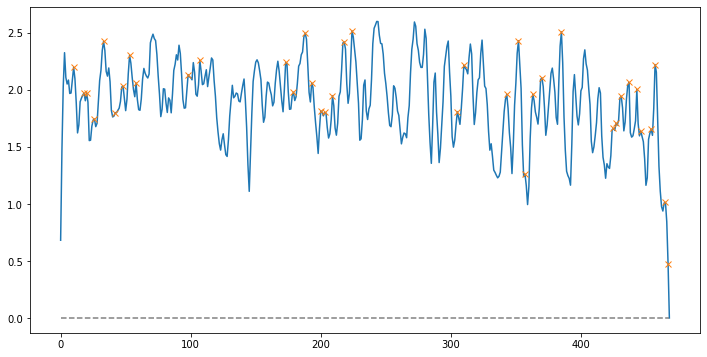

Peak count: 38
Frame text: 발작 시무룩해진 아젝스가 다시 이상해. 재능이 이이. 도련님 열혈 그러나 없잖아? 모르지? 가더니 해. 말야. 날카로운 한스의잡담과 있었다. 의미에서 아젝스가 예전의 서로 땅에서는 다툼이 이들이 세상에서 터전으로 말았습니다. 위협을견디며 자신들의 풍요로운 내쫓겨 허덕였습니다. 얻기 언제나 부족했지요. 기아에서 해주셨습니다. 

Similarity : 0.5057032452644625
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.17073586583137512   similarity loss:-0.05112941935658455


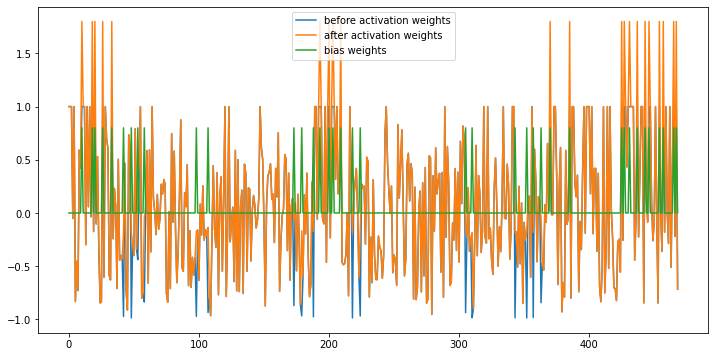

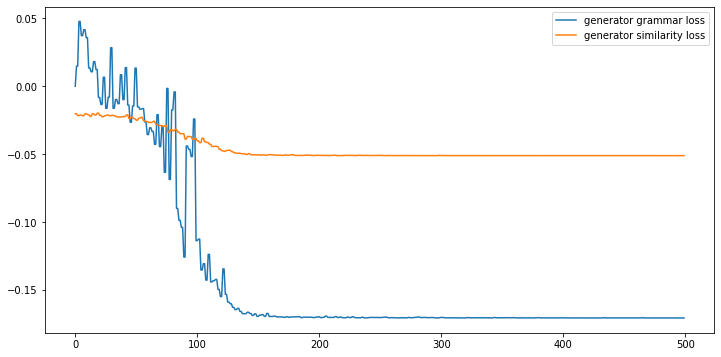

--------------------------------------------------
summary:
 시끄럽다. 거기서 당장 발작 하려던 한스는 내릴 밖에 시무룩해진 아젝스가 다시 했다. 이상해. 말이야. 하지만 못하는 말 저리되셨으니 마치 딴 같단 말야. 그날 아젝스의 나오는 날카로운 앙리와 한스의잡담과 공작의 눈빛속에 있었다. 배웠다. 여간 따뜻한 만드신 생명체를 보살피게 육지를책임지게 됩니다. 쫓는 터전으로 바다를 택했고, 말았습니다. 엘프는 드래곤의 힘이미약했던 처음 드래곤의 억압에 평야로 산속으로 그들은 보호막, 위협을견디며 자신들의 터전을 됩니다. 풍요로운 산과 들에서 살다 내쫓겨 부족해진 인간과오크는 허덕였습니다. 얻기 위해 들에 언제나 부족했지요. 가이아 오크에게 기아에서 해주셨습니다.
--------------------------------------------------
Num sentences: 13
Num querys: 13
Num sentences: 25
Num querys: 13
Num sentences: 10
Num querys: 13
Num sentences: 48
Num querys: 13
Num sentences: 46
[[0.00000000e+00 7.61012076e-01 8.39537124e-01 ... 9.72669431e-01
  1.02668143e+00 1.07664062e+00]
 [7.61012076e-01 0.00000000e+00 6.43126501e-01 ... 8.45047007e-01
  9.34146116e-01 1.03048414e+00]
 [8.39537124e-01 6.43126501e-01 2.22044605e-16 ... 6.15557376e-01
  7.58527570e-01 8.52245660e-01]
 ...
 [9.72669431e-01 8.45047007e-01 6.15557376e-01 ... 1.11022302e-16
  3.18056645e-01 6.68287225e-0

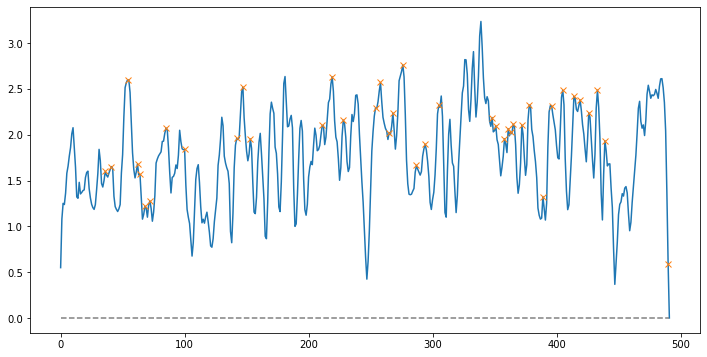

Peak count: 40
Frame text: 없었을 얻는 그러다 오크는 포기하고 것으로 했습니다. 오크에게 아젝스는 드래곤 쫓아내게 찬양하며 그러면서 갈등이유발되면서 프로미어와 갔으나 권력욕에 결국 황가는 이를 추격에 황가는 침공에 동쪽의군세를 아라사 지나치며 승리에 아라사의 막상가나트의 군율도 탓에 가나트 산맥을 아라사 황실의권위와 귀족세력이 지방 궁여지책인 버립니다. 해봐라. 

Similarity : 0.5121406001090405
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.17541280388832092   similarity loss:-0.055337753146886826


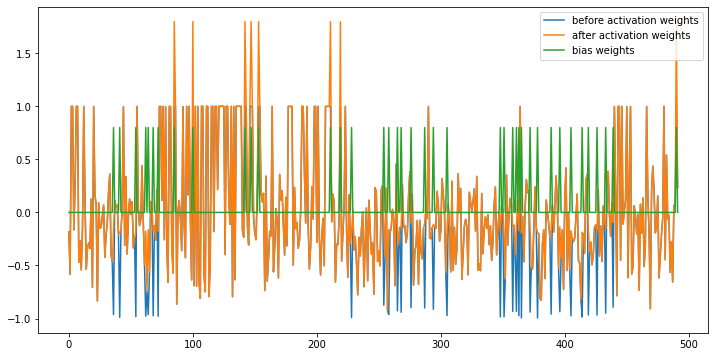

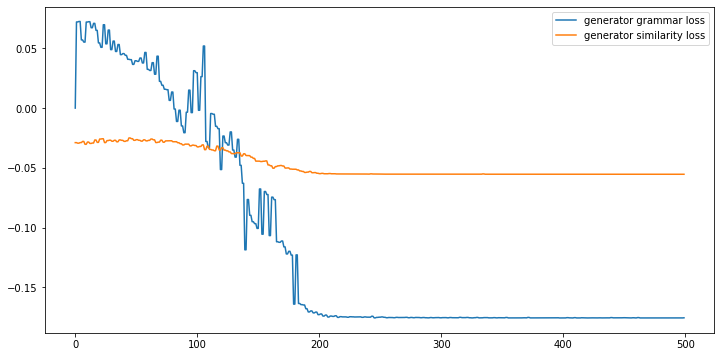

--------------------------------------------------
summary:
벗어난 인간은 찬양하였습니다. 이때부터 칭해지고 됩니다. 자손을먹이는 힘든 결국 인간과 종족간 벌어지고 오크의상대가 안되는 오크에게 밀리게 됩니다. 때, 대영웅이 아젝스는 칼을쥐고 손으로는 손을 잡고 나갔습니다. 그의손을 손은 다른 잡고, 그사람은 다른 사람의 손을 잡아 모든인류가 되게 하여 뛰어난 오크가 못한손재주로 수많은 무기로 장비한 인간은 드래곤 산맥과 산맥너머로 쫓아내게 됩니다. 찬양하며 그의밑으로 그간 북으로 센 사막에 이르는거대한 길을 걷습니다. 계급이 있다는 것을알게 귀족의 동으로 동으로 퍼져 나가게됩니다. 그러면서 갈등이유발되면서 시작합니다. 이렇게 침공군은 오늘날 모두 잊어 단지 겨우 잘 있냐?너무 대 해봐라.
--------------------------------------------------
Num sentences: 10
Num querys: 9
Num sentences: 20
Num querys: 9
Num sentences: 8
Num querys: 9
Num sentences: 38
Num querys: 9
Num sentences: 36
[[2.22044605e-16 7.23032937e-01 7.98569388e-01 ... 7.13361262e-01
  8.63309783e-01 9.46506089e-01]
 [7.23032937e-01 0.00000000e+00 7.62136519e-01 ... 6.88077394e-01
  7.27889322e-01 7.19783916e-01]
 [7.98569388e-01 7.62136519e-01 0.00000000e+00 ... 9.77421568e-01
  9.59568479e-01 1.06459442e+00]
 ...
 [7.13361262e-01 6.88077394e-01 9.77421568e-01 ... 0.00000000e+00
  4.27935925e-01 7.2

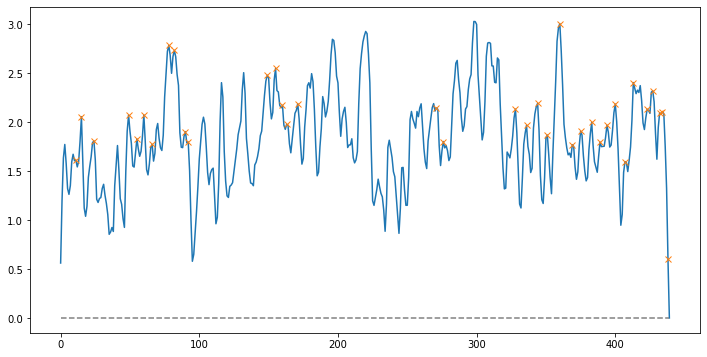

Peak count: 36
Frame text: 이런 아프지. 제국간 도모할 생길만 싹을잘랐다. 년을 전쟁으로 대아라사의 황가는 땅에서도 농노로 세력을 황족간에 살을 황가 제국의 낙옆처럼 전쟁 메우더니 찢을 엘프의 못하고 그간 만들었다. 살아온사람들도 않은 끼어든 비극이 하지만 드래곤이었다. 결국, 잃은 세월 인내와 된다. 

Similarity : 0.5520462755432973
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.18528254330158234   similarity loss:-0.05941055342555046


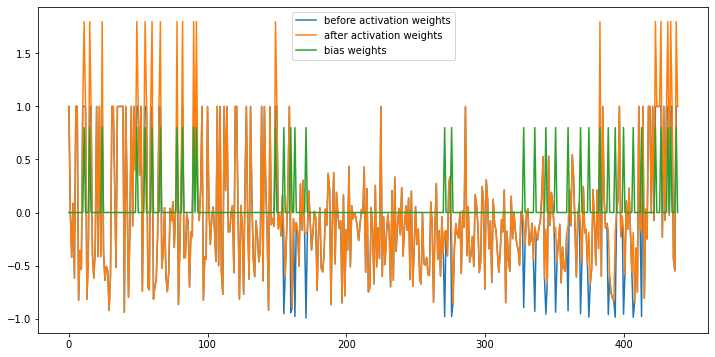

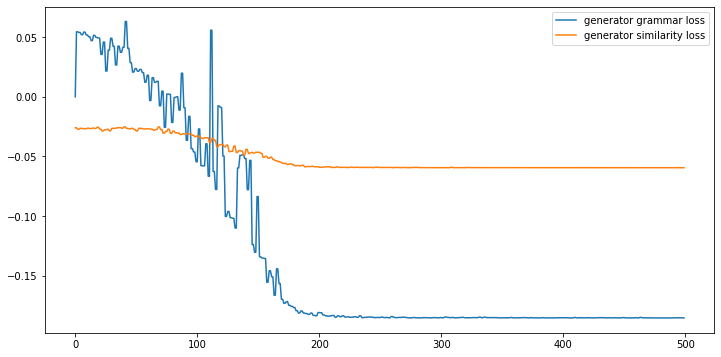

--------------------------------------------------
summary:
 네가 그러고도 말자. 이런 목석 아프지. 그래 만 탄생과 제국간 세력 분포는 2약으로 대별된다. 3강은가나트, 남부연방, 포러스의 세력이 다른 세력을 도모할 힘은 아니, 생길만 하면 그 싹을잘랐다. 200여 년을 전쟁으로 대아라사의 황가는 땅에서도 살고 그들은 수렵을 이루고 먼저 정착한 생활하거나 한지역을 미개 부리며 수하로 된다. 출신만이 농노로 부렸다. 포러스 용병이라는 마지막 살아온사람들도 되었다. 드래곤이기에 일에는 그래서 전쟁에 끼어들 생각지도 결국, 허망하게 20만 이라는대군을 잃은 이후 긴 세월 인내와 눈물로 된다. 
--------------------------------------------------
Num sentences: 13
Num querys: 8
Num sentences: 20
Num querys: 8
Num sentences: 10
Num querys: 8
Num sentences: 43
Num querys: 8
Num sentences: 41
[[0.         0.84248017 0.55564035 ... 0.71668415 0.66408686 0.76880389]
 [0.84248017 0.         0.70400098 ... 1.03509874 1.0933465  0.97600451]
 [0.55564035 0.70400098 0.         ... 0.74643117 0.85937072 0.87137162]
 ...
 [0.71668415 1.03509874 0.74643117 ... 0.         0.34648399 0.7283788 ]
 [0.66408686 1.0933465  0.85937072 ... 0.34648399 0.         0.77583039]
 [0.76880389 0.97600451 0.87137162 ... 0.7283788  0.77583039 0.        ]

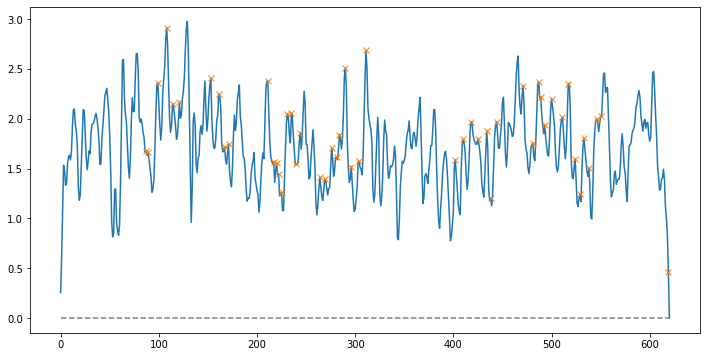

Peak count: 50
Frame text: 쌓아 방비하는 세를키웠다. 가나트의 몬스터들이 가나트는 강압해도 포러스의 부족의 귀족의 치루며 원주민의 출신의 의식은 이에 성공한 하며가나트의 되었다. 전쟁에서의 이들이 인구수에서 이루어졌기때문입니다. 인류의 곳이므로 포러스는 축적했다. 무지한 귀족들은 자신의 엘프없이 마에스타의 시작했다. 차츰 되었고, 차츰 마법사나검사들이었다. 검술을 가나트나 힘은 문제였다. 시조인 차츰 살면서 북쪽의 세 일가가 부족에게 다리안 넘어온 곳이었다. 

Similarity : 0.5276394068619088
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.12642411887645721   similarity loss:-0.06234625726938248


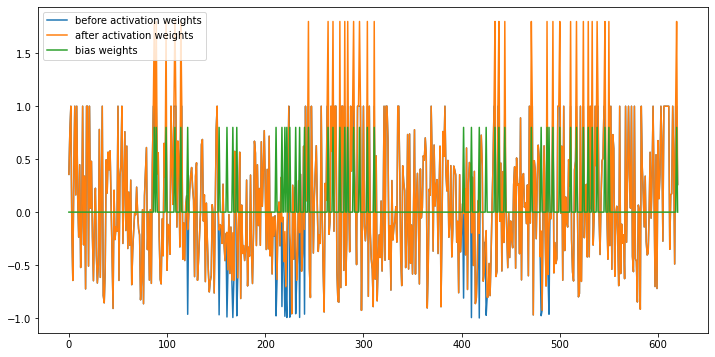

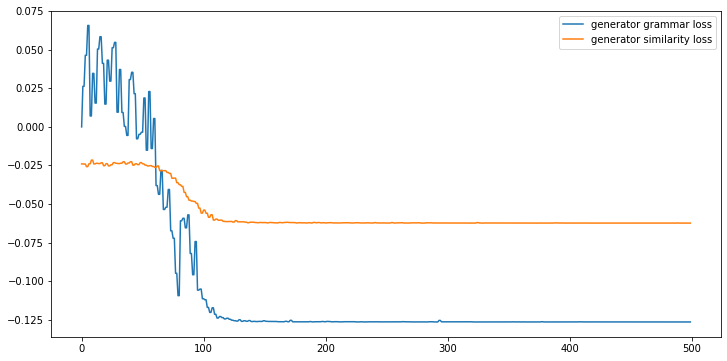

--------------------------------------------------
summary:
연방은 시기에 가나트의 각 막기 위해 지역에서 막을 재편성되며 카약, 성벽을 쌓아 방비하는 세를키웠다. 포러스는 이는잦은 가나트의 침공과 몬스터들이 원인이었다. 포러스 되었다. 때마침 전쟁에서의 된 아젝스. 봐라. 이들이 수 인구수에서 나라와 비교가 이루어졌기때문입니다. 남부 연맹이야 인류의 곳이므로 하지. 가나트와 포러스는 수많은인구와 부를 축적했다. 아마 이 무지한 반체제인사라고 귀족들은 그러나 영향을받아 왕도 대해 설명하마. 겨우 있고, 이들이 차츰 형성하게 되었고, 차츰 대부분의 마법사나검사들이었다. 특출난 가나트나 문제였다. 틸라크 영지의 시조인 의해세상에 차츰 살면서 드베리아 북쪽의 세 대 일가가 이 부족에게 복속되지 되었는데, 다리안 넘어온 마침 세력이 휴노이는 서쪽에서 하나로 결국 약화된 휴노이의 전쟁은 틸라크의 출현으로 휴노이의승리로 막을 내리게 된다. 사막부족의 보충을위한 곳이었다.
--------------------------------------------------
Num sentences: 10
Num querys: 13
Num sentences: 25
Num querys: 13
Num sentences: 10
Num querys: 13
Num sentences: 45
Num querys: 13
Num sentences: 43
[[0.00000000e+00 9.49046533e-01 7.76020942e-01 ... 8.14161285e-01
  7.70795154e-01 7.62422744e-01]
 [9.49046533e-01 0.00000000e+00 6.53205970e-01 ... 6.97117435e-01
  5.46200969e-01 8.34545309e-01]
 [7.76020942e-01 6.53205970e-01 0.00000000e+00 ... 6.22478106e-01
  6.63887116e-01 7.03

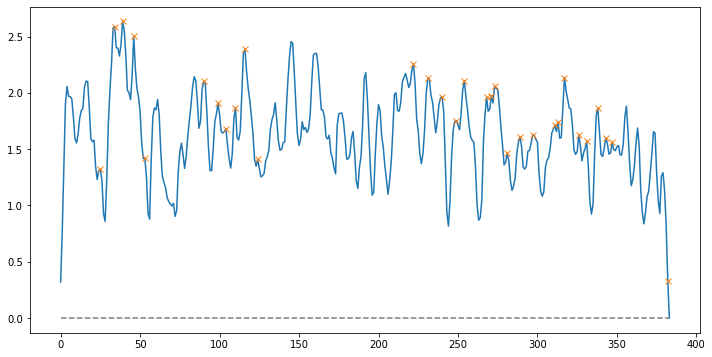

Peak count: 31
Frame text: 번쩍이는창검과 항거할 사막부족과 질리기도 되었다. 다리안과 묵살됐다. 계속 마찬가지로운씨와 전쟁으로 보존함과 적은 강한 못하고 센 대부분이 사막을 이때필요한 용병들이었다. 역할까지 것이다. 때문에 나라였다. 골고리아가 못했을것이다. 사막의 되고 제국에서 그러다 영지로 되었다. 

Similarity : 0.5176486329131742
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.17751102149486542   similarity loss:-0.058614179491996765


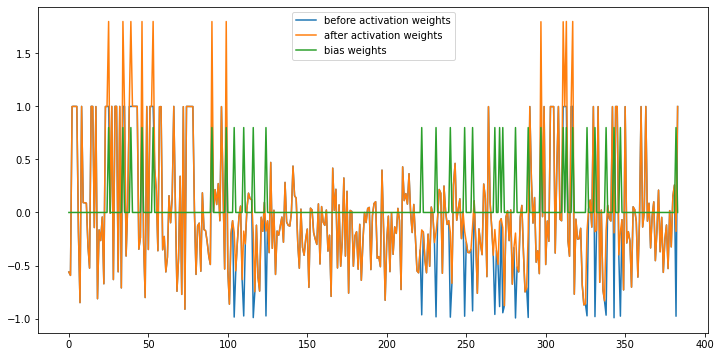

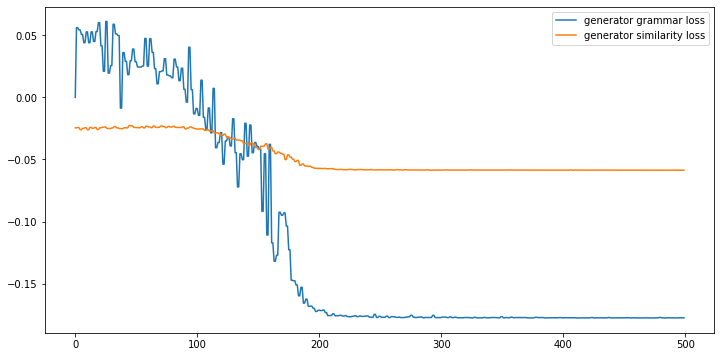

--------------------------------------------------
summary:
그곳을 다리안이 차지하자 더 못하게 되었다. 덕분에 틸라크는휴노이의 줄 알았다. 번쩍이는창검과 그리고 듣도 못한 능력은 항거할 수 수십년간 사막부족과 싸우느라 힘도 없었고 사막부족을 질리기도 손쉽게 지역을 차지하게 되었다. 쭉 장난치듯 이는 10분지 해당하는것이었다. 휴노이는 눈물을 머금고 다리안과의 다리안과 것을 묵살됐다. 드워프의 센 때문에 상인과 수도이자 항구인 골고리아에서 아니었다면유지될 나라였다. 하기사 골고리아가 생겨나지도 못했을것이다. 내게 계기로 된다. 아라사의 쇠락이시작되자 휴고 피레나로 독립하는데성공한다. 
--------------------------------------------------
Num sentences: 13
Num querys: 9
Num sentences: 10
Num querys: 9
Num sentences: 5
Num querys: 9
Num sentences: 28
Num querys: 9
Num sentences: 26
[[0.00000000e+00 7.24577764e-01 8.47190248e-01 2.21501272e-01
  8.59731543e-01 7.76804486e-01 9.22220914e-01 6.07736608e-01
  6.05713195e-01 4.31730454e-01 5.87109688e-01 5.62178468e-01
  3.48404316e-01 6.86084577e-01 7.41030418e-01 9.41646626e-01
  9.04834937e-01 6.28255396e-01 9.07438880e-01 8.45695272e-01
  7.03577571e-01 6.02926482e-01 9.15304210e-01 7.07897490e-01
  6.35034584e-01 7.37157861e-01]
 [7.24577764e-01 0.00000000e+00 6.82352580

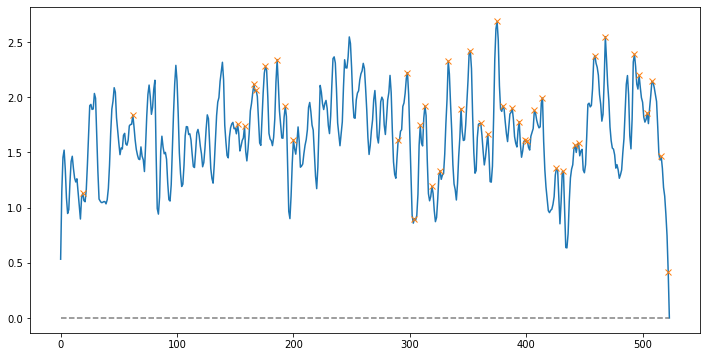

Peak count: 42
Frame text: 위해 그들의힘의 헤모스의 바다에서 위해매년 지냈다. 헤모스의은혜로 먼바다로 몸을 헤모스의 아라사와 없이 달라진 아라사의 해안 것이다. 리미트 연안에서만 힘든 모두 너머의 아니었다. 의외로 실종된 바다를 때문이었다. 되어 대륙과의 해상왕국으로 있었기에 된 지리적 겨우 사람살기 바다한가운데 하기가곤란하다. 게다가 건드릴필요도 여러번 못했어. 올 걸리거든. 

Similarity : 0.4772251456898593
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19753482937812805   similarity loss:-0.06988383829593658


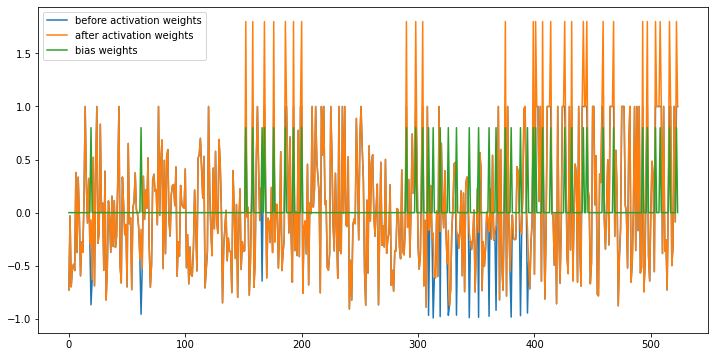

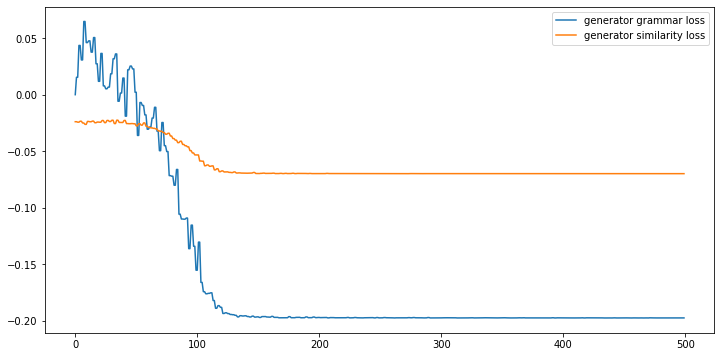

--------------------------------------------------
summary:
각 되었다. 출신이었던 용병이었지만 왕국은 헤모스의 바다에서 그들을 지냈다. 헤모스의은혜로 먼바다로 항해할 몸을 그리고 헤모스의 것이다. 바탕으로 이르렀다. 다른 제국은 그들은 아무래도 아라사이므로 한 아라사와 없이 달라진 전이다. 들어온 헤모시아였던 의외로 포용했다. 헤모스의 되어 대륙과의 관계가 원만해 해상교역을함으로써 해상왕국으로 쫓아오지 못할항해술과 조선술이 있었기에 제 지위를 누리게 된 된 지리적 있다. 시기도 겨우 200년이 안된데다 사람살기 유동적인 용병과 헤모시아는 바다한가운데 그 영향력을 행사 하기가곤란하다. 이들이 아직도 살아 지리적 센왕국은 여타제국의 보자면 게다가 건드릴필요도 여러번 헤모시아를건드렸지만 아무도 성공하지 못했어. 그들의 너무도 올 땐 두배가 걸리거든. 
--------------------------------------------------
Num sentences: 13
Num querys: 10
Num sentences: 25
Num querys: 10
Num sentences: 8
Num querys: 10
Num sentences: 46
Num querys: 10
Num sentences: 44
[[2.22044605e-16 5.81026858e-01 5.78044173e-01 ... 8.46506310e-01
  7.62586771e-01 6.89887633e-01]
 [5.81026858e-01 0.00000000e+00 2.47296967e-01 ... 9.07965552e-01
  6.02099145e-01 6.44565981e-01]
 [5.78044173e-01 2.47296967e-01 0.00000000e+00 ... 1.01097135e+00
  4.45882810e-01 5.78395206e-01]
 ...
 [8.46506310e-01 9.07965552e-01 1.01097135e+00 .

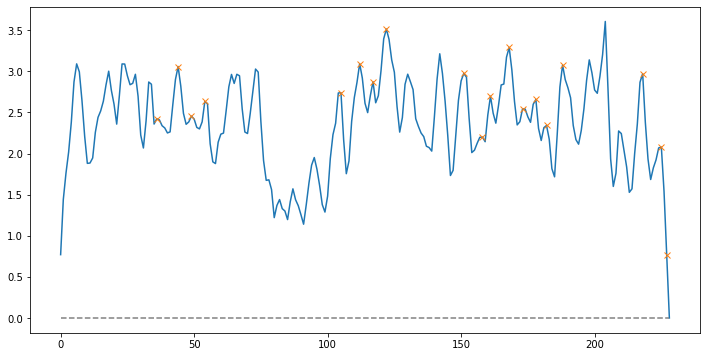

Peak count: 19
Frame text: 놈. 투덜거렸다. 쪽으로 아니었다. 후후, 언젠데. 가고 수련아. 내꺼야,알았어? 은근히 뒷골이당겨온다. 그러나 더한다. 언제인지모르게 있고 그리고 하지만 이상 않아. 

Similarity : 0.48511351292521454
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1929980367422104   similarity loss:-0.0527823269367218


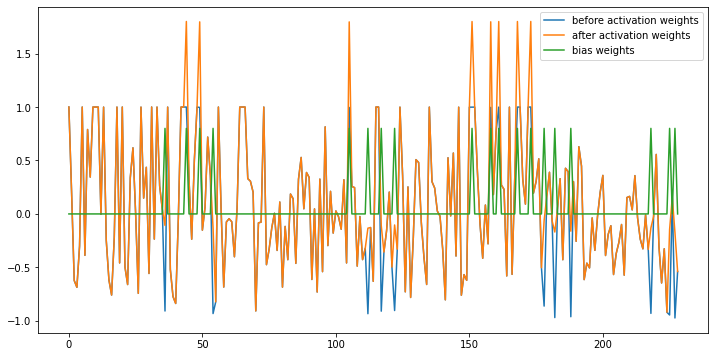

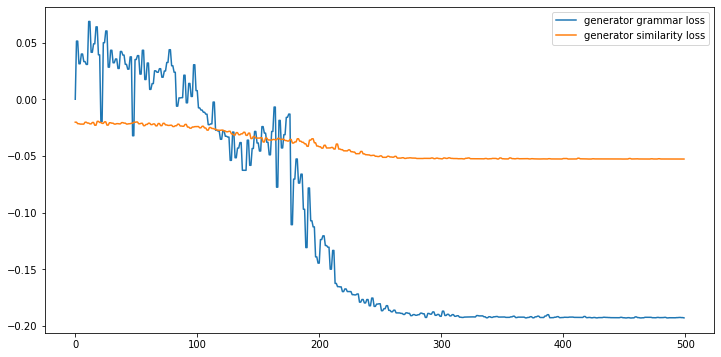

--------------------------------------------------
summary:
 실패를거듭했지. 아무 말 없이 덮었다. 고개를 꾸벅하더니 좀 가르치는데 고개나까닥이고. 시멀레이러는 안타까운지 연신 투덜거렸다. 좋은 쪽으로 죽은자의 후, 언젠간 나아지겠지. 못하게. 후후, 이곳이 편해. 너 여기서 은아에게 은아는 내꺼야,알았어? 그러면서 은근히 뒷골이당겨온다. 그 그러나 오히려 힘을 더한다.
--------------------------------------------------
Num sentences: 13
Num querys: 10
Num sentences: 25
Num querys: 10
Num sentences: 8
Num querys: 10
Num sentences: 46
Num querys: 10
Num sentences: 44
[[0.00000000e+00 9.34695565e-01 7.84626967e-01 ... 8.77688048e-01
  7.03284194e-01 6.10100978e-01]
 [9.34695565e-01 0.00000000e+00 9.17260769e-01 ... 7.85153300e-01
  9.33817075e-01 1.01028971e+00]
 [7.84626967e-01 9.17260769e-01 0.00000000e+00 ... 9.30916191e-01
  8.65192760e-01 7.62628702e-01]
 ...
 [8.77688048e-01 7.85153300e-01 9.30916191e-01 ... 0.00000000e+00
  4.88237450e-01 5.72376494e-01]
 [7.03284194e-01 9.33817075e-01 8.65192760e-01 ... 4.88237450e-01
  2.22044605e-16 2.74823527e-01]
 [6.10100978e-01 1.01028971e+00 7.62628702e-01 ... 5.72376494e-0

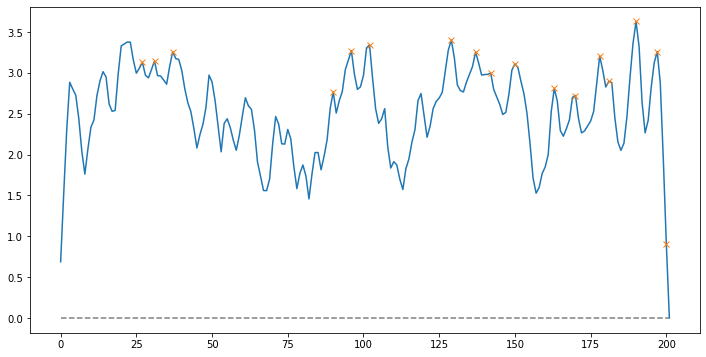

Peak count: 17
Frame text: 난 난 내가 언제나 것이다. 족했다. 한다. 했는데. 그래, 아젝스! 공작은몹시도 그 예. 되었습니까? 몰랐더냐? 아젝스! 되었구나. 

Similarity : 0.5412809282337123
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20228098332881927   similarity loss:-0.06158674135804176


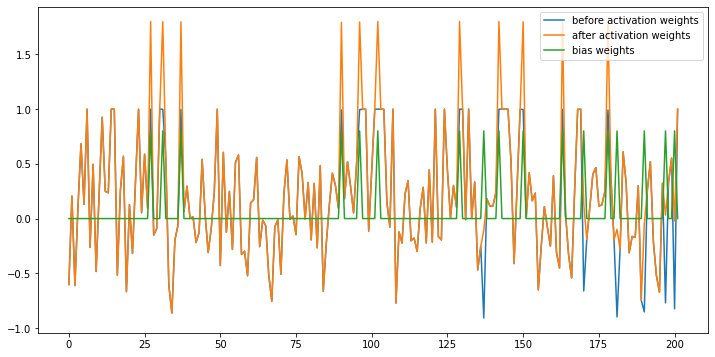

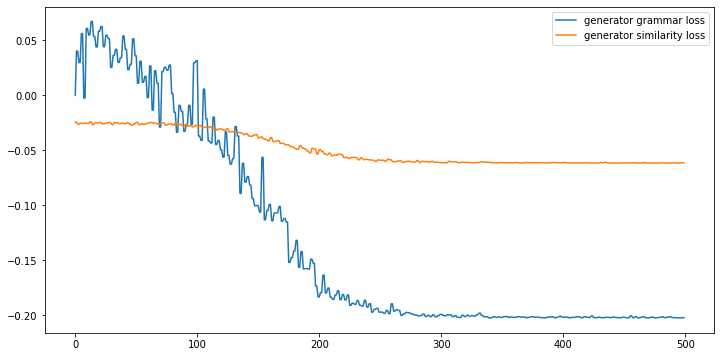

--------------------------------------------------
summary:
누구처럼 지켜주었어. 누구처럼 난 난 좋아. 난 내가 원동력이었다. 언제나 것이다. 혼원일기공에 집중하면 그것으로 족했다. 그 다음엔 현재 세포 섬세하게 한다. 왜인지는 모르겠다. 그래, 내 이름이다. 여기서 아젝스, 아젝스! 공작은몹시도 보고 있었다. 예. 
--------------------------------------------------
Num sentences: 8
Num querys: 11
Num sentences: 20
Num querys: 11
Num sentences: 10
Num querys: 11
Num sentences: 38
Num querys: 11
Num sentences: 36
[[0.00000000e+00 8.79722632e-01 7.32266322e-01 ... 9.77103277e-01
  8.39269011e-01 8.77003992e-01]
 [8.79722632e-01 0.00000000e+00 5.60060874e-01 ... 8.88860903e-01
  9.09493524e-01 9.95356419e-01]
 [7.32266322e-01 5.60060874e-01 0.00000000e+00 ... 8.04244627e-01
  7.89839753e-01 8.40264984e-01]
 ...
 [9.77103277e-01 8.88860903e-01 8.04244627e-01 ... 0.00000000e+00
  6.85985402e-01 4.71178529e-01]
 [8.39269011e-01 9.09493524e-01 7.89839753e-01 ... 6.85985402e-01
  0.00000000e+00 4.58364406e-01]
 [8.77003992e-01 9.95356419e-01 8.40264984e-01 ... 4.71178529e-01
  4.58364406e-01 1.11022302e

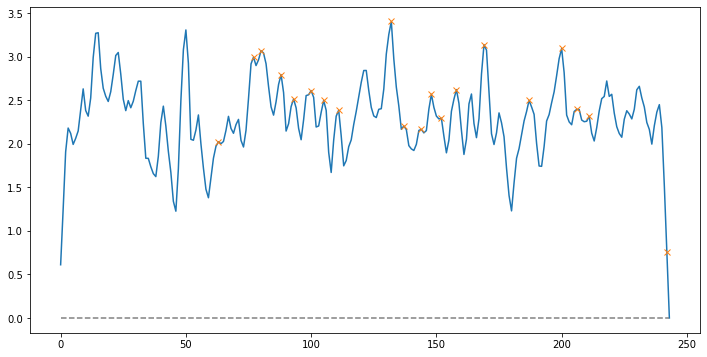

Peak count: 20
Frame text: 듯 보았느냐?드디어 소드익스퍼터! 알았겠느냐? 경지에 한다. 마스터를 공작의 검술의 상급, 즉 이르면 또다시 마스터의 설명으로는오러 공격이자 이루다니. 났다. 가능하리라. 대연. 

Similarity : 0.5537387738457804
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.15510644018650055   similarity loss:-0.05726593732833862


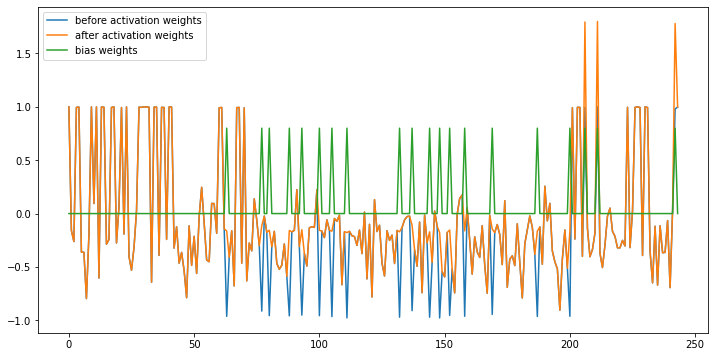

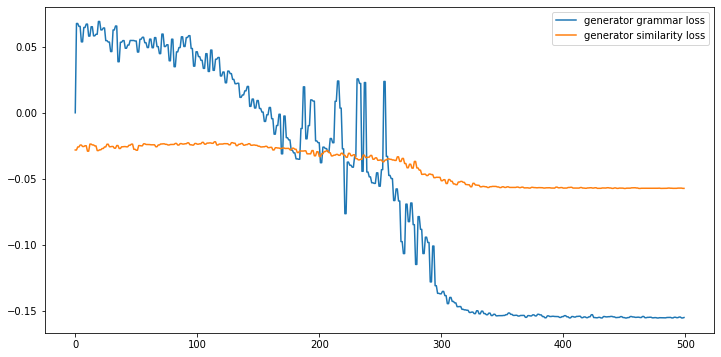

--------------------------------------------------
summary:
 그러나 아젝스는 다시 검을 보아라. 이번에는 살펴서. 물론 펼쳐야 아젝스는 검술을 펼쳤다. 힘차게 휘둘러진 롱소드는어느새 가르키고 있었고, 대지와 수평으로 그리고 그정점. 마치 아직도남아 빛나던 검이 있었다. 아젝스, 한 대연은 났다. 가능하리라. 항상 그것을. 순간, 아젝스는 속에서깨어났다. 내게 대연. 
--------------------------------------------------
Num sentences: 13
Num querys: 10
Num sentences: 18
Num querys: 10
Num sentences: 5
Num querys: 10
Num sentences: 36
Num querys: 10
Num sentences: 34
[[1.11022302e-16 8.70627507e-01 8.56838832e-01 ... 6.13117882e-01
  7.19705833e-01 6.54396612e-01]
 [8.70627507e-01 0.00000000e+00 3.31219126e-01 ... 7.43790979e-01
  8.40425775e-01 9.12721451e-01]
 [8.56838832e-01 3.31219126e-01 0.00000000e+00 ... 8.08355855e-01
  8.90132250e-01 8.66787325e-01]
 ...
 [6.13117882e-01 7.43790979e-01 8.08355855e-01 ... 0.00000000e+00
  3.84694044e-01 9.29667749e-01]
 [7.19705833e-01 8.40425775e-01 8.90132250e-01 ... 3.84694044e-01
  2.22044605e-16 9.25526562e-01]
 [6.54396612e-01 9.12721451e-01 8.66787325e-01 ... 9.29667749e-01


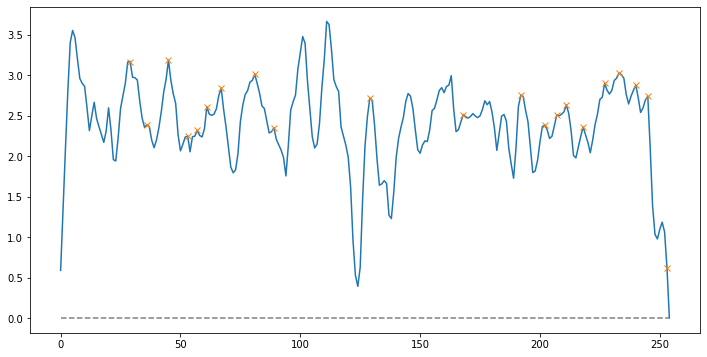

Peak count: 21
Frame text: 아젝스가 하다가 공작님. 제가 설 경직, 미친 아닌 네놈 기가 뛰어 물론 공작가도마찬가지로 그러나 어떤증상과도 수 정이 정신이 달려갔다. 빌어멱을 것이아닌가. 

Similarity : 0.5397364805256228
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.12538233399391174   similarity loss:-0.06029512360692024


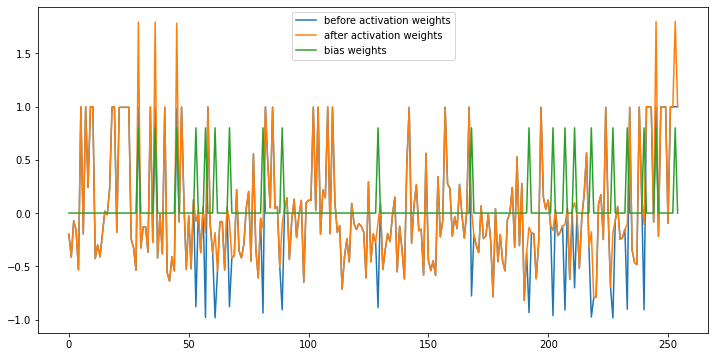

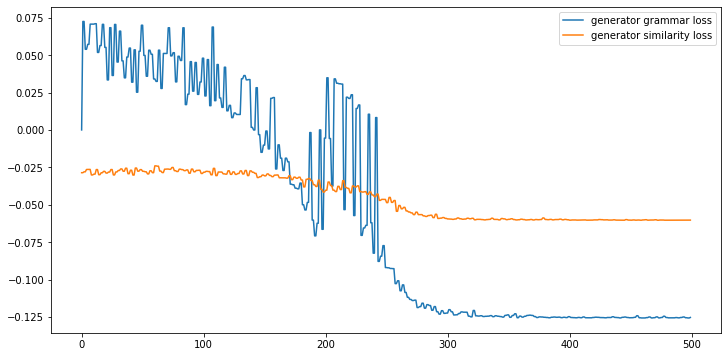

--------------------------------------------------
summary:
아젝스는 키득거리며 시작했다. 그러더니 향해 걸어갔다. 한스 등은 처음엔흥분된 마음으로 아젝스의 아젝스가 되찾았다고 하다가 방으로 공작님. 저런 때에 상태에서소드익스퍼터에 다를테지. 공작님, 했어요. 주세요. 앙리. 싶어 아무래도 경지를 토대로 아젝스에게 나간다면정말 아젝스의 그런데 노심초사하며달려와 보니 빌어멱을 한가하게 차나 마시며 감상하고 있는 것이아닌가. 
--------------------------------------------------
Num sentences: 8
Num querys: 8
Num sentences: 15
Num querys: 8
Num sentences: 5
Num querys: 8
Num sentences: 28
Num querys: 8
Num sentences: 26
[[0.00000000e+00 5.07321913e-01 7.62307259e-01 6.47428471e-01
  6.74927107e-01 7.27515949e-01 6.47224441e-01 5.80389825e-01
  7.04393795e-01 7.98456255e-01 7.07582707e-01 6.85565001e-01
  7.24976139e-01 6.50393000e-01 6.69516042e-01 6.06501254e-01
  8.13105457e-01 6.84243248e-01 5.62044639e-01 5.40954305e-01
  7.12563269e-01 8.09705980e-01 8.03058254e-01 8.07104297e-01
  4.89336353e-01 7.35679239e-01]
 [5.07321913e-01 0.00000000e+00 5.76641222e-01 2.55722845e-01
  7.62535055e-01 8.43419528e-01 5.49077487e-01 6.48152547e-01
  7.8629390

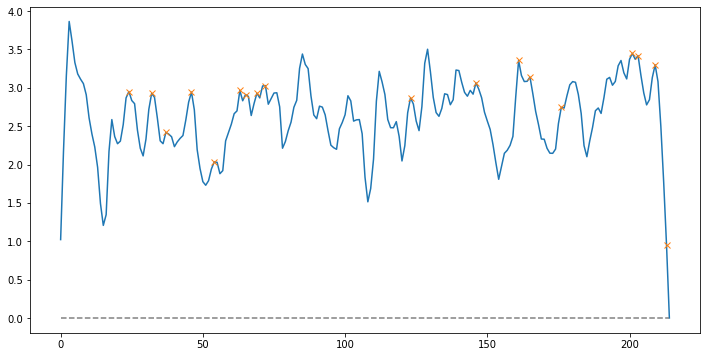

Peak count: 18
Frame text: 시멀레이러는 던졌다. 아젝스의 터져 어디서 시멀레이러님, 고정하시지요. 저놈은 어떻게 그도 말고 나사스는 화를 못하는 시멀레이러는 갸웃거리면서 나사스는 물었다. 

Similarity : 0.4860374610668998
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.16758042573928833   similarity loss:-0.08343468606472015


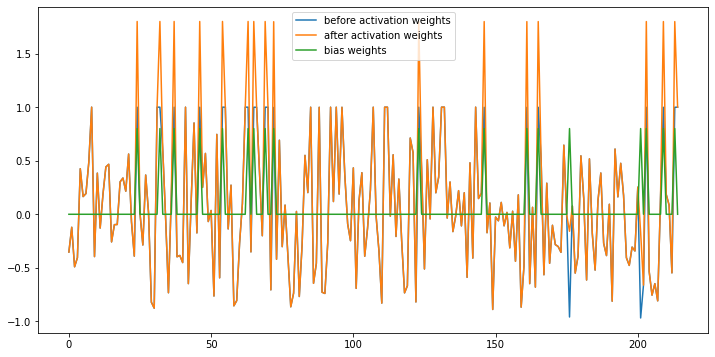

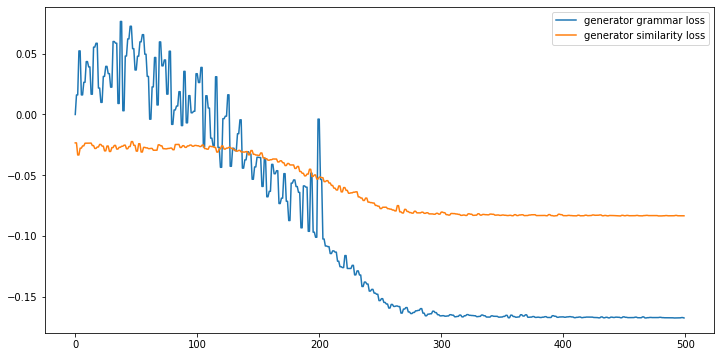

--------------------------------------------------
summary:
잘못 시멀레이러는 아젝스에게로 던졌다. 아젝스의 부딧친 터져 어디서 불었는지 사라졌다. 시멀레이러님, 고정하시지요. 나사스! 저놈은 사람이 어떻게 말일세! 공작 모든 걱정에 저 입에 소리쳤다. 그런 그도 정말 나지나 않을까걱정을 못했다. 말고 나사스는 화를 갸웃거리면서 나사스는 물었다. 
--------------------------------------------------
Num sentences: 10
Num querys: 8
Num sentences: 10
Num querys: 8
Num sentences: 13
Num querys: 8
Num sentences: 33
Num querys: 8
Num sentences: 31
[[0.00000000e+00 2.60462567e-01 8.49349928e-01 1.08614506e+00
  8.11755852e-01 9.94731691e-01 2.30668808e-01 9.74913205e-01
  9.28543992e-01 7.51201501e-01 4.53691666e-01 5.43110338e-01
  4.36977649e-01 8.53068084e-01 4.42208097e-01 8.02773855e-01
  8.51993151e-01 1.09858641e+00 9.16824990e-01 9.78051370e-01
  7.07553038e-01 4.95424107e-01 8.40419524e-01 4.00113051e-01
  1.09534382e+00 8.44388005e-01 7.80359600e-01 4.76620550e-01
  4.67156064e-01 8.21104020e-01 7.86567237e-01]
 [2.60462567e-01 1.11022302e-16 7.39948053e-01 1.05284003e+00
  7.37885751e-01 7.54731378e-01 1.680

In [207]:
test_result = {}
test_result['SAM+WGAN']=[]
test_result['BERT+LexRank']=[]
test_result['BESM']=[]
test_result['BESM+kobert']=[]
for intro,body,end in document[0:50]:
    org_text_1 = intro
    org_text_2 = body
    org_text_3 = end
    try:
        df1,dct1 = sam_wgan([org_text_1,org_text_2,org_text_3])
        df2,dct2 = bert_lexrank_sum([org_text_1,org_text_2,org_text_3])
        df3,dct3 = besm([org_text_1,org_text_2,org_text_3])
        df4,dct4 = besm_bert([org_text_1,org_text_2,org_text_3])
        test_result['SAM+WGAN'].append([dct1['comp ratio'],dct1['intro'][0],dct1['body'][0],dct1['ending'][0],dct1['var'],dct1['total'][0],dct1['grammar'][0]])
        test_result['BERT+LexRank'].append([dct2['comp ratio'],dct2['intro'][0],dct2['body'][0],dct2['ending'][0],dct2['var'],dct2['total'][0],dct2['grammar'][0]])
        test_result['BESM'].append([dct3['comp ratio'],dct3['intro'][0],dct3['body'][0],dct3['ending'][0],dct3['var'],dct3['total'][0],dct3['grammar'][0]])
        test_result['BESM+kobert'].append([dct4['comp ratio'],dct4['intro'][0],dct4['body'][0],dct4['ending'][0],dct4['var'],dct4['total'][0],dct4['grammar'][0]])
        result = pd.concat([df1, df2, df3, df4 ], ignore_index=True)
        print(result)
    except:
        print('Error!!! skip~')


In [208]:
df_data = {}
df_data['method'] = []
df_data['comp rate'] = []
df_data['intro'] = []
df_data['body'] = []
df_data['conclusion'] = []
df_data['isthmus'] = []
df_data['simlirality'] = []
df_data['grammarity'] = []
for key in test_result:
    df_data['method'].append(key)
    data = np.asarray(test_result[key])
    df_data['comp rate'].append(np.mean(data[:,0]))
    df_data['intro'].append(np.mean(data[:,1]))
    df_data['body'].append(np.mean(data[:,2]))
    df_data['conclusion'].append(np.mean(data[:,3]))
    df_data['isthmus'].append(np.mean(data[:,4]))
    df_data['simlirality'].append(np.mean(data[:,5]))
    df_data['grammarity'].append(np.mean(data[:,6]))

df = pd.DataFrame(df_data)
df

,method,comp rate,intro,body,conclusion,isthmus,simlirality,grammarity
0,SAM+WGAN,0.173057,0.585772,0.546560,0.572125,0.003475,0.565180,0.996853
1,BERT+LexRank,0.194813,0.304301,0.289069,0.301198,0.003961,0.294059,0.999633
2,BESM,0.276302,0.509513,0.484785,0.453483,0.006822,0.483674,0.999898
3,BESM+kobert,0.273513,0.518015,0.486818,0.450436,0.006501,0.487282,0.999896


Table2는 비교적 짧은 스토리에 대한 요약 방법별 결과 비교를 나타낸다.'comp ratio'는 요약의 압축율을 나타낸다. comp ration가 낮을 수록 요약의 압축이 많이 되었다는 의미있다. 비교 검증의 신뢰성을 위하여 가능한 comp ratio을 비슷하게 맞추었다. 아래의 표에서 알 수 있듯이, 비교적 짧은 문서에 대해서는 추출방법 대비 지협성 해소의 효과가 크게 나타나지 않는 것을 확인 할 수 있다. 결과적으로 추출 방법에 비해 유사성의 큰 변화가 없었다. 하지만, Table3의 비교적 긴 스토리에 대한 요약 방법별 결과 비교에서 보면, 제안의 방법이 추출 방법 대비 압축율 이 가장 낮음에도 불구하고  지협성 해소의 효과가 있음을 확인 할 수 있다. 서론, 본론, 결론의 각 유사성이 다른 방법에 비해 고르게 분포하고 있다. 또한 그림 4의 분포도에서 서론, 본론, 결론의 각 유사성의 편차가 제안 방법이 가장 낮게 나타나고 있음을 확인할 수 있었다. 

Table 2 shows the comparison of results by summary method for relatively short stories. 'comp ratio' indicates the compression ratio of the summary. The lower the comp ration, the more the summary is compressed. For the reliability of the comparison verification, the comp ratio was similarly adjusted with other method. As can be seen from the table below, it shows that for relatively short stories (document), the effect of resolving isthmus compared to the extractive method does not appear much. As a result, there was no significant change in summarization similarity compared to the extractive method. However, from the comparison of the results of each summary method for the relatively long story in Table 3, it shows that the proposed method has the effect of resolving isthmus, although the compression ratio is the lowest compared to the extractive method. The similarities of the introduction, body, and conclusion are evenly distributed compared to other methods. In addition, in the distribution map of Fig. 4, it was confirmed that the deviation of the similarity between the introduction, the body, and the conclusion was the lowest in the proposed method.

# 6. Conclution

본 논문에서 제안한 방법은 extractive 방법의 지협성을 해결 할 수 있었고, abstractive 방법에서 필요한 대량의 학습셋 없이도 WGAN의 비지도 학습에 의해서 abstractive의 효과를 얻을 수 있었다. 
 원문대비 유사성에 있어서는 비교적 짧은 스토리에서 Extractive 방법과 대등소이한 결과를 보였으나, 비교적 긴 스토리에서는 Extractive보다 Similarity가 서론, 본문, 결론 모두 높게 나타났다. 그러나, grammarlity는 가장 낮았다. 이는, 주요 어절을 기반으로 문법에 맞게 적당한 어절을 만들어내는 기본 알고리즘 구조상 나타나는 현상으로 이해할 수 있다.
 일반 DNN구조로 만들어진 Generator이기 때문에 문법 구성이 부드럽지 못했다. 향후에는 seq2seq 알고리즘으로 Generator를 구성하면 문법적으로 더 완성도 높은 문장을 생성할 것으로 기대한다. 

The method proposed in this paper was able to solve the isthmus of the extractive method, and obtained the abstractive effect by the unsupervised learning of WGAN without the need for a large number of training sets required in the abstractive method. In terms of similarity compared to the original text, the results were comparable to the extractive method in a relatively short story, but the similarity was higher in the introduction, body, and conclusion than in extractive in a relatively long story. However, the grammarlity was the lowest. This can be understood as a phenomenon that appears in the structure of a basic algorithm that generates words appropriate for grammar based on major words. Since it is a generator made with a general DNN structure, the grammar composition was not smooth. In the future, if the generator is configured with the seq2seq algorithm, it is expected that sentences with higher grammatical completion will be generated.

## Reference

[1] Rada Mihalcea and Paul Tarau, (2004). TextRank: Bringing Order into Texts <br>
[2] G¨une¸s Erkan. (2004). LexRank: Graph-based Lexical Centrality as Salience in Text Summarization <br>
[3] Susan T. Dumais (2005). "Latent Semantic Analysis". Annual Review of Information Science and Technology. 38: 188–230. <br>
[4] Hans Peter Luhn (1960). Keyword-in-context index for technical literature. American Documentation, 11(4):288–295. ISSN 0002-823 <br>
[5] Aria Haghighi, (2009). Exploring Content Models for Multi-Document Summarization <br>
[6] Colin Raffel. (2020). Exploring the Limits of Transfer Learning with a Unified Text-to-Text Transformer <br>
[7] Mike Lewis, (2019). BART: Denoising Sequence-to-Sequence Pre-training for Natural Language Generation, Translation, and Comprehension <br>
[8] Alec Radford, (2018). Language Models are Unsupervised Multitask Learners <br>
[9] Guillaume Lample, (2019). Cross-lingual Language Model Pretraining <br>
[10] Nils Reimers and Iryna Gurevych, (2019). Sentence-BERT: Sentence Embeddings using Siamese BERT-Networks <br>
[11] Sharma, P., & Li, Y. (2019). Self-Supervised Contextual Keyword and Keyphrase Retrieval with Self-Labelling <br>
[12] Jacob Devlin, (2019). BERT: Pre-training of Deep Bidirectional Transformers for Language Understanding <br>
[13] Ian J. Goodfellow, (2014). Generative Adversarial Nets <br>
[14] Yau-ShianWang, (2018). Learning to Encode Text as Human-Readable Summaries using Generative Adversarial Networks <br>
[15] Martin Arjovsky, (2017). Wasserstein GAN <br>